In [1]:
import numpy as np
import matplotlib.pyplot as plt
import math
import pandas as pd
#import uproot
import uproot3
from scipy import optimize as op

*Bin Conversions*
Available Functions:
Note: All functions return new arrays rather than altering the previous array
	New_Merged_Size(array_,merge_size_) returns what the size of the new merged array will be
	Merge_Bin_Edges(edges_,merge_size) merges the bin edges 
	Merge_Bins(array_,merge_size_) adds together every <merge_size_> values in an array
	Merge_Vals(yarray_,merge_size_) adds together every <merge_size_> ybin together in an array
	Merge_Bins(xarray_,merge_size_) averages every <merge_size_> xbins together in an array
	Count_Non_Zero(array_) counts the number of nonzero values in an array
	Count_Zero(array_) counts the number of zeros in an array
	Remove_Zeros(array_) remove zeros from an array
	Remove_Zeros_Y(yarray_) removes zero values from yarray
	Remove_Zeros_X(xarray_,yarray_) removes xbins where the corresponding y value was zero
	Count_InBounds(yarray_,low_,high_) counts the number of values that fall between bounds (or equal to)
	Count_OutBounds(yarray_,low_,high_) co

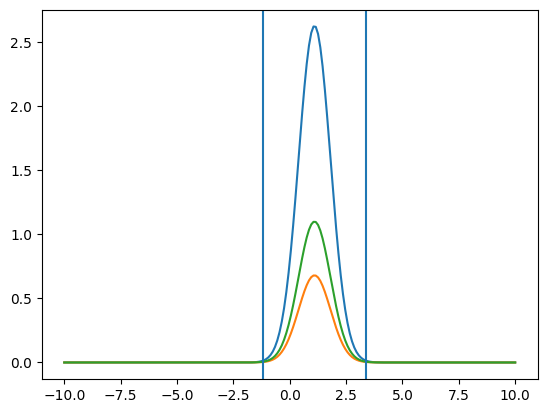

*Extracting Pieces for TH1*
Available Functions:
	Num_Xbins(TH1_) returns number of X bins for a TH1
	XEdges_1d(TH1_) returns edges of x bins for a TH1
	Center_Xbins(TH1_) returns center values for x bins for a TH1
	Values_1d(TH1_) returns the y values for a TH1
	Errors_1d(TH1_) returns the error values for TH1
	Errors2_1d(TH1_) returns the squared error values for TH1
Enjoy using TH1s

You have access to information regarding all bin numbers, bin maxes, bin mins
Each goes _VAR_max_ min, bins, res, etc. 
All the names of them as well as edges.
Q2_Bin_Name[ 5 ]
W_Bin_Name[ 29 ]
MM1_Bin_Name[ 14 ]
MM2_Bin_Name[ 14 ]
theta_Bin_Name[ 10 ]
alpha_Bin_Name[ 10 ]
phi_Bin_Name[ 10 ]
_var_set_name_ [i]
_Xij_name_[i][j]
Also _mm1_name_ etc. for all Xijs
def Q2_Corr(Q2bin_) corrects the cross section for simulation so far as Q2 is concerned


In [2]:
#Gain access to functions used to change some of the aspects regarding arrays and the things in them
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Bin\ Conversions.ipynb

#Gain Access to functions used to work with momentum binning
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Momentum\ Bins.ipynb

#Gain Access to functions used to work with Fitting Functions
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/Fitting\ Functions.ipynb

#Gain Access to functions used for TH2s 
#uproot or uproo4
#%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH2\ Functions.ipynb
#uproot3
%run /Users/cmc/analysis_phd/analysis_twopi_clas6/cut_determinations/e16/TH1\ Functions-uproot3.ipynb

#Gain Access to the proper binning for the the various variables
%run /Users/cmc/analysis_phd/fitting/single_diff/Friend\ Binning\ Values.ipynb

In [3]:
#date="06-13-2022"
date="07-15-2024"
par="pro"
SLURM_ID="13866486"
top="m"+par
dir="/Users/cmc/analysis_phd/root_files/cut_determination/cut_det_e16/"+date
#root_file=dir+"/exp_mm_"+par+"_e16_"+date+"_"+SLURM_ID+".root"
root_file=dir+"/sim_e16_clas6_mm_"+par+"_"+date+".root"
file=uproot3.open(root_file)


color_order = ['b','g','r']
cut_names=['tight','mid','loose']
cut_sig = [2.5,3,3.5]
sign2 = [-1,1]

In [4]:
Particle=''
if par == "pro":
    Particle = "Proton"
elif par == "pip":
    Particle = "\u03C0 +"
elif par == "pim":
    Particle = "\u03C0 -"

In [5]:
#The Various layers of TDirectories to get to the histograms
layer0='MM'
layer1='MM_'+top
layer2=layer1+"_no-cut"
layer3=[layer2+"_sec"+str(i+1) for i in range(6)]
layer4=[layer3[i]+"_clean" for i in range(6)]
layer51=[layer4[i]+"_W_dep" for i in range(6)]
layer52=[layer4[i]+"_W_Range" for i in range(6)]
dir_loc=[([layer0+'/'+layer1+'/'+layer2+'/'+layer3[i]+'/'+layer4[i]+'/'+layer51[i]],[layer0+'/'+layer1+'/'+layer2+'/'+layer3[i]+'/'+layer4[i]+'/'+layer52[i]]) for i in range(6)]
names1=[["MM_"+top+"_no-cut_clean_sec"+str(i+1)+"_W:"+W_Bin_Name[j] for j in range(_W_bins_)] for i in range(6)]
names2=["MM_"+top+"_no-cut_clean_sec"+str(i+1)+"_W:in_range" for i in range(6)]
#Histogram Names
hist_name=[[[file[dir_loc[i][0][0]][names1[i][j]] for j in range(_W_bins_)],file[dir_loc[i][1][0]][names2[i]]] for i in range(6)]
           

In [6]:
def fit_function(x_, bkgd_, n_, pars_):
    if bkgd_:
        gaus_pars = np.zeros(3)
        for i in range(3):
            gaus_pars[i] = pars_[i]
        poly_pars = np.zeros(n_+1)
        for i in range(n_+1):
            poly_pars[i] = pars_[i+3]
        return Gaus(x,*gaus_pars)+Poly(x,*poly_pars)
    else:
        return Gaus(x,*pars_)

In [7]:
x_tmp = Center_Xbins(hist_name[0][1])
print(x_tmp[50])
print(x_tmp[90])


1.1039999940991403
1.4239999988675118


Runtime Error1.2
	Just skip it for now


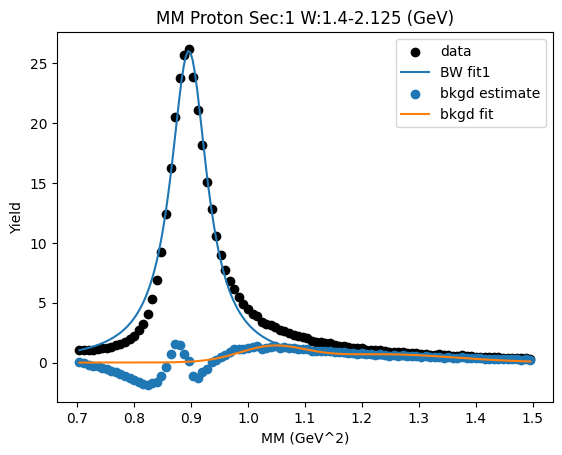

W bin: 0 1.400GeV-1.425GeV
Cut Bounds [[0.78625313 0.76787371 0.74971166]
 [0.98200247 1.00277292 1.02376074]]
Cut Bounds Err [[3.05325238e-06 3.61367636e-06 4.16082110e-06]
 [3.41222611e-06 4.12957782e-06 4.86218127e-06]]


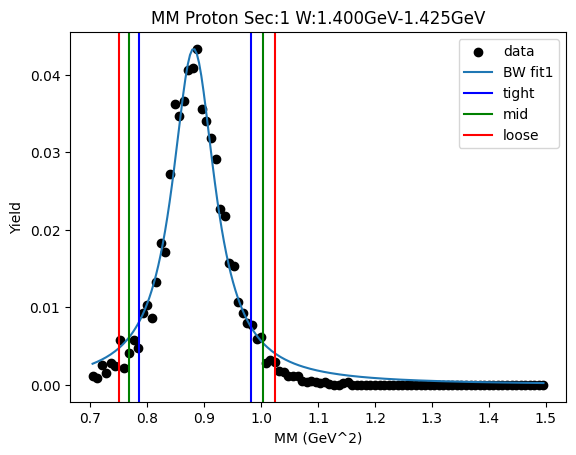

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.79472908 0.77780776 0.76106854]
 [0.97395705 0.99288133 1.01198769]]
Cut Bounds Err [[2.41736158e-06 2.86405268e-06 3.30124845e-06]
 [2.67609771e-06 3.23588841e-06 3.80674636e-06]]


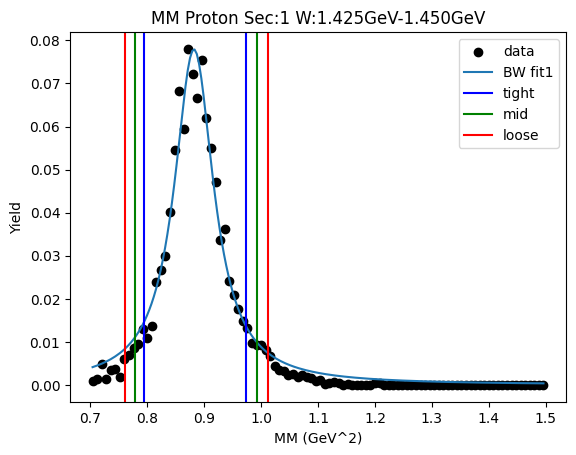

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.79826586 0.78090435 0.76373371]
 [0.98237938 1.00184057 1.02149264]]
Cut Bounds Err [[1.61866275e-06 1.91731738e-06 2.20946612e-06]
 [1.79565217e-06 2.17167282e-06 2.55525346e-06]]


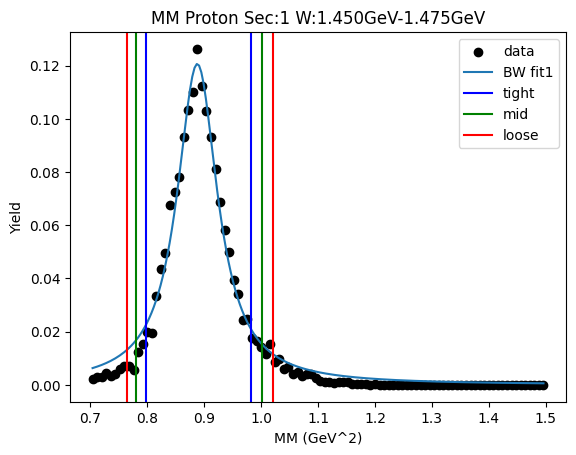

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.8019432  0.78517801 0.76858992]
 [0.97933559 0.99804888 1.01693927]]
Cut Bounds Err [[2.34842939e-06 2.78290626e-06 3.20834377e-06]
 [2.59520382e-06 3.13754830e-06 3.69046477e-06]]


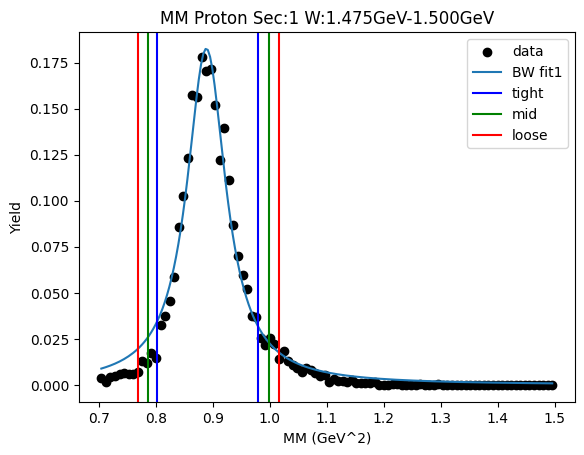

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.80917856 0.79297176 0.7769289 ]
 [0.98026365 0.99827387 1.01644803]]
Cut Bounds Err [[1.36656028e-06 1.62009158e-06 1.86860505e-06]
 [1.50410467e-06 1.81775587e-06 2.13731961e-06]]


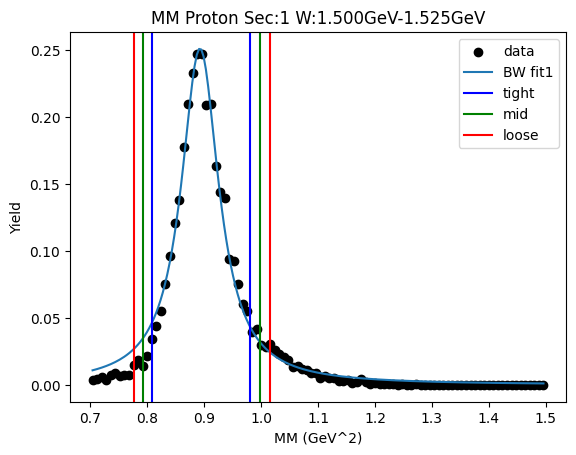

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.81246161 0.7958765  0.77946241]
 [0.98771937 1.0061858  1.02482327]]
Cut Bounds Err [[1.38331249e-06 1.63962946e-06 1.89076075e-06]
 [1.52523113e-06 1.84357990e-06 2.16802098e-06]]


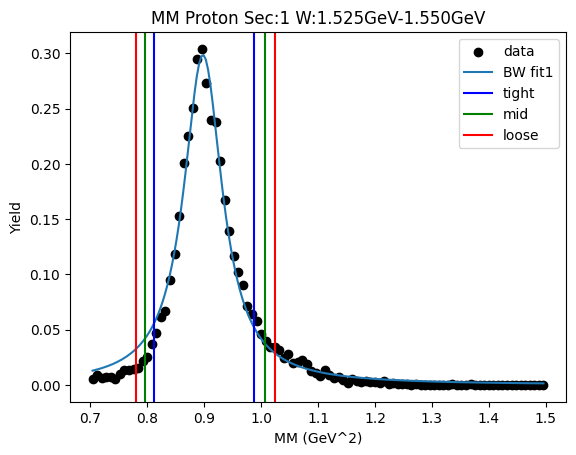

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.80531193 0.78732914 0.76954941]
 [0.99630775 1.01652413 1.03694356]]
Cut Bounds Err [[2.71912732e-06 3.21985888e-06 3.70934660e-06]
 [3.02443483e-06 3.65862181e-06 4.30582843e-06]]


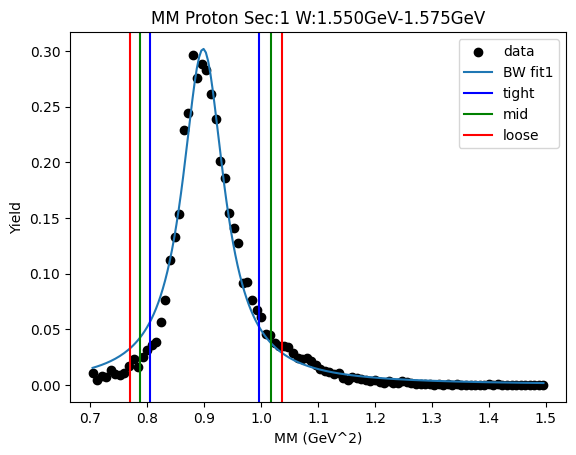

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.80915881 0.79217845 0.77537815]
 [0.98886583 1.00782688 1.02696799]]
Cut Bounds Err [[2.22886432e-06 2.64109912e-06 3.04472148e-06]
 [2.46397011e-06 2.97897020e-06 3.50404153e-06]]


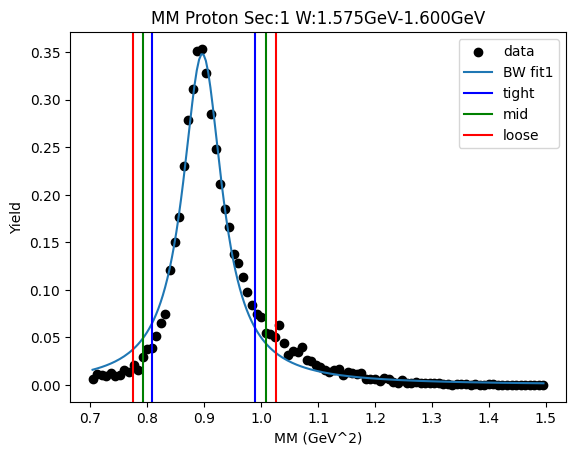

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.80707473 0.78972268 0.7725592 ]
 [0.99096631 1.01039259 1.03000743]]
Cut Bounds Err [[2.49534716e-06 2.95610494e-06 3.40696162e-06]
 [2.76505355e-06 3.34370240e-06 3.93388386e-06]]


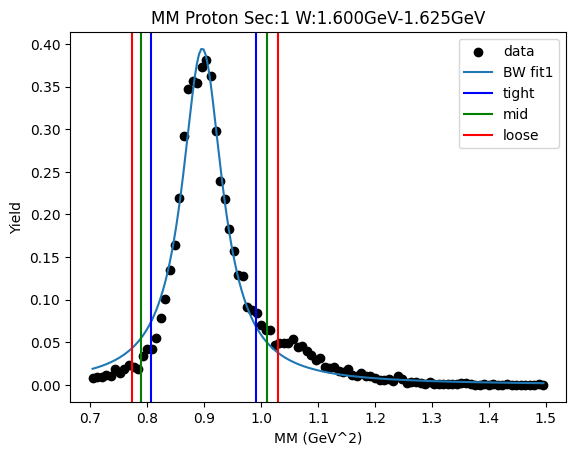

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.80884429 0.79231968 0.77596562]
 [0.98347032 1.00187091 1.02044206]]
Cut Bounds Err [[1.38897168e-06 1.64632787e-06 1.89847195e-06]
 [1.53158660e-06 1.85127950e-06 2.17709369e-06]]


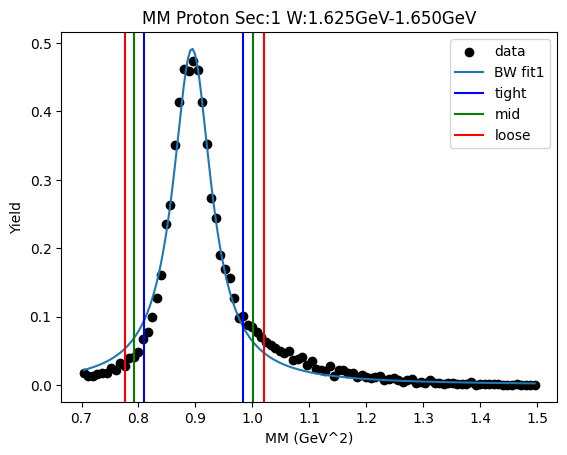

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.81289031 0.79711802 0.78150026]
 [0.97911147 0.99658342 1.01420989]]
Cut Bounds Err [[1.33717657e-06 1.58575313e-06 1.82958846e-06]
 [1.46753630e-06 1.77309127e-06 2.08426421e-06]]


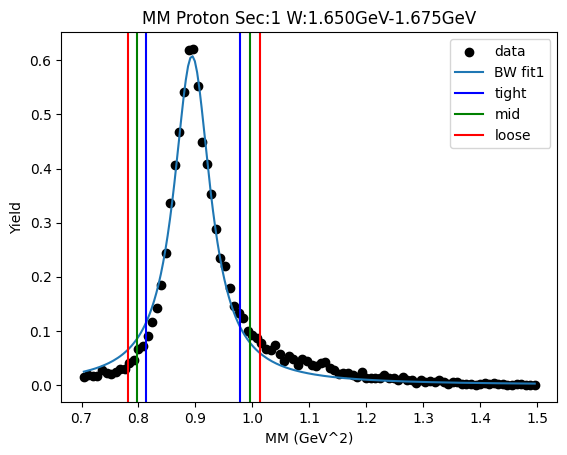

W bin: 11 1.675GeV-1.700GeV
background fit [0.0144189  1.07058016 0.02111295 0.01745196 0.97573099 0.17489159]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8863047103304209 0.8936723794699875
Breit-Wigner Peak [0.0420537  0.94339204 0.03504204]
Gaus2 [0.08385185 0.94       0.02177183]
Gaus3 [0.03608764 1.0413343  0.09187441]
Cut Bounds [[0.82104126 0.80758533 0.79424058]
 [0.96171524 0.97639411 0.99118416]]
Cut Bounds Err [[1.90389565e-06 2.23030929e-06 2.55530725e-06]
 [2.06055353e-06 2.45235567e-06 2.85459346e-06]]


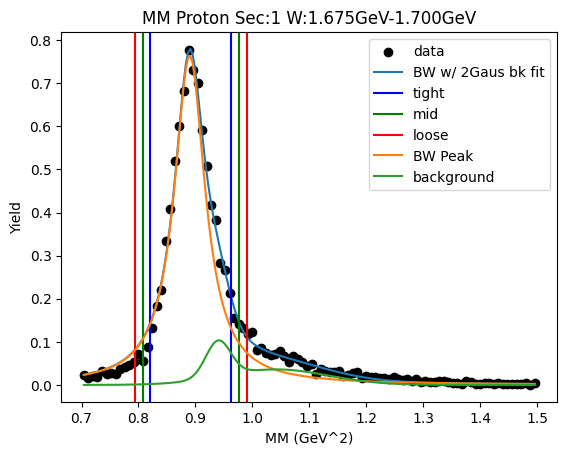

W bin: 12 1.700GeV-1.725GeV
background fit [0.01149089 0.98798151 0.01748378 0.02807998 0.97113509 0.17392517]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8886675125873716 0.8957220234723228
Breit-Wigner Peak [0.04533946 0.94456062 0.03428924]
Gaus2 [0.10987729 0.94       0.0504175 ]
Gaus3 [0.02896055 1.09298795 0.10633682]
Cut Bounds [[0.82461421 0.81141745 0.79832714]
 [0.96243661 0.97680433 0.9912785 ]]
Cut Bounds Err [[1.72804403e-06 2.05526468e-06 2.37718187e-06]
 [1.86687597e-06 2.25501469e-06 2.64892588e-06]]


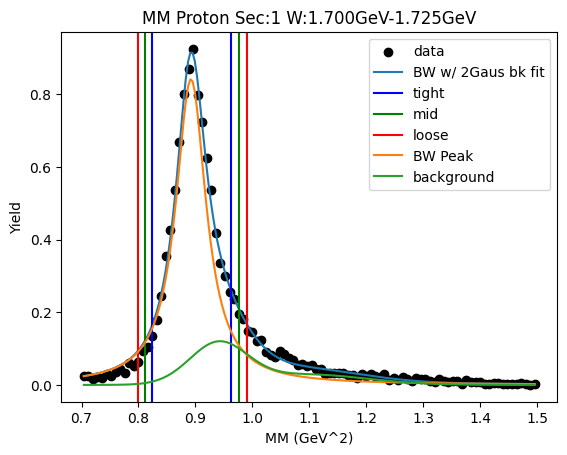

W bin: 13 1.725GeV-1.750GeV
background fit [0.01455468 1.02252156 0.0341513  0.02169024 1.07030136 0.14290367]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8909043784385883 0.8989399991620767
Breit-Wigner Peak [0.04823306 0.94600327 0.03659604]
Gaus2 [0.13581565 0.94       0.0454029 ]
Gaus3 [0.03804291 1.08934505 0.10044986]
Cut Bounds [[0.82277837 0.80871337 0.79476963]
 [0.9700974  0.98549621 1.00101628]]
Cut Bounds Err [[1.40929639e-06 1.66706089e-06 1.92135446e-06]
 [1.53027181e-06 1.84027036e-06 2.15629131e-06]]


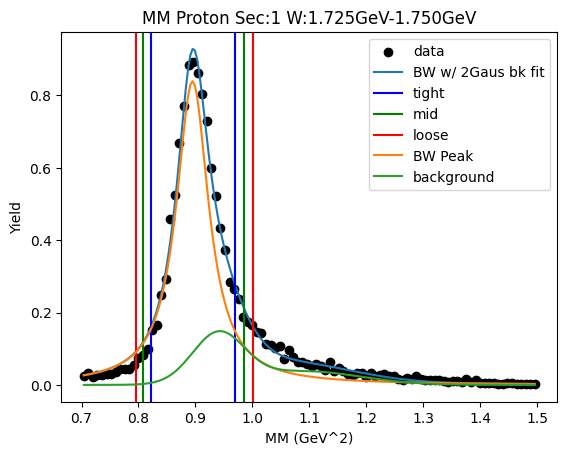

W bin: 14 1.750GeV-1.775GeV
background fit [0.02532231 0.99504026 0.06976938 0.01761561 1.10620256 0.15460813]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8904455255730019 0.8981826432112829
Breit-Wigner Peak [0.04310627 0.94568181 0.03590988]
Gaus2 [0.17120928 0.94       0.04710202]
Gaus3 [0.04432077 1.08503091 0.10806619]
Cut Bounds [[0.8235196  0.80971096 0.79601907]
 [0.96802735 0.98312026 0.99832992]]
Cut Bounds Err [[1.88891700e-06 2.24270523e-06 2.59084183e-06]
 [2.04795175e-06 2.47121488e-06 2.90145746e-06]]


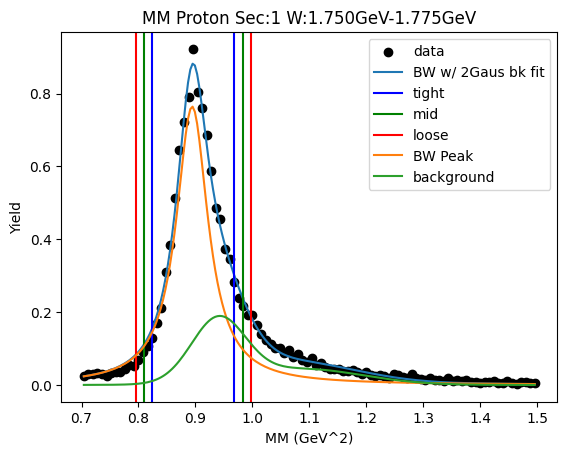

W bin: 15 1.775GeV-1.800GeV
background fit [0.03704709 1.03182758 0.04595406 0.01929116 1.15518333 0.14294181]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8887675442485745 0.8969591311101757
Breit-Wigner Peak [0.04586494 0.94491446 0.03694949]
Gaus2 [0.12987867 0.94       0.04854853]
Gaus3 [0.05022545 1.07878287 0.10783724]
Cut Bounds [[0.82012313 0.80594591 0.79189231]
 [0.96869378 0.9842307  0.99989122]]
Cut Bounds Err [[2.90210305e-06 3.44633769e-06 3.98136005e-06]
 [3.15403534e-06 3.80849451e-06 4.47378150e-06]]


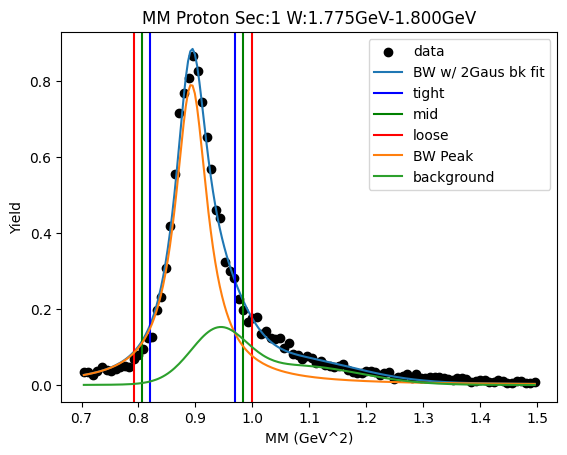

W bin: 16 1.800GeV-1.825GeV
background fit [0.03929321 1.03802851 0.06079176 0.02574831 1.17485933 0.14408627]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8873291288176965 0.8947017967823183
Breit-Wigner Peak [0.05126155 0.94393615 0.03505393]
Gaus2 [0.1229769  0.94       0.04838705]
Gaus3 [0.05822995 1.09515494 0.11732457]
Cut Bounds [[0.82200468 0.80853628 0.79517914]
 [0.96280754 0.97749971 0.99230314]]
Cut Bounds Err [[2.88517838e-06 3.42999724e-06 3.96586326e-06]
 [3.12252026e-06 3.77139771e-06 4.43024180e-06]]


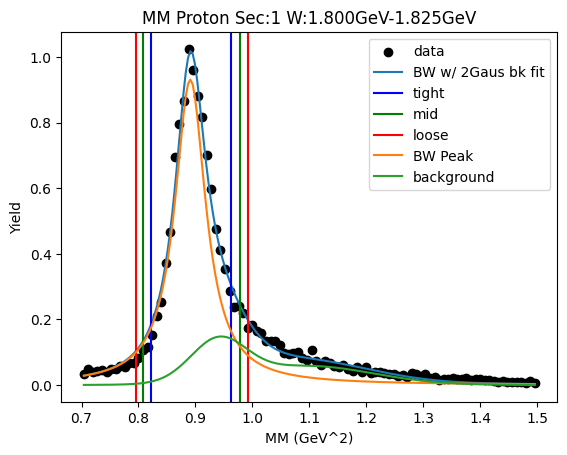

W bin: 17 1.825GeV-1.850GeV
background fit [0.05612461 1.057056   0.0695822  0.02100156 1.23676353 0.15481679]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8880183595125754 0.8952236816125855
Breit-Wigner Peak [0.05509724 0.94425686 0.03465382]
Gaus2 [0.12963386 0.94       0.04506846]
Gaus3 [0.07286192 1.0859933  0.1103928 ]
Cut Bounds [[0.82335861 0.8100323  0.79681473]
 [0.9626016  0.9771239  0.99175492]]
Cut Bounds Err [[1.98392376e-06 2.35652245e-06 2.72337020e-06]
 [2.14513068e-06 2.58818449e-06 3.03829673e-06]]


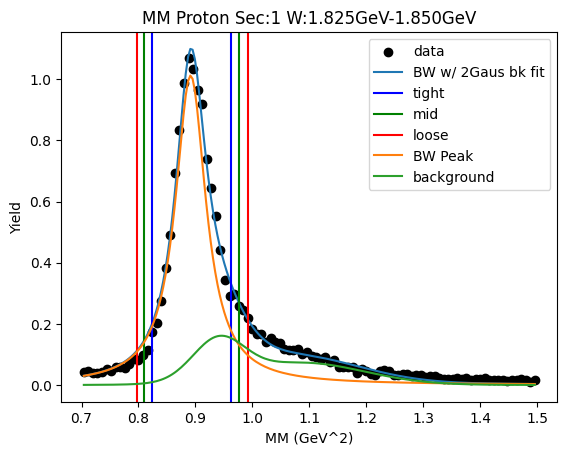

W bin: 18 1.850GeV-1.875GeV
background fit [0.05187887 1.05197604 0.1219927  0.01279179 1.31784061 0.2064292 ]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8881206170722107 0.8950789663933043
Breit-Wigner Peak [0.05880916 0.94424562 0.03405473]
Gaus2 [0.13845787 0.94       0.04813058]
Gaus3 [0.0658188  1.10561785 0.12566103]
Cut Bounds [[0.8244952  0.81138928 0.79838836]
 [0.96132938 0.9755903  0.98995622]]
Cut Bounds Err [[1.45093974e-06 1.72597906e-06 1.99656851e-06]
 [1.56672011e-06 1.89258165e-06 2.22323368e-06]]


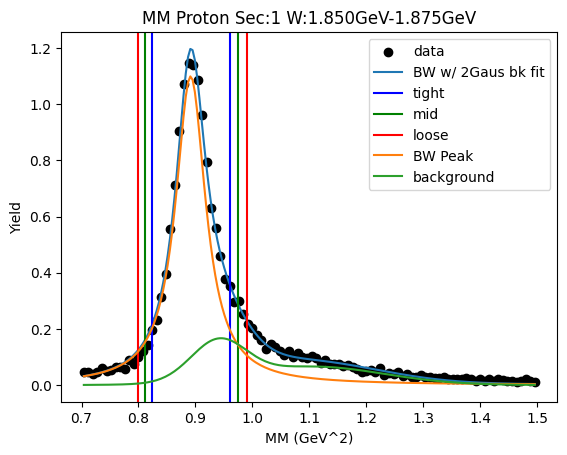

W bin: 19 1.875GeV-1.900GeV
background fit [0.02398886 1.03862847 0.05500278 0.0490501  1.12386452 0.17095337]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8882399324176266 0.8947412458174818
Breit-Wigner Peak [0.06176238 0.94418779 0.03291735]
Gaus2 [0.15470153 0.94       0.04452401]
Gaus3 [0.0762614  1.10611677 0.13762828]
Cut Bounds [[0.82658887 0.81390284 0.80131491]
 [0.95884489 0.97261006 0.98647334]]
Cut Bounds Err [[1.65475305e-06 1.96909825e-06 2.27853304e-06]
 [1.78222525e-06 2.15253630e-06 2.52811249e-06]]


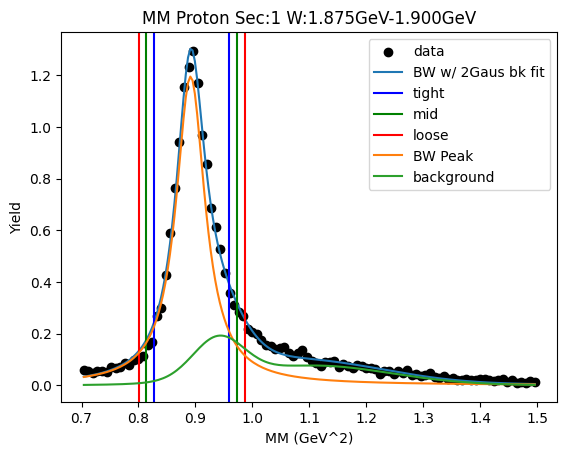

W bin: 20 1.900GeV-1.925GeV
background fit [0.04987406 1.03995456 0.1201627  0.02723735 1.26111152 0.18432599]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8878955329788416 0.8946645681190555
Breit-Wigner Peak [0.06727176 0.94407629 0.03358828]
Gaus2 [0.17799379 0.94       0.04482898]
Gaus3 [0.07513518 1.12243755 0.14631776]
Cut Bounds [[0.82508897 0.81215719 0.79932754]
 [0.96002471 0.97408007 0.98823758]]
Cut Bounds Err [[2.22301035e-06 2.64432570e-06 3.05897676e-06]
 [2.39790680e-06 2.89595781e-06 3.40129633e-06]]


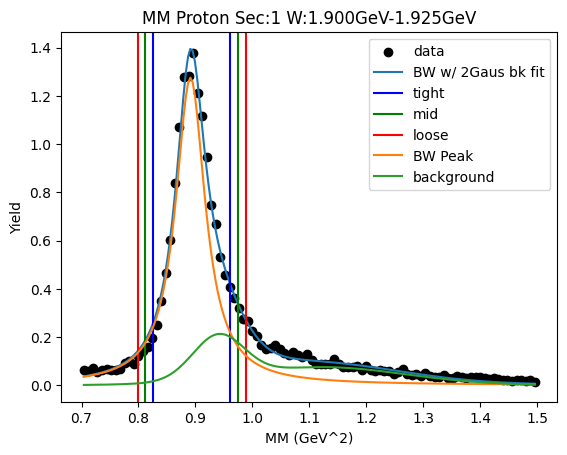

W bin: 21 1.925GeV-1.950GeV
background fit [0.05185249 1.04017732 0.05399973 0.04535036 1.20542898 0.17304506]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8892591110709931 0.8958585806608041
Breit-Wigner Peak [0.0740029  0.94475333 0.03316492]
Gaus2 [0.15898985 0.94       0.04983263]
Gaus3 [0.07600257 1.12947102 0.15149201]
Cut Bounds [[0.82713841 0.81435308 0.80166733]
 [0.9604689  0.97434966 0.98833001]]
Cut Bounds Err [[4.87766496e-06 5.80680028e-06 6.72093987e-06]
 [5.25611095e-06 6.35167015e-06 7.46249251e-06]]


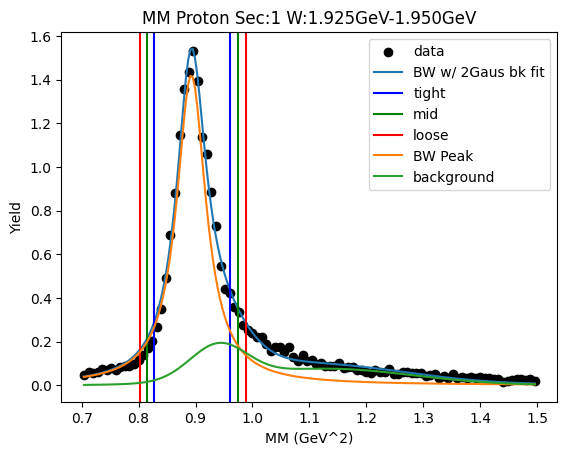

W bin: 22 1.950GeV-1.975GeV
background fit [0.05427657 1.03181142 0.04463974 0.05188432 1.12039141 0.26373046]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8899738537165619 0.8965055940172432
Breit-Wigner Peak [0.07842649 0.9451136  0.03299429]
Gaus2 [0.15229901 0.9727392  0.06687472]
Gaus3 [0.06008502 1.19855962 0.16623593]
Cut Bounds [[0.82812419 0.81539677 0.80276792]
 [0.96081932 0.97463093 0.9885411 ]]
Cut Bounds Err [[2.24126552e-06 2.66844613e-06 3.08875777e-06]
 [2.41416216e-06 2.91738698e-06 3.42756904e-06]]


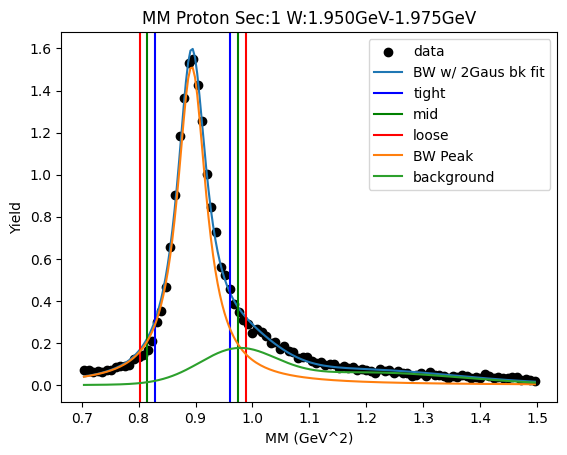

W bin: 23 1.975GeV-2.000GeV
background fit [0.04624176 1.01822317 0.05484574 0.05874926 1.13277974 0.23320731]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8885422389497276 0.8945030272597402
Breit-Wigner Peak [0.07508611 0.94420476 0.03151928]
Gaus2 [0.18596491 0.95015561 0.05556066]
Gaus3 [0.08048717 1.14501316 0.17035268]
Cut Bounds [[0.82932644 0.81715704 0.80507759]
 [0.9559675  0.96912632 0.98237508]]
Cut Bounds Err [[3.39473552e-06 4.04345964e-06 4.68221642e-06]
 [3.64472489e-06 4.40342438e-06 5.17215205e-06]]


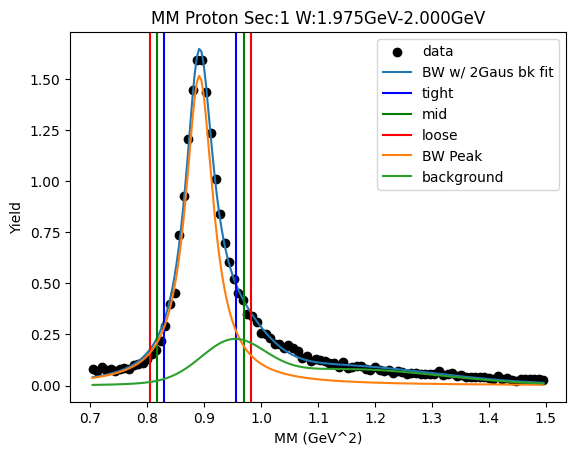

W bin: 24 2.000GeV-2.025GeV
background fit [0.0511347  1.04026814 0.06176072 0.05344366 1.206511   0.1987616 ]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8883335224819657 0.8947198102087797
Breit-Wigner Peak [0.07553132 0.9442069  0.03262486]
Gaus2 [0.21089818 0.94       0.04783577]
Gaus3 [0.09071163 1.1277319  0.17053954]
Cut Bounds [[0.82718953 0.8146112  0.80212925]
 [0.958273   0.97191137 0.9856461 ]]
Cut Bounds Err [[4.96163890e-06 5.90791252e-06 6.83912723e-06]
 [5.34031980e-06 6.45315649e-06 7.58121846e-06]]


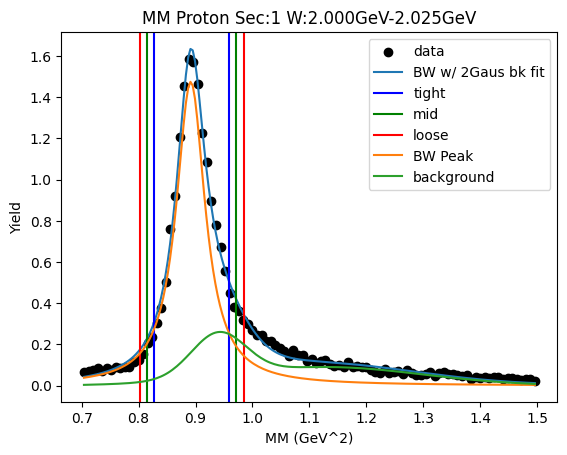

W bin: 25 2.025GeV-2.050GeV
background fit [0.08610706 1.06224634 0.1014721  0.041394   1.35971302 0.16735564]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8880974883636106 0.8946527832738178
Breit-Wigner Peak [0.07814456 0.94412665 0.03305373]
Gaus2 [0.18191416 0.94000002 0.05065834]
Gaus3 [0.09657279 1.12549752 0.17610799]
Cut Bounds [[0.82621393 0.81347845 0.80084188]
 [0.95900929 0.97283287 0.98675538]]
Cut Bounds Err [[8.71901467e-06 1.03814538e-05 1.20169686e-05]
 [9.39361071e-06 1.13528335e-05 1.33390926e-05]]


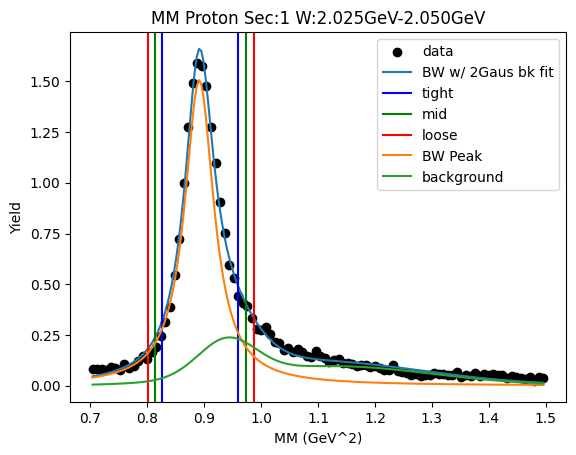

W bin: 26 2.050GeV-2.075GeV
background fit [0.05399971 1.04362906 0.05189828 0.0659111  1.15812189 0.26280831]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.887920040400575 0.8936515962395047
Breit-Wigner Peak [0.07692578 0.9438145  0.03090727]
Gaus2 [0.21496181 0.94       0.05061131]
Gaus3 [0.10490772 1.12360806 0.18577404]
Cut Bounds [[0.82980154 0.81786414 0.80601324]
 [0.9539323  0.96682106 0.97979631]]
Cut Bounds Err [[7.55746962e-06 9.00327634e-06 1.04272915e-05]
 [8.10304162e-06 9.78888095e-06 1.14965710e-05]]


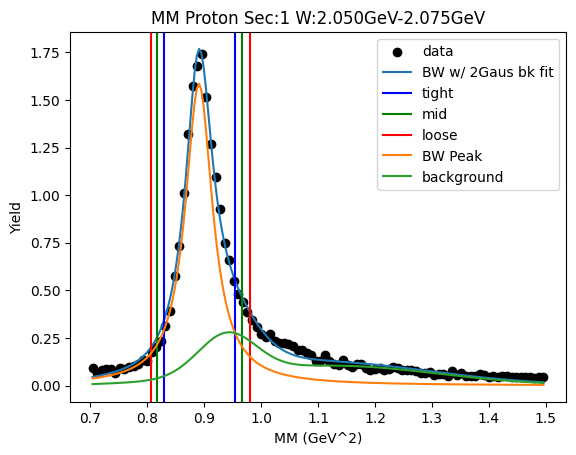

W bin: 27 2.075GeV-2.100GeV
background fit [0.06896212 1.05892015 0.1107709  0.05237829 1.28219709 0.20502456]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8880187999562199 0.894190089409155
Breit-Wigner Peak [0.08010082 0.94398329 0.03207099]
Gaus2 [0.20025972 0.94       0.04794709]
Gaus3 [0.10997998 1.13627555 0.18061203]
Cut Bounds [[0.82785471 0.81548413 0.80320668]
 [0.95668227 0.9700772  0.98356526]]
Cut Bounds Err [[5.15574890e-06 6.13999498e-06 7.10884729e-06]
 [5.54240883e-06 6.69673954e-06 7.86660095e-06]]


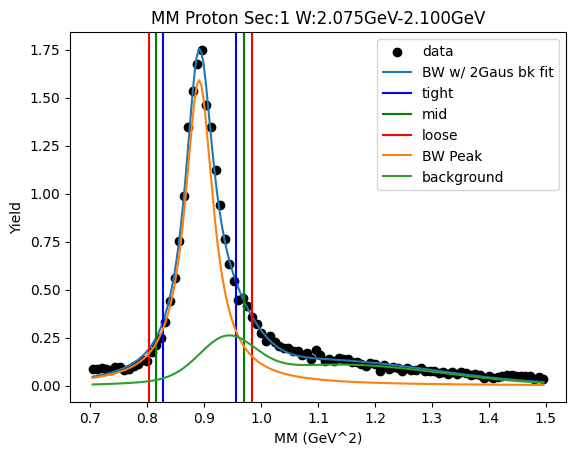

W bin: 28 2.100GeV-2.125GeV
background fit [0.06782553 1.06008805 0.09348938 0.05705386 1.27456863 0.20818078]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8876875494409135 0.8939749537402482
Breit-Wigner Peak [0.08241857 0.94383857 0.03237129]
Gaus2 [0.22093277 0.94       0.04586252]
Gaus3 [0.11201981 1.13715179 0.17794545]
Cut Bounds [[0.82701022 0.81453065 0.80214594]
 [0.95702417 0.97054738 0.98416546]]
Cut Bounds Err [[4.36607886e-06 5.19849221e-06 6.01784020e-06]
 [4.69675157e-06 5.67455819e-06 6.66573457e-06]]


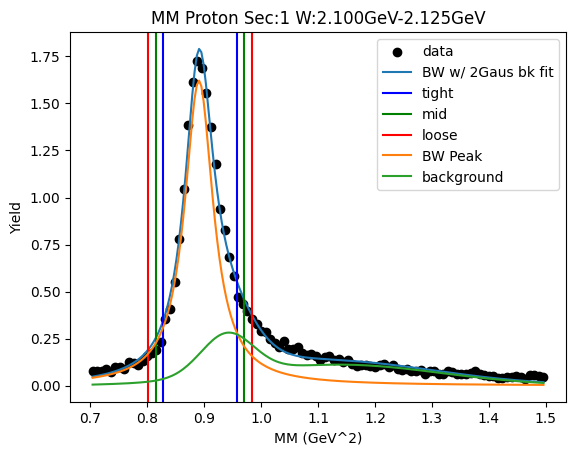

Runtime Error1.2
	Just skip it for now


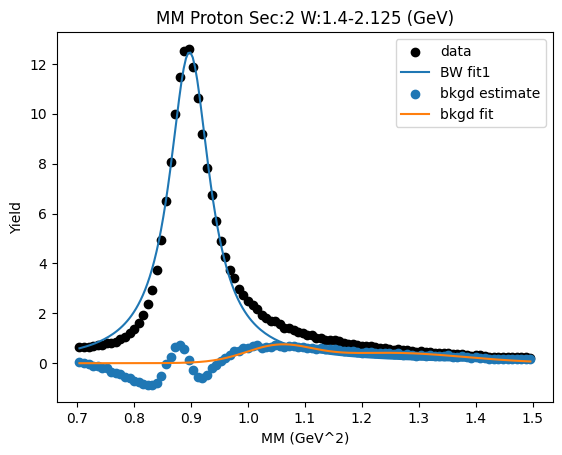

W bin: 0 1.400GeV-1.425GeV
Cut Bounds [[0.76800153 0.74750952 0.72729461]
 [0.98816187 1.01170193 1.03551909]]
Cut Bounds Err [[1.13366072e-05 1.33953965e-05 1.53972614e-05]
 [1.28592637e-05 1.55838047e-05 1.83724618e-05]]


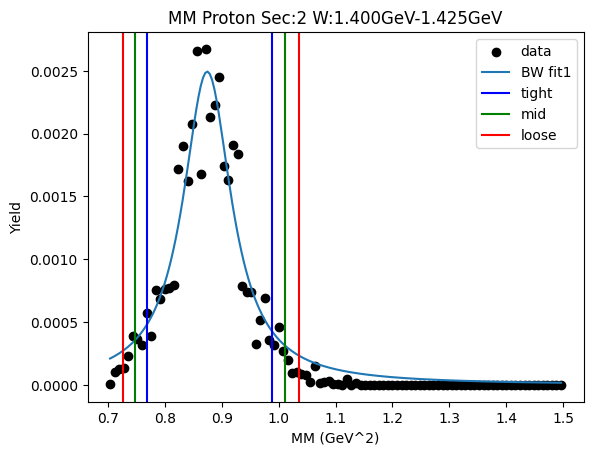

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.78494725 0.76607709 0.74743651]
 [0.98627627 1.0076719  1.02929712]]
Cut Bounds Err [[8.26576022e-06 9.77967201e-06 1.12565257e-05]
 [9.26535058e-06 1.12162486e-05 1.32095369e-05]]


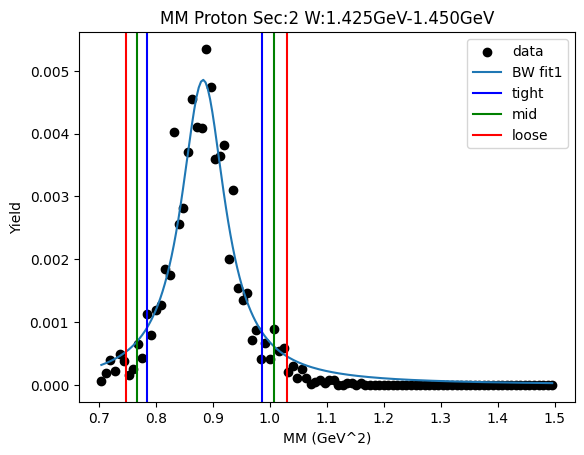

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.77967438 0.75928665 0.73916902]
 [0.99840737 1.02176623 1.0453952 ]]
Cut Bounds Err [[1.14241693e-05 1.35022378e-05 1.55242134e-05]
 [1.29277185e-05 1.56631333e-05 1.84619673e-05]]


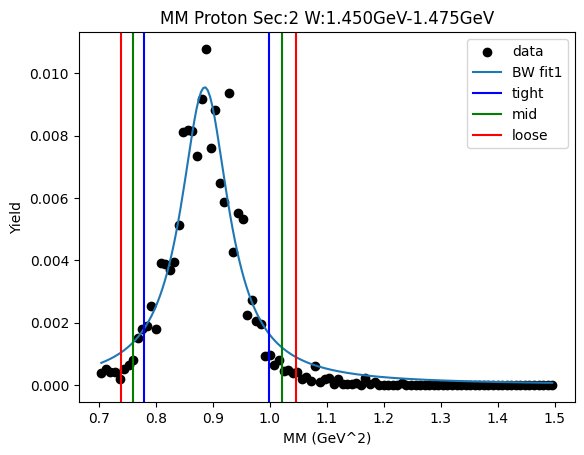

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.78700708 0.76768524 0.74860355]
 [0.99343328 1.01539669 1.03760023]]
Cut Bounds Err [[4.58506730e-06 5.42342648e-06 6.24075927e-06]
 [5.15140563e-06 6.23734882e-06 7.34727881e-06]]


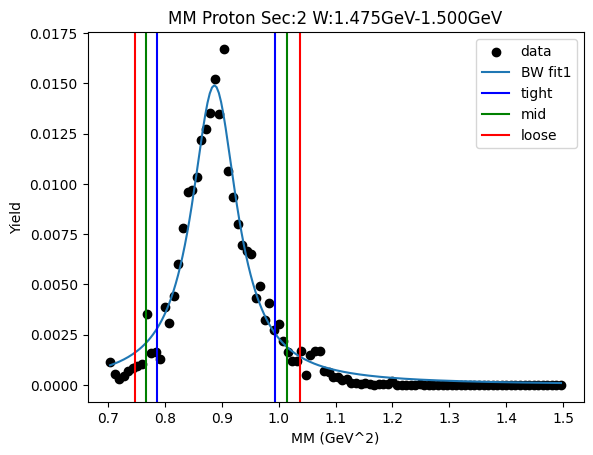

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.80497676 0.78802355 0.77125077]
 [0.98443228 1.00337018 1.02248851]]
Cut Bounds Err [[2.53049548e-06 2.99841385e-06 3.45651447e-06]
 [2.79838084e-06 3.38339398e-06 3.97987829e-06]]


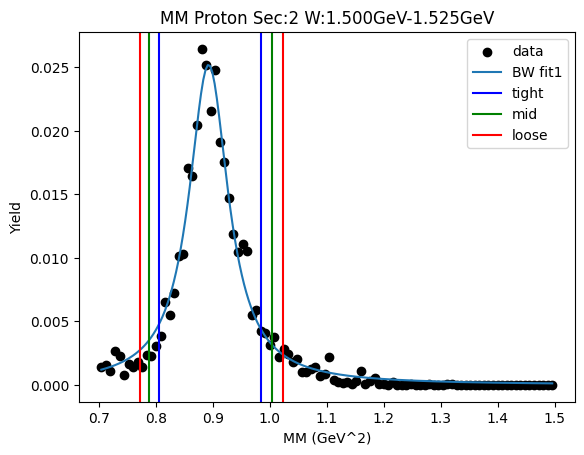

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.79978446 0.7799355  0.76033594]
 [1.01199161 1.03458408 1.05742596]]
Cut Bounds Err [[1.99008430e-06 2.35360937e-06 2.70790647e-06]
 [2.23858428e-06 2.71074045e-06 3.19341884e-06]]


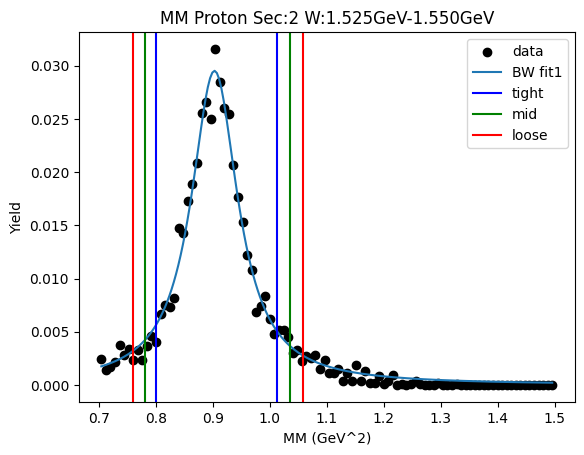

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.78761132 0.76589128 0.74447494]
 [1.02151457 1.04657519 1.0719395 ]]
Cut Bounds Err [[3.48907752e-06 4.12071157e-06 4.73421553e-06]
 [3.97353395e-06 4.81696922e-06 5.68078196e-06]]


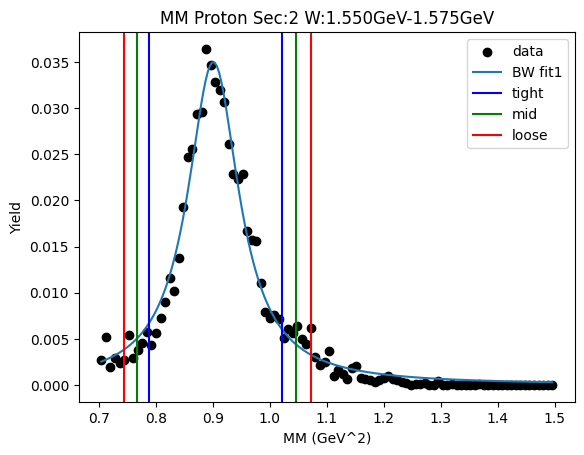

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.78086717 0.75876682 0.73698372]
 [1.0193195  1.04490962 1.07081698]]
Cut Bounds Err [[3.61443643e-06 4.26723422e-06 4.90071462e-06]
 [4.12959228e-06 5.00762361e-06 5.90728728e-06]]


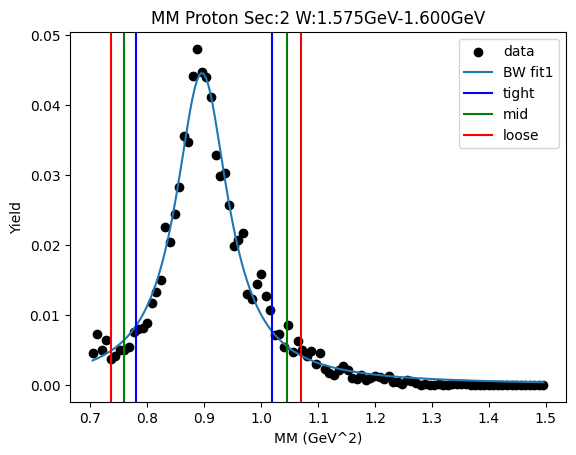

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.78699621 0.76637317 0.74602393]
 [1.00828622 1.03192118 1.05582995]]
Cut Bounds Err [[3.12604180e-06 3.69452898e-06 4.24763800e-06]
 [3.53834664e-06 4.28708600e-06 5.05321882e-06]]


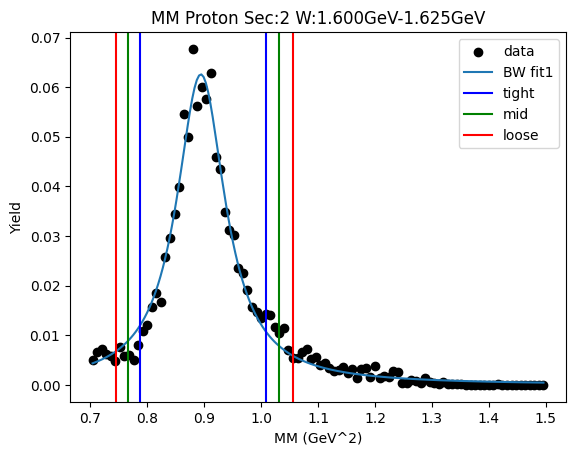

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.79266787 0.77344709 0.75446221]
 [0.99785038 1.01966611 1.04171773]]
Cut Bounds Err [[2.41326405e-06 2.85493620e-06 3.28569181e-06]
 [2.70764628e-06 3.27800864e-06 3.86085158e-06]]


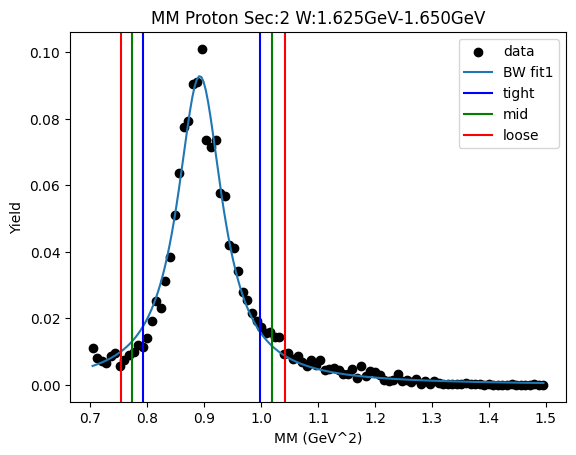

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.79779077 0.77932414 0.76107375]
 [0.99434996 1.01519517 1.03625662]]
Cut Bounds Err [[1.17004864e-06 1.38495263e-06 1.59482449e-06]
 [1.30625824e-06 1.58070427e-06 1.86094348e-06]]


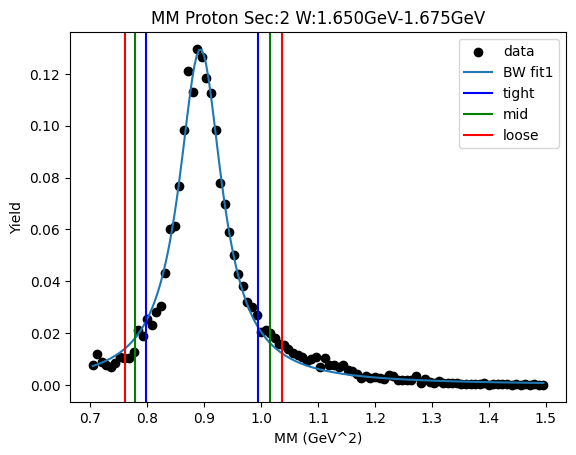

W bin: 11 1.675GeV-1.700GeV
Value Error2.2
	Just skip it for now
Cut Bounds [[0.80329105 0.78582118 0.76854337]
 [0.98855306 1.00813559 1.02791018]]
Cut Bounds Err [[0.09799485 0.11759385 0.13719285]
 [0.09799515 0.11759415 0.13719315]]


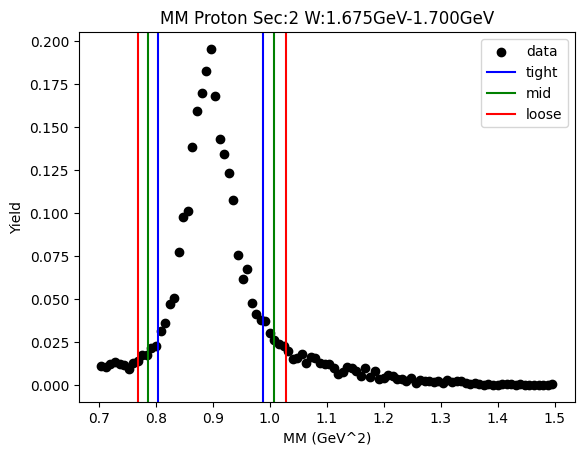

W bin: 12 1.700GeV-1.725GeV
background fit [5.14009171e-03 1.01473808e+00 1.36545306e-01 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8912026436815675 0.9020623615286917
Breit-Wigner Peak [0.0157801  0.94690681 0.04254354]
Gaus2 [0.01229273 0.98574481 0.08190853]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.81296861 0.79672745 0.78065015]
 [0.98439316 1.00243691 1.02064452]]
Cut Bounds Err [[5.64736962e-06 6.70840285e-06 7.74681857e-06]
 [6.21432008e-06 7.52476203e-06 8.85793350e-06]]


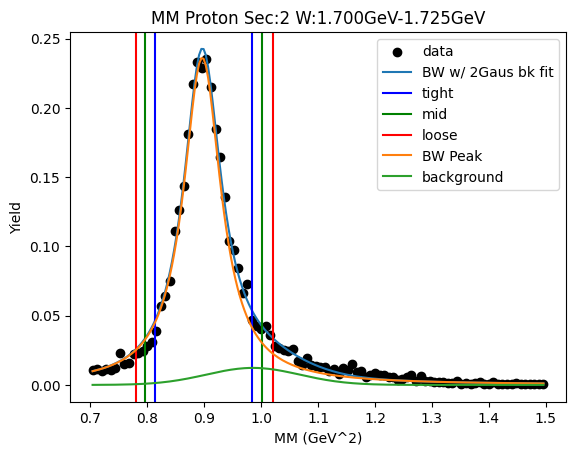

W bin: 13 1.725GeV-1.750GeV
background fit [8.47539002e-03 1.01194072e+00 1.21246117e-01 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.890530798373697 0.901321298229518
Breit-Wigner Peak [0.01763425 0.9465337  0.04240774]
Gaus2 [0.02991525 0.96768348 0.0688378 ]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.81255636 0.7963709  0.78034827]
 [0.98336639 1.00134294 1.01948232]]
Cut Bounds Err [[6.96557958e-06 8.27303587e-06 9.55289889e-06]
 [7.66281238e-06 9.27680945e-06 1.09189479e-05]]


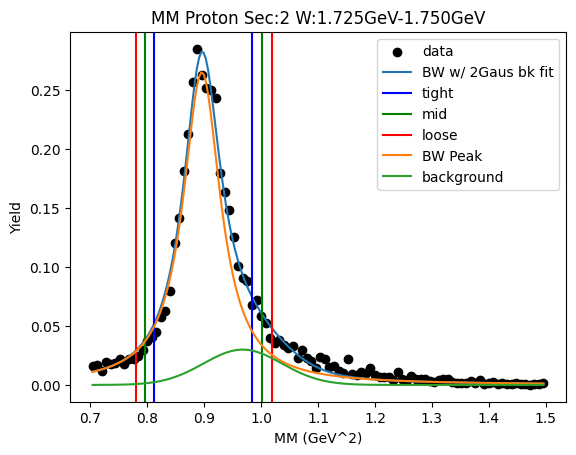

W bin: 14 1.750GeV-1.775GeV
background fit [1.29236735e-02 1.04219175e+00 8.63936015e-02 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8912692920833449 0.9029976966720508
Breit-Wigner Peak [0.01870006 0.94717131 0.04421237]
Gaus2 [0.03475091 0.98564811 0.08138192]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.81024639 0.7933999  0.7767304 ]
 [0.98844508 1.00723833 1.02620857]]
Cut Bounds Err [[9.42050448e-06 1.11855721e-05 1.29113939e-05]
 [1.04049951e-05 1.26031253e-05 1.48407483e-05]]


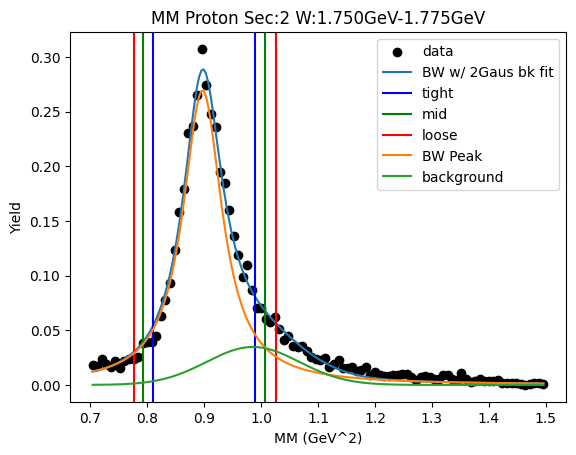

W bin: 15 1.775GeV-1.800GeV
background fit [1.35664641e-02 1.05055476e+00 1.18452634e-01 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8885956282208749 0.9011873183125312
Breit-Wigner Peak [0.02132038 0.94598704 0.04581064]
Gaus2 [0.03322303 0.99823842 0.09147862]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.80506171 0.78766577 0.77045984]
 [0.98947139 1.00895739 1.02863339]]
Cut Bounds Err [[1.54534568e-05 1.83415953e-05 2.11627511e-05]
 [1.71321819e-05 2.07588138e-05 2.44527344e-05]]


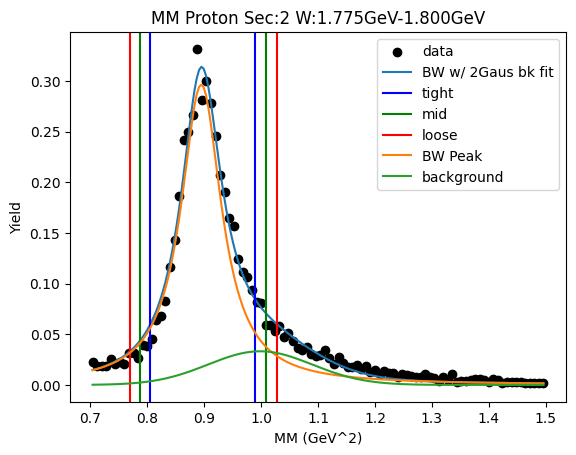

W bin: 16 1.800GeV-1.825GeV
background fit [1.99010197e-02 1.06452360e+00 1.10250283e-01 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8888113137509508 0.8992443660631388
Breit-Wigner Peak [0.02407988 0.94553045 0.04169943]
Gaus2 [0.03942623 1.00888485 0.10100046]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.81210622 0.7961942  0.7804396 ]
 [0.97988527 0.99752905 1.01533027]]
Cut Bounds Err [[6.13176591e-06 7.28530329e-06 8.41474866e-06]
 [6.73545226e-06 8.15456708e-06 9.59787669e-06]]


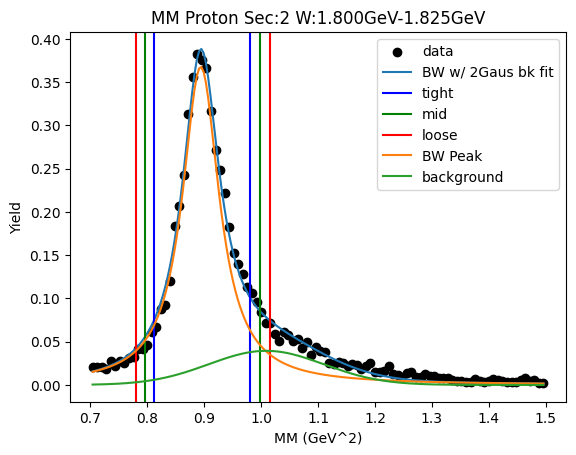

W bin: 17 1.825GeV-1.850GeV
background fit [2.38062015e-02 1.08831396e+00 1.03844218e-01 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8906123206884637 0.9018744867664639
Breit-Wigner Peak [0.02950689 0.94670133 0.04332468]
Gaus2 [0.03689554 1.03967781 0.1104334 ]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.81110061 0.79458189 0.77823311]
 [0.98563478 1.00402289 1.02258094]]
Cut Bounds Err [[4.14801100e-06 4.92598592e-06 5.68707982e-06]
 [4.57257192e-06 5.53726927e-06 6.51903511e-06]]


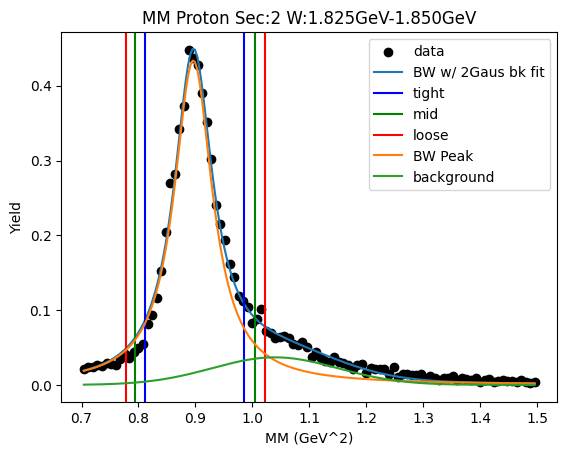

W bin: 18 1.850GeV-1.875GeV
background fit [2.58155910e-02 1.09251512e+00 1.42670018e-01 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8907389316559347 0.901290170332099
Breit-Wigner Peak [0.0332327  0.94658045 0.04193495]
Gaus2 [0.04456575 1.03820874 0.12110785]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.81354773 0.79753201 0.78167551]
 [0.98246177 1.00022887 1.01815517]]
Cut Bounds Err [[4.42509953e-06 5.25714553e-06 6.07174842e-06]
 [4.86283301e-06 5.88742829e-06 6.92958940e-06]]


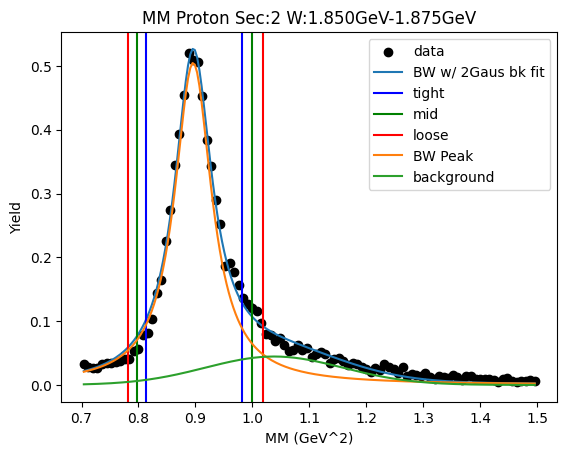

W bin: 19 1.875GeV-1.900GeV
background fit [2.92959642e-02 1.11026342e+00 1.60917685e-01 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8905520274076573 0.9003949685761119
Breit-Wigner Peak [0.03769474 0.94629461 0.04050297]
Gaus2 [0.04479397 1.06168584 0.13895716]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.81578172 0.80028895 0.7849447 ]
 [0.97887847 0.99600505 1.01328016]]
Cut Bounds Err [[3.12791584e-06 3.71717243e-06 4.29456737e-06]
 [3.42635584e-06 4.14686665e-06 4.87938019e-06]]


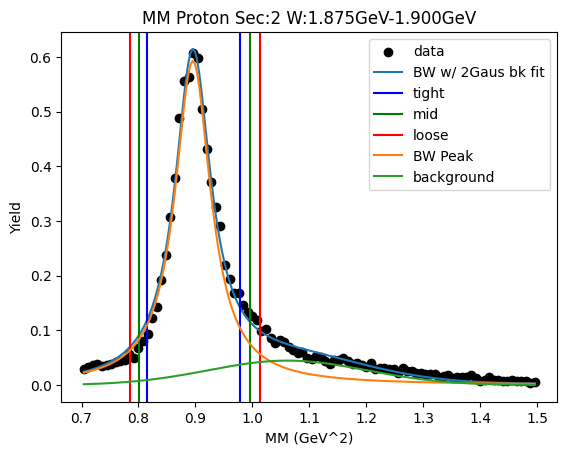

W bin: 20 1.900GeV-1.925GeV
background fit [3.21396471e-02 1.10321986e+00 2.01785559e-01 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.889954357706145 0.8993660399289692
Breit-Wigner Peak [0.04357146 0.94586479 0.03960573]
Gaus2 [0.04784326 1.07697821 0.15028588]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.81672978 0.80156976 0.78655176]
 [0.97614112 0.99286336 1.00972763]]
Cut Bounds Err [[2.85334207e-06 3.39147547e-06 3.91905623e-06]
 [3.11939913e-06 3.77452895e-06 4.44037819e-06]]


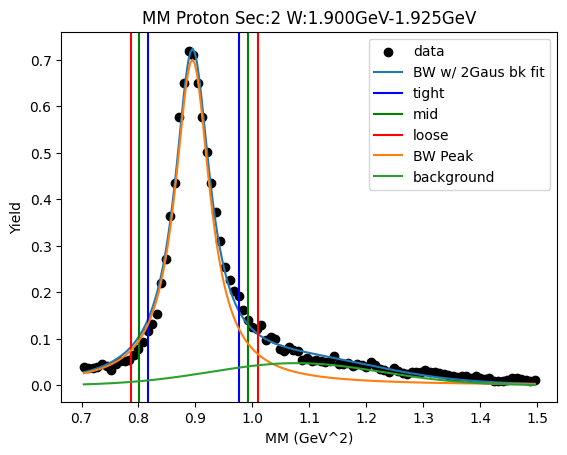

W bin: 21 1.925GeV-1.950GeV
background fit [3.29957788e-02 1.09202561e+00 2.23131205e-01 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8908565526887002 0.9006569864446619
Breit-Wigner Peak [0.04929822 0.94644428 0.04041541]
Gaus2 [0.05373598 1.0676602  0.137895  ]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.81622038 0.80075676 0.78544103]
 [0.97899032 0.99608069 1.01331895]]
Cut Bounds Err [[4.73231351e-06 5.62387899e-06 6.49755272e-06]
 [5.18273485e-06 6.27238809e-06 7.38016552e-06]]


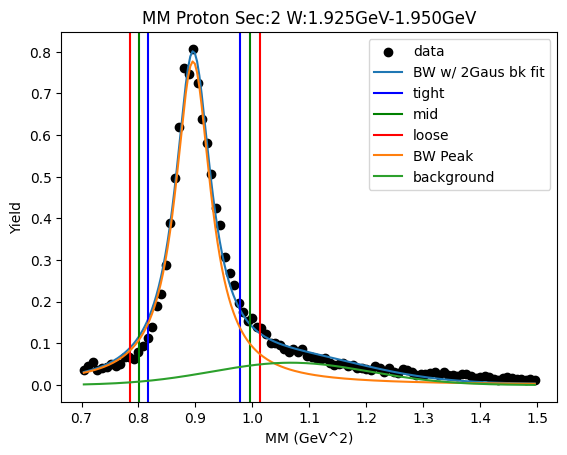

W bin: 22 1.950GeV-1.975GeV
background fit [4.15210318e-02 1.08590201e+00 2.03826682e-01 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.891515779937666 0.9012743910012234
Breit-Wigner Peak [0.05252674 0.94678143 0.04032909]
Gaus2 [0.07067415 1.05200926 0.13108367]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.81699571 0.80155761 0.78626675]
 [0.97947584 0.99653376 1.01373893]]
Cut Bounds Err [[4.58276098e-06 5.44646092e-06 6.29285441e-06]
 [5.01780964e-06 6.07285665e-06 7.14538758e-06]]


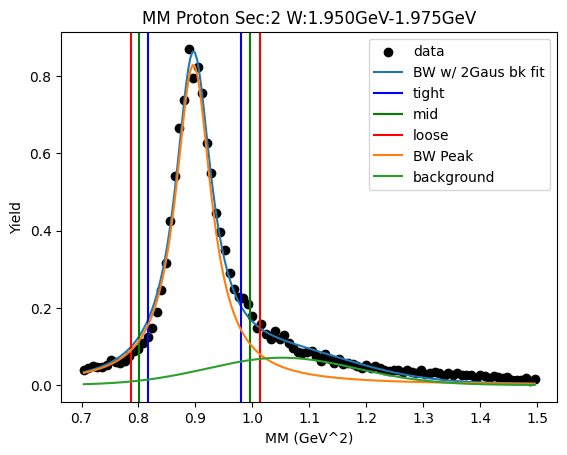

W bin: 23 1.975GeV-2.000GeV
background fit [4.85714270e-02 1.08774399e+00 2.18487451e-01 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8920553415612777 0.9009537625848376
Breit-Wigner Peak [0.0548523  0.94683924 0.03851065]
Gaus2 [0.07756186 1.06368757 0.14207661]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.8206013  0.80582348 0.79117993]
 [0.97576468 0.99201954 1.00840866]]
Cut Bounds Err [[2.98995064e-06 3.55491124e-06 4.10913857e-06]
 [3.26039685e-06 3.94429070e-06 4.63907550e-06]]


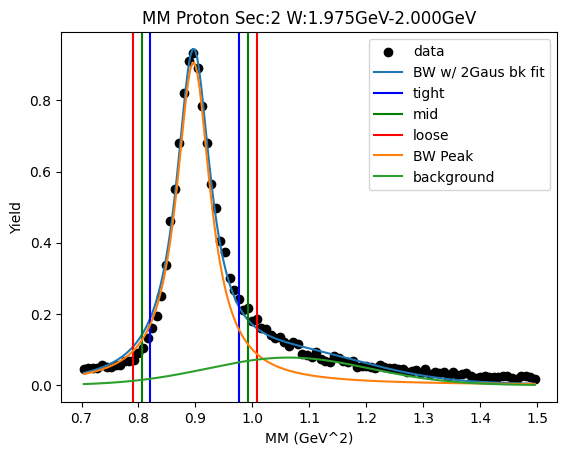

W bin: 24 2.000GeV-2.025GeV
background fit [4.99143189e-02 1.09927716e+00 2.25285501e-01 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.891597905566316 0.9006226052546972
Breit-Wigner Peak [0.06009649 0.946631   0.03878294]
Gaus2 [0.07291249 1.08595944 0.15306464]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.81969946 0.80482584 0.79008841]
 [0.97592557 0.99229717 1.00880496]]
Cut Bounds Err [[2.92899708e-06 3.48205826e-06 4.02454478e-06]
 [3.19594990e-06 3.86639263e-06 4.54760278e-06]]


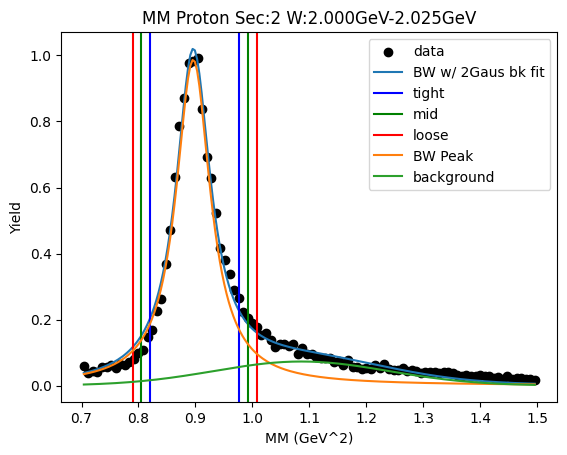

W bin: 25 2.025GeV-2.050GeV
background fit [5.89976640e-02 1.11011208e+00 2.12131491e-01 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.890512470506058 0.8992637036882122
Breit-Wigner Peak [0.06345523 0.94598525 0.03819082]
Gaus2 [0.08565864 1.08510082 0.1536075 ]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.81967078 0.80502348 0.79050823]
 [0.97340675 0.98950665 1.0057386 ]]
Cut Bounds Err [[2.68380552e-06 3.19099147e-06 3.68864069e-06]
 [2.92468093e-06 3.53777923e-06 4.16059759e-06]]


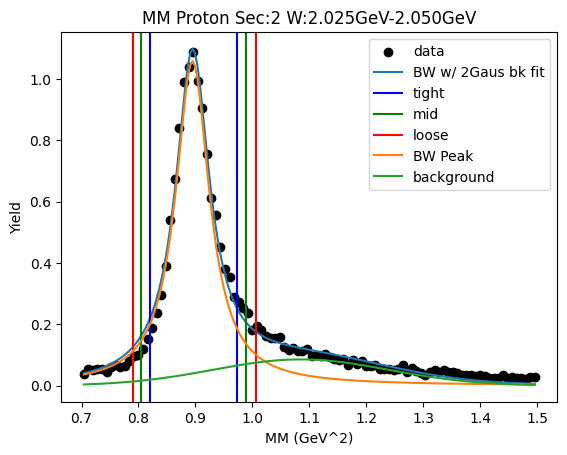

W bin: 26 2.050GeV-2.075GeV
background fit [6.37359297e-02 1.09492850e+00 2.36176765e-01 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8907082365121002 0.8989202546348525
Breit-Wigner Peak [0.06548748 0.94594622 0.03699554]
Gaus2 [0.09299309 1.0840241  0.15953613]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.82190409 0.80769382 0.79360746]
 [0.97082234 0.98639571 1.002093  ]]
Cut Bounds Err [[2.93699644e-06 3.49298700e-06 4.03889558e-06]
 [3.19199887e-06 3.86010552e-06 4.53851494e-06]]


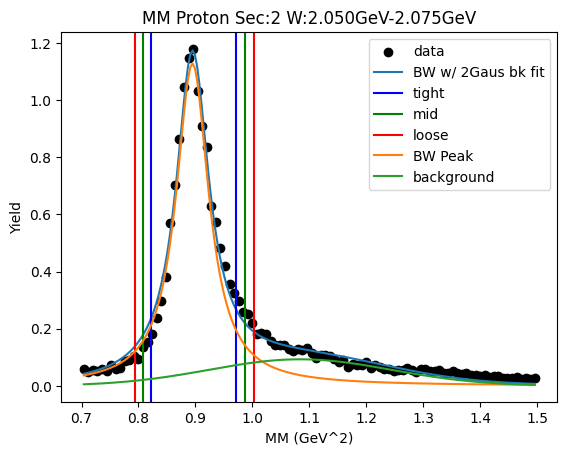

W bin: 27 2.075GeV-2.100GeV
background fit [6.44037494e-02 1.12408428e+00 2.46154082e-01 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8909625320647987 0.8996778423957772
Breit-Wigner Peak [0.07015289 0.94621361 0.03811236]
Gaus2 [0.08954867 1.10739212 0.17476073]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.82023551 0.80561312 0.79112223]
 [0.97369266 0.9897617  1.00596224]]
Cut Bounds Err [[2.82095474e-06 3.35396458e-06 3.87699915e-06]
 [3.07353231e-06 3.71758177e-06 4.37184495e-06]]


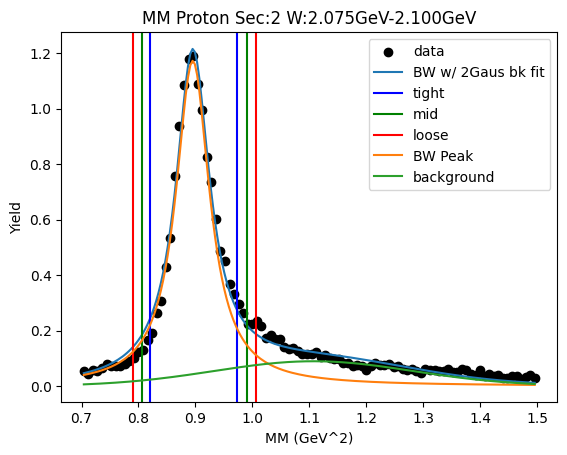

W bin: 28 2.100GeV-2.125GeV
background fit [6.60272714e-02 1.13364266e+00 2.47486992e-01 4.12845197e-04
 2.34452013e+00 2.31595273e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8893479756949734 0.8981530532760418
Breit-Wigner Peak [0.07553001 0.94538379 0.03830813]
Gaus2 [0.09153511 1.11251297 0.17544041]
Gaus3 [4.12845197e-04 2.34452013e+00 2.31595273e-02]
Cut Bounds [[0.81835627 0.80367602 0.78912864]
 [0.97246643 0.98860821 1.00488286]]
Cut Bounds Err [[2.73768488e-06 3.25475639e-06 3.76208838e-06]
 [2.98434865e-06 3.60985775e-06 4.24534325e-06]]


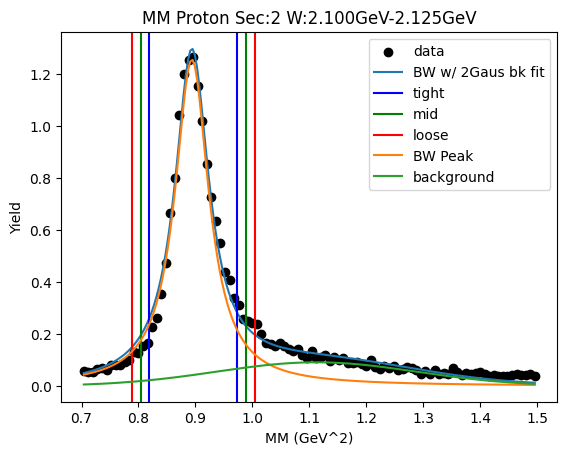

Runtime Error1.2
	Just skip it for now


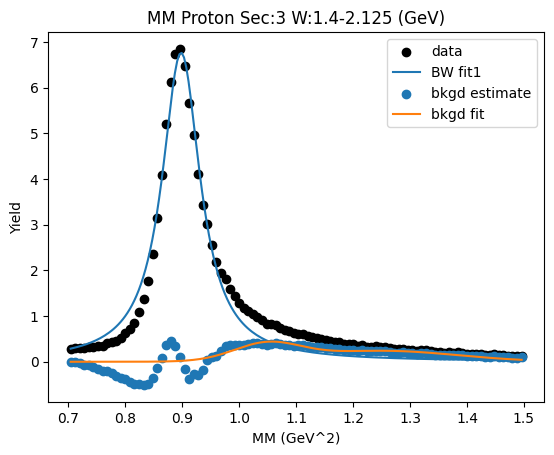

W bin: 0 1.400GeV-1.425GeV
Cut Bounds [[0.78685299 0.76847202 0.75030829]
 [0.98261059 1.00338114 1.02436893]]
Cut Bounds Err [[1.86812891e-05 2.21103970e-05 2.54583181e-05]
 [2.08761670e-05 2.52647774e-05 2.97466480e-05]]


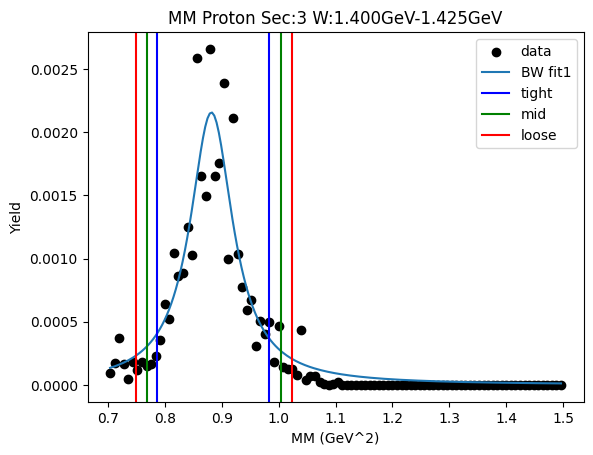

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.78843975 0.76994599 0.75167171]
 [0.98544865 1.00635667 1.02748416]]
Cut Bounds Err [[9.87670315e-06 1.16890644e-05 1.34583150e-05]
 [1.10419238e-05 1.33636651e-05 1.57349061e-05]]


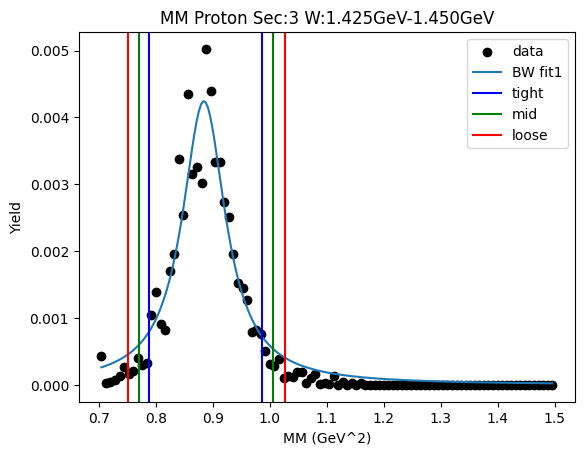

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.78625152 0.76679396 0.74758019]
 [0.99423534 1.01637455 1.03875755]]
Cut Bounds Err [[9.70471599e-06 1.14780518e-05 1.32064977e-05]
 [1.09130634e-05 1.32146519e-05 1.55673920e-05]]


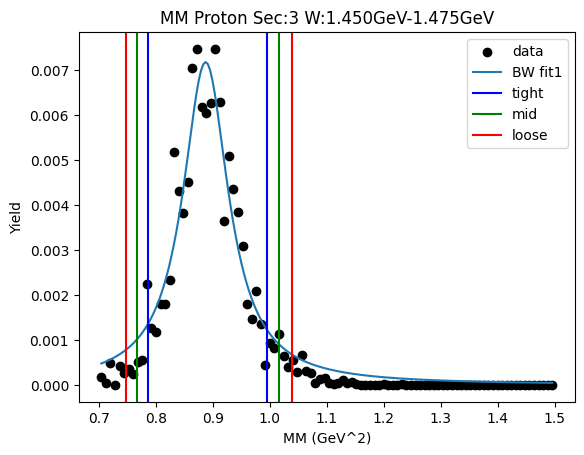

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.80417662 0.78692056 0.76985166]
 [0.98703067 1.00634542 1.02584733]]
Cut Bounds Err [[5.20414461e-06 6.16521845e-06 7.10568478e-06]
 [5.76552631e-06 6.97198686e-06 8.20245353e-06]]


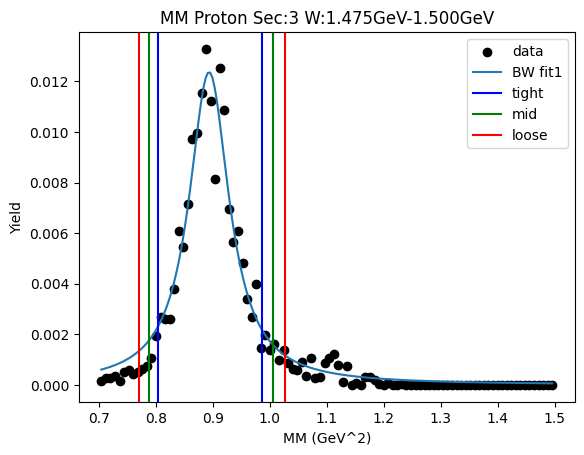

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.81070561 0.79356662 0.77661074]
 [0.99216642 1.01131959 1.03065587]]
Cut Bounds Err [[2.64386584e-06 3.13260641e-06 3.61104879e-06]
 [2.92482634e-06 3.53637529e-06 4.15995374e-06]]


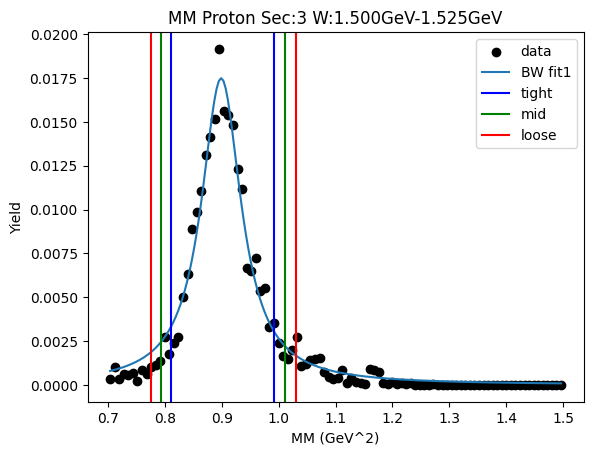

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.80743797 0.78941205 0.77158963]
 [0.99888909 1.0191534  1.0396212 ]]
Cut Bounds Err [[4.87675746e-06 5.77482524e-06 6.65273404e-06]
 [5.42419393e-06 6.56155462e-06 7.72226205e-06]]


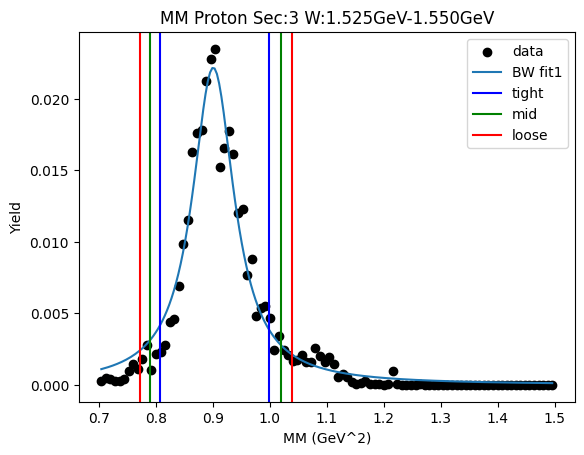

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.79477904 0.77388285 0.75326503]
 [1.01905135 1.04300962 1.06724627]]
Cut Bounds Err [[6.46928146e-06 7.64534229e-06 8.78947606e-06]
 [7.32539214e-06 8.87571770e-06 1.04621612e-05]]


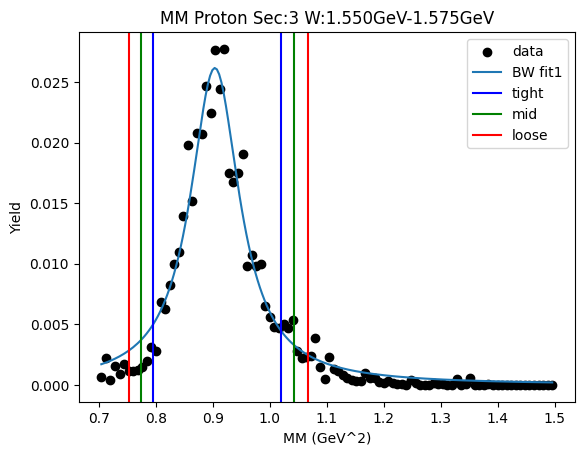

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.80373119 0.78577081 0.76801338]
 [0.99449709 1.0146899  1.03508565]]
Cut Bounds Err [[8.26476660e-06 9.78667067e-06 1.12743705e-05]
 [9.19341662e-06 1.11212524e-05 1.30886861e-05]]


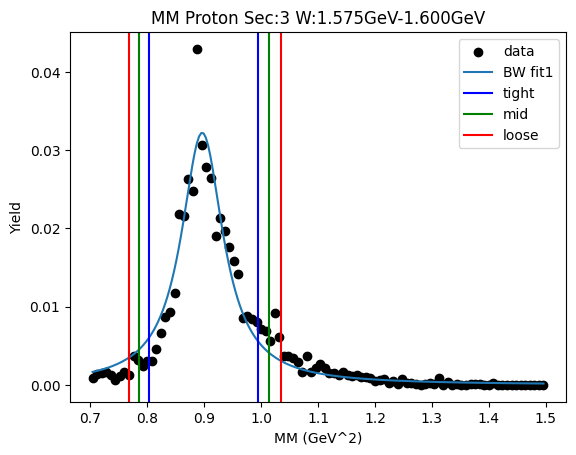

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.80197833 0.78297918 0.76420779]
 [1.00449626 1.0260007  1.04773289]]
Cut Bounds Err [[3.82466906e-06 4.52588727e-06 5.21024092e-06]
 [4.28042320e-06 5.18086713e-06 6.10066763e-06]]


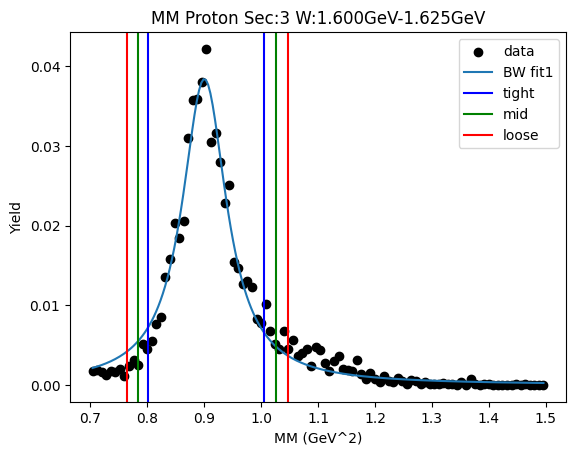

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.81194654 0.79580296 0.77982148]
 [0.98229802 1.00022474 1.01831356]]
Cut Bounds Err [[2.56424129e-06 3.04019074e-06 3.50680081e-06]
 [2.82043961e-06 3.40837093e-06 4.00732222e-06]]


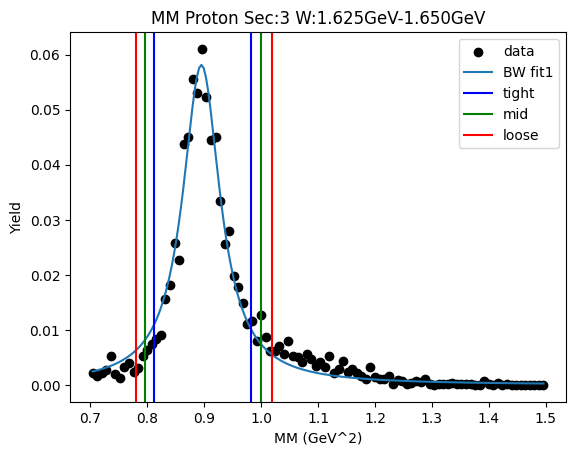

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.8121749  0.79599167 0.7799713 ]
 [0.98296443 1.00093911 1.01907664]]
Cut Bounds Err [[1.67901574e-06 1.99061451e-06 2.29608351e-06]
 [1.84713606e-06 2.23221865e-06 2.62453152e-06]]


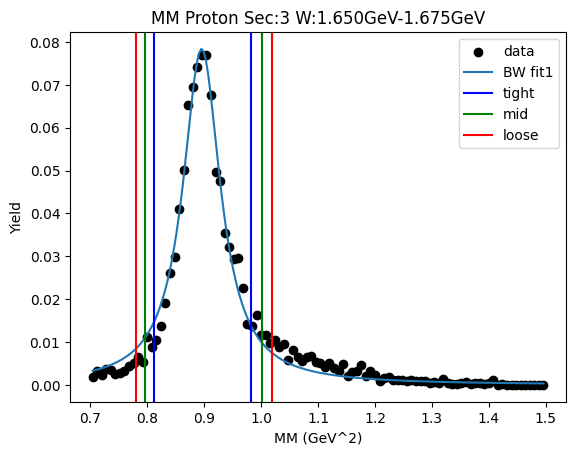

W bin: 11 1.675GeV-1.700GeV
background fit [0.00720833 0.99648611 0.02182072 0.00251619 1.12281939 0.06409568]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8866099189471842 0.8947578839660458
Breit-Wigner Peak [0.00553276 0.94376051 0.03685097]
Gaus2 [0.01685    0.94       0.05377049]
Gaus3 [0.00361841 1.10587159 0.08920957]
Cut Bounds [[0.818224   0.80410087 0.79010069]
 [0.96621758 0.98169317 0.99729171]]
Cut Bounds Err [[5.17068500e-06 6.14525258e-06 7.10273558e-06]
 [5.61887594e-06 6.79004038e-06 7.97986476e-06]]


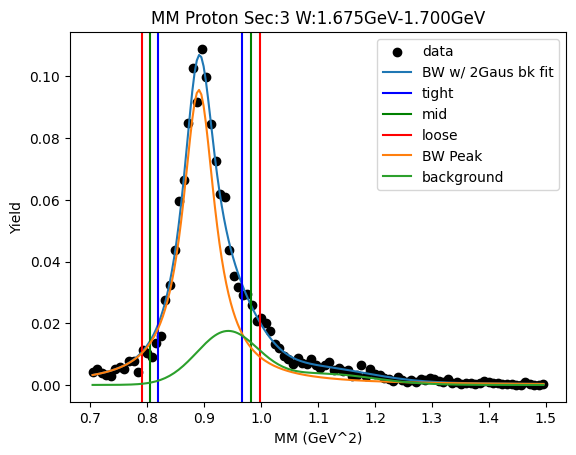

W bin: 12 1.700GeV-1.725GeV
background fit [0.00508235 0.94       0.03971084 0.00258495 1.08028489 0.11965472]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8898534028370766 0.8978711739651657
Breit-Wigner Peak [0.00750647 0.94544291 0.03655537]
Gaus2 [0.02191849 0.94       0.04687008]
Gaus3 [0.00425875 1.11134087 0.08649084]
Cut Bounds [[0.82184054 0.80779915 0.79387875]
 [0.9689087  0.98428094 0.99977417]]
Cut Bounds Err [[2.10796390e-06 2.49501704e-06 2.87667404e-06]
 [2.28881565e-06 2.75411048e-06 3.22823039e-06]]


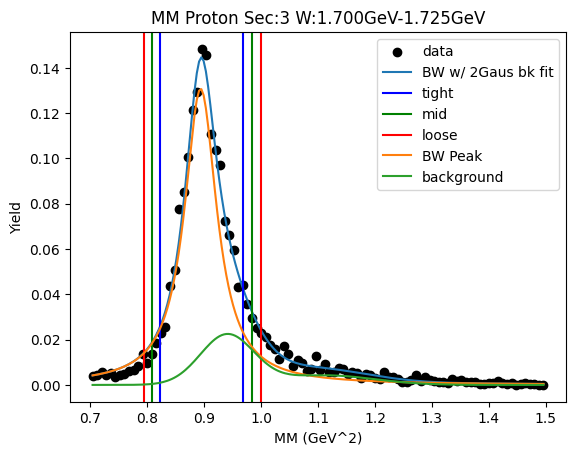

W bin: 13 1.725GeV-1.750GeV
background fit [0.0073384  1.01806112 0.05017026 0.00246536 1.19713016 0.08870279]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8943186265614859 0.9016347572588509
Breit-Wigner Peak [0.00782532 0.94761632 0.03491927]
Gaus2 [0.02067885 0.94       0.06541857]
Gaus3 [0.00464105 1.11520097 0.12733588]
Cut Bounds [[0.82895228 0.8154786  0.80211531]
 [0.96976107 0.98444915 0.99924762]]
Cut Bounds Err [[7.32855936e-06 8.72191618e-06 1.00914378e-05]
 [7.92658677e-06 9.58301723e-06 1.12634441e-05]]


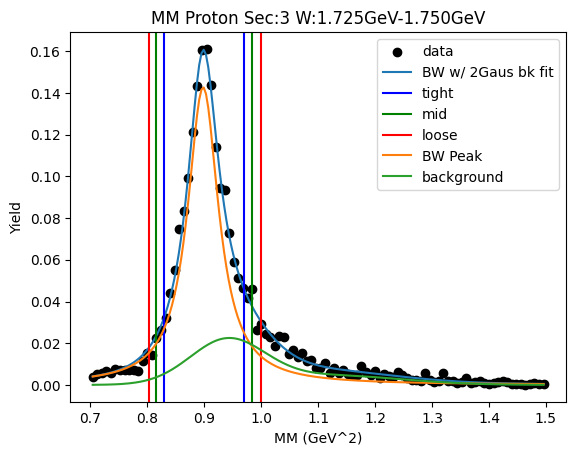

W bin: 14 1.750GeV-1.775GeV
background fit [0.01014187 1.02502727 0.07428395 0.00267498 1.26675989 0.05903458]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8897071659688325 0.8968682579190395
Breit-Wigner Peak [0.00779944 0.94513899 0.03454729]
Gaus2 [0.03120644 0.94       0.04199537]
Gaus3 [0.01344634 1.03815372 0.09721126]
Cut Bounds [[0.82516613 0.81186599 0.79867391]
 [0.96411078 0.97859957 0.99319642]]
Cut Bounds Err [[4.80250753e-06 5.71406767e-06 6.61041788e-06]
 [5.19111711e-06 6.27343950e-06 7.37159959e-06]]


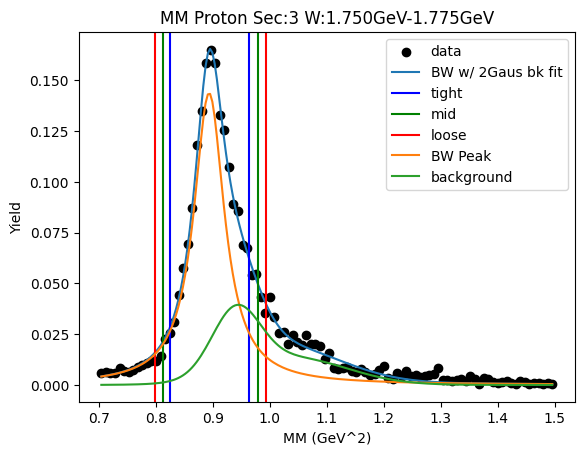

W bin: 15 1.775GeV-1.800GeV
background fit [0.00732373 1.03519577 0.06704611 0.0030205  1.1495037  0.12787859]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8917989882970132 0.9019940753330788
Breit-Wigner Peak [0.00948583 0.94704621 0.04122113]
Gaus2 [0.02753928 0.94       0.05366939]
Gaus3 [0.01144699 1.0735731  0.10331195]
Cut Bounds [[0.81575932 0.7999934  0.78438132]
 [0.98187979 0.99933796 1.01694998]]
Cut Bounds Err [[4.60009794e-06 5.45241402e-06 6.28893184e-06]
 [5.04678980e-06 6.09399112e-06 7.16082504e-06]]


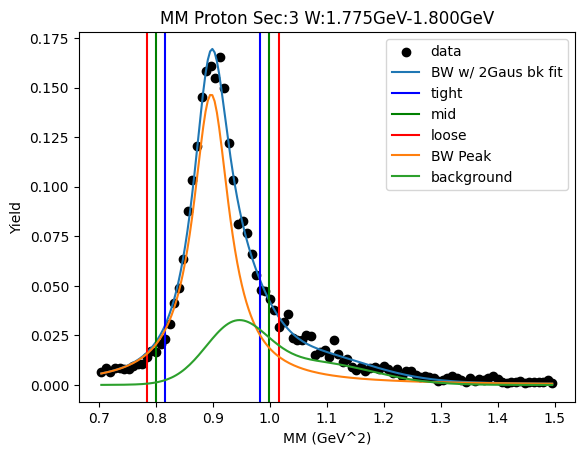

W bin: 16 1.800GeV-1.825GeV
background fit [0.00698473 1.07347539 0.07237077 0.00527775 0.94       0.30650756]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.887709427419576 0.8954428629585318
Breit-Wigner Peak [0.01042408 0.9442331  0.03590134]
Gaus2 [0.03531234 0.94       0.04020581]
Gaus3 [0.01624162 1.06960997 0.10986007]
Cut Bounds [[0.82090882 0.80712545 0.79345877]
 [0.96516086 0.9802279  0.99541162]]
Cut Bounds Err [[2.38993600e-06 2.83747281e-06 3.27785653e-06]
 [2.59142510e-06 3.12697723e-06 3.67137811e-06]]


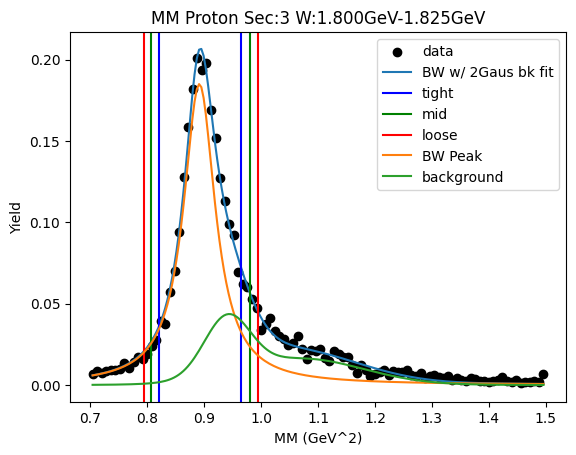

W bin: 17 1.825GeV-1.850GeV
background fit [3.91450008e-06 9.40000000e-01 4.77501067e-05 1.25503877e-02
 1.06537630e+00 1.51797404e-01]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8900882492232622 0.897890937515448
Breit-Wigner Peak [0.01240435 0.94551023 0.03606173]
Gaus2 [0.0160893  1.08738678 0.12704785]
Gaus3 [0.0305431  0.94       0.05138994]
Cut Bounds [[0.82291512 0.80905345 0.79530952]
 [0.96800759 0.98316441 0.99843897]]
Cut Bounds Err [[5.60419253e-06 6.66693328e-06 7.71089111e-06]
 [6.07819890e-06 7.34937787e-06 8.63967177e-06]]


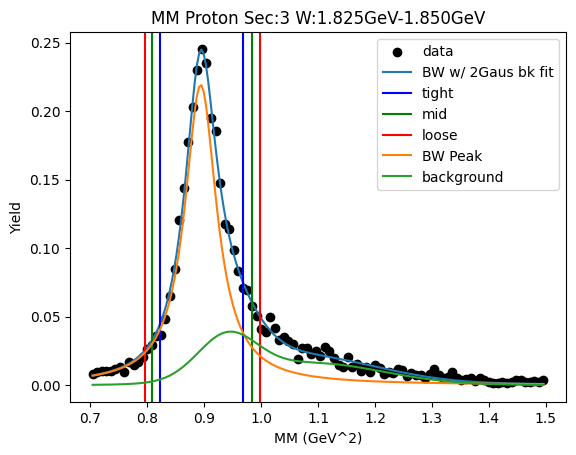

W bin: 18 1.850GeV-1.875GeV
background fit [0.01504725 1.0575047  0.17131448 0.03699709 1.06853953 0.00219032]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8916284640299241 0.8998435108674894
Breit-Wigner Peak [0.01646987 0.9464333  0.03700236]
Gaus2 [0.02522703 1.04186214 0.11463814]
Gaus3 [1.67274148e-01 1.06737416e+00 1.59468371e-04]
Cut Bounds [[0.82277433 0.80855389 0.79445741]
 [0.97179673 0.98738077 1.00308877]]
Cut Bounds Err [[5.30584321e-06 6.31088454e-06 7.29763167e-06]
 [5.76636012e-06 6.97393799e-06 8.20004646e-06]]


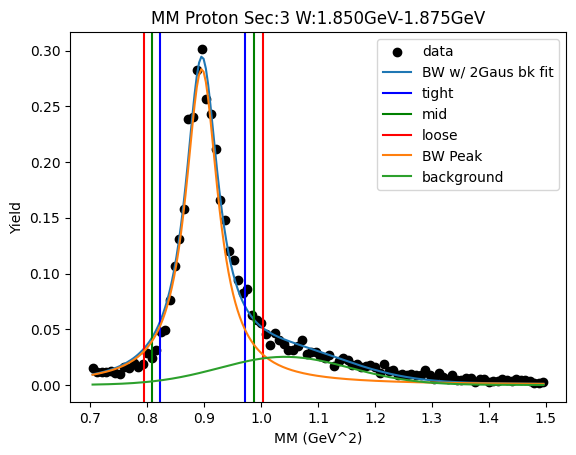

W bin: 19 1.875GeV-1.900GeV
background fit [1.55655814e-02 1.09392083e+00 1.75299125e-01 1.67274148e-01
 1.06737416e+00 1.59468371e-04]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8923049550586296 0.9007765384298122
Breit-Wigner Peak [0.01921441 0.94685836 0.03757566]
Gaus2 [0.02357376 1.0644059  0.12755676]
Gaus3 [1.67274148e-01 1.06737416e+00 1.59468371e-04]
Cut Bounds [[0.82243903 0.80800219 0.79369319]
 [0.97383832 0.98968134 1.00565219]]
Cut Bounds Err [[3.36883108e-06 4.00622723e-06 4.63185106e-06]
 [3.66581722e-06 4.43380918e-06 5.21377351e-06]]


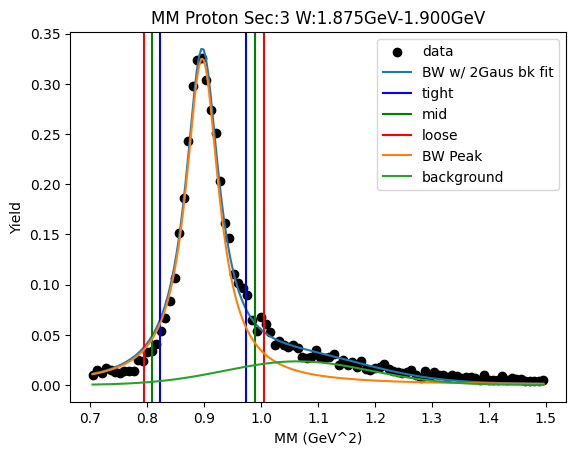

W bin: 20 1.900GeV-1.925GeV
background fit [1.70643139e-02 1.12231751e+00 1.66745691e-01 1.67274148e-01
 1.06737416e+00 1.59468371e-04]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8925799522647676 0.9020473297429089
Breit-Wigner Peak [0.02195431 0.9472664  0.03972274]
Gaus2 [0.02449579 1.0823346  0.138501  ]
Gaus3 [1.67274148e-01 1.06737416e+00 1.59468371e-04]
Cut Bounds [[0.81903978 0.8038136  0.78873027]
 [0.97915901 0.99595667 1.01289719]]
Cut Bounds Err [[4.29923015e-06 5.10985970e-06 5.90458234e-06]
 [4.70072461e-06 5.68789440e-06 6.69125549e-06]]


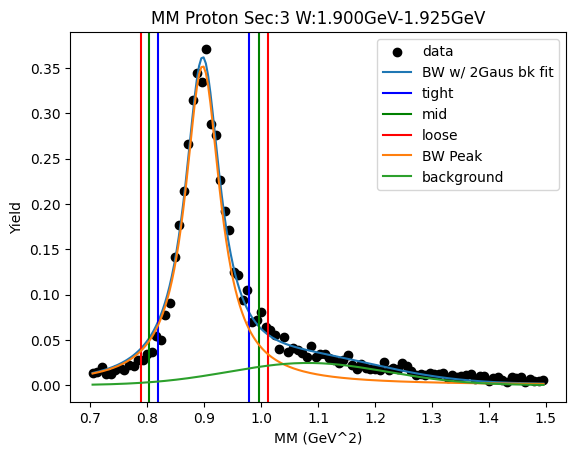

W bin: 21 1.925GeV-1.950GeV
background fit [1.89805262e-02 1.10866569e+00 1.95003572e-01 1.67274148e-01
 1.06737416e+00 1.59468371e-04]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8918492911241775 0.9010840717517217
Breit-Wigner Peak [0.02538701 0.94681924 0.03923175]
Gaus2 [0.02983572 1.07012349 0.13189892]
Gaus3 [1.67274148e-01 1.06737416e+00 1.59468371e-04]
Cut Bounds [[0.81917586 0.80413574 0.78923498]
 [0.97724128 0.99381425 1.01052657]]
Cut Bounds Err [[5.80730204e-06 6.90324726e-06 7.97795251e-06]
 [6.34288365e-06 7.67434566e-06 9.02738892e-06]]


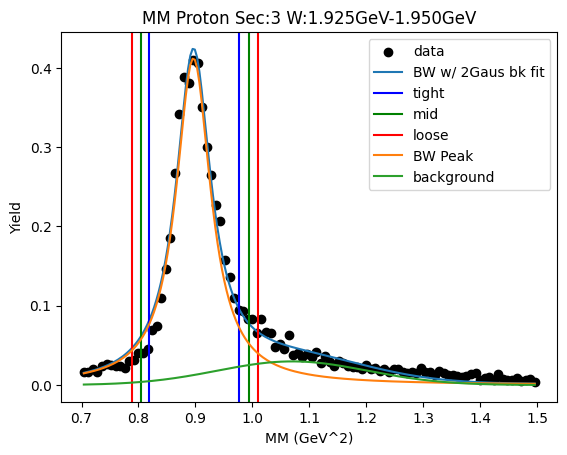

W bin: 22 1.950GeV-1.975GeV
background fit [2.16225402e-02 1.11253477e+00 2.10997338e-01 1.67274148e-01
 1.06737416e+00 1.59468371e-04]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.893620044466967 0.9026976726508008
Breit-Wigner Peak [0.02651779 0.94771243 0.0388965 ]
Gaus2 [0.03200674 1.08513321 0.14748448]
Gaus3 [1.67274148e-01 1.06737416e+00 1.59468371e-04]
Cut Bounds [[0.82143982 0.80650696 0.79171107]
 [0.97830238 0.99474202 1.01131864]]
Cut Bounds Err [[3.76112637e-06 4.47126665e-06 5.16779790e-06]
 [4.10455996e-06 4.96571447e-06 5.84071708e-06]]


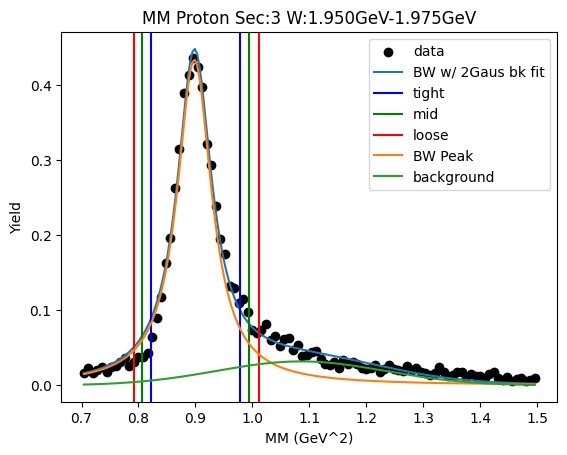

W bin: 23 1.975GeV-2.000GeV
background fit [2.68152939e-02 1.02796380e+00 2.83828973e-01 1.67274148e-01
 1.06737416e+00 1.59468371e-04]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8912425867274452 0.8992645646042781
Breit-Wigner Peak [0.02752071 0.94617841 0.03656496]
Gaus2 [0.04149779 1.0632152  0.1435043 ]
Gaus3 [1.67274148e-01 1.06737416e+00 1.59468371e-04]
Cut Bounds [[0.82315611 0.80909977 0.79516448]
 [0.97037729 0.98576518 1.00127412]]
Cut Bounds Err [[4.89280164e-06 5.81992166e-06 6.73041937e-06]
 [5.31235167e-06 6.42396012e-06 7.55248961e-06]]


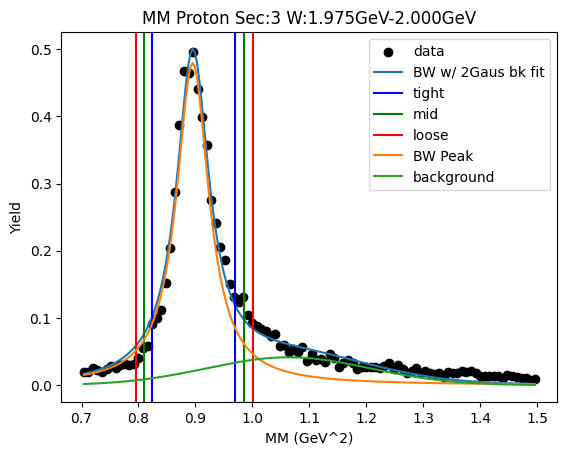

W bin: 24 2.000GeV-2.025GeV
background fit [2.77226685e-02 1.07874913e+00 2.67864742e-01 1.67274148e-01
 1.06737416e+00 1.59468371e-04]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8919857668103458 0.9002785614892167
Breit-Wigner Peak [0.02925002 0.94664257 0.03717704]
Gaus2 [0.04012468 1.0889479  0.16638169]
Gaus3 [1.67274148e-01 1.06737416e+00 1.59468371e-04]
Cut Bounds [[0.82281686 0.80852921 0.79436669]
 [0.97257588 0.98824004 1.00402932]]
Cut Bounds Err [[3.52735413e-06 4.19488316e-06 4.85025922e-06]
 [3.83494571e-06 4.63770623e-06 5.45290129e-06]]


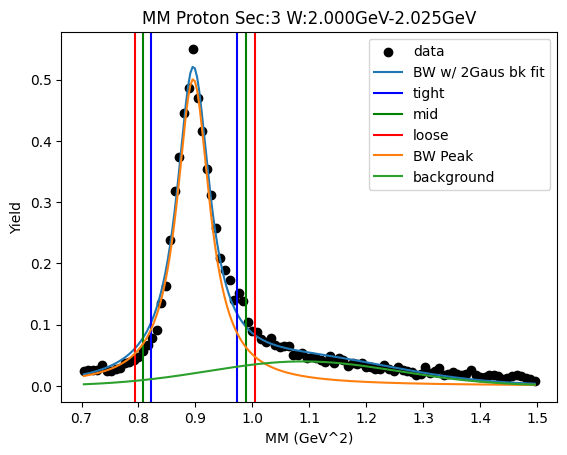

W bin: 25 2.025GeV-2.050GeV
background fit [3.67705874e-02 1.06637345e+00 2.39558278e-01 1.67274148e-01
 1.06737416e+00 1.59468371e-04]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8916660624159182 0.8985843965980055
Breit-Wigner Peak [0.03013081 0.94611058 0.03395667]
Gaus2 [0.05342726 1.06979085 0.15377767]
Gaus3 [1.67274148e-01 1.06737416e+00 1.59468371e-04]
Cut Bounds [[0.82807536 0.81497857 0.80198618]
 [0.96478501 0.97903015 0.99337969]]
Cut Bounds Err [[2.39480559e-06 2.85021837e-06 3.29813166e-06]
 [2.58494083e-06 3.12394280e-06 3.67064332e-06]]


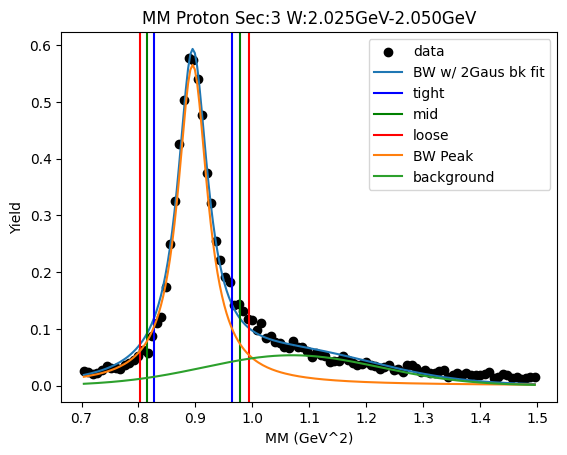

W bin: 26 2.050GeV-2.075GeV
background fit [3.76338223e-02 1.10562274e+00 2.13085809e-01 1.67274148e-01
 1.06737416e+00 1.59468371e-04]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8911194245738959 0.8984416672872216
Breit-Wigner Peak [0.03367521 0.9459284  0.03493385]
Gaus2 [0.0526492  1.08634172 0.15901276]
Gaus3 [1.67274148e-01 1.06737416e+00 1.59468371e-04]
Cut Bounds [[0.82585334 0.81239938 0.7990559 ]
 [0.96647002 0.98113939 0.99591925]]
Cut Bounds Err [[2.87063214e-06 3.41568768e-06 3.95148184e-06]
 [3.10541947e-06 3.75369273e-06 4.41147145e-06]]


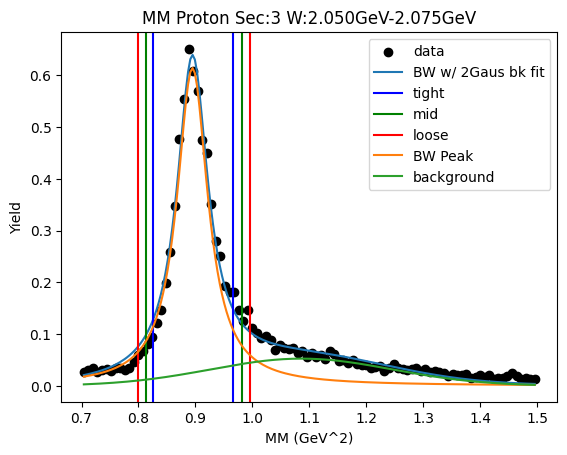

W bin: 27 2.075GeV-2.100GeV
background fit [3.63898040e-02 1.10496934e+00 2.74945799e-01 1.67274148e-01
 1.06737416e+00 1.59468371e-04]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8917952204127699 0.899470969171785
Breit-Wigner Peak [0.03641309 0.94637894 0.03576718]
Gaus2 [0.05000133 1.10703972 0.17951177]
Gaus3 [1.67274148e-01 1.06737416e+00 1.59468371e-04]
Cut Bounds [[0.8250611  0.81129418 0.79764309]
 [0.96910072 0.98414172 0.99929855]]
Cut Bounds Err [[2.88126288e-06 3.42750809e-06 3.96424887e-06]
 [3.12265702e-06 3.77501020e-06 4.43715129e-06]]


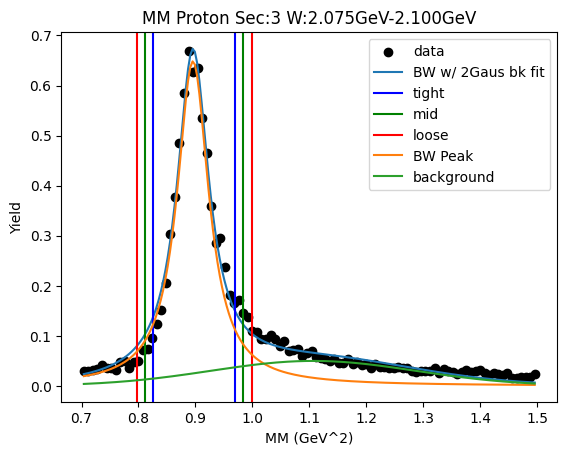

W bin: 28 2.100GeV-2.125GeV
background fit [4.03229448e-02 1.06255032e+00 3.14765776e-01 1.67274148e-01
 1.06737416e+00 1.59468371e-04]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8898372103614269 0.8974597667759505
Breit-Wigner Peak [0.03920607 0.94532983 0.03564304]
Gaus2 [0.05616207 1.10118009 0.17490861]
Gaus3 [1.67274148e-01 1.06737416e+00 1.59468371e-04]
Cut Bounds [[0.823396   0.80969058 0.79610017]
 [0.96677654 0.98174722 0.99683292]]
Cut Bounds Err [[3.40808307e-06 4.05432770e-06 4.68935271e-06]
 [3.69291104e-06 4.46435937e-06 5.24735234e-06]]


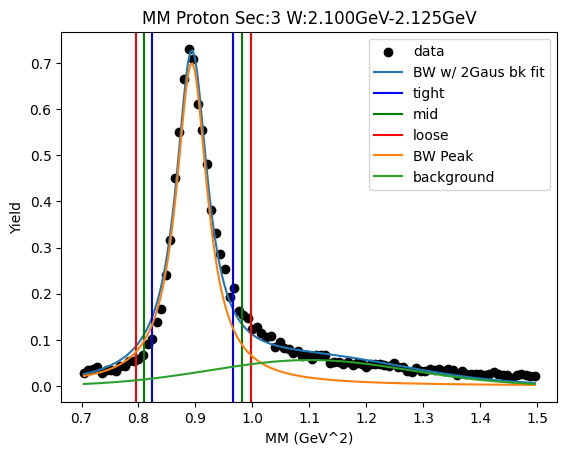

Runtime Error1.2
	Just skip it for now


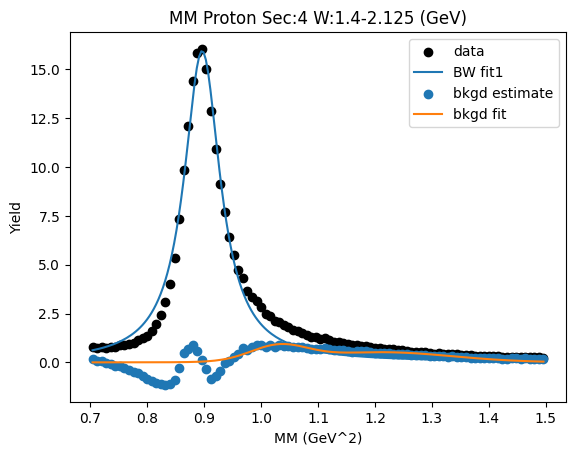

W bin: 0 1.400GeV-1.425GeV
Cut Bounds [[0.78125839 0.76353745 0.7460198 ]
 [0.96964873 0.98960586 1.00976628]]
Cut Bounds Err [[6.94119546e-06 8.21818369e-06 9.46594449e-06]
 [7.73293115e-06 9.35603421e-06 1.10128369e-05]]


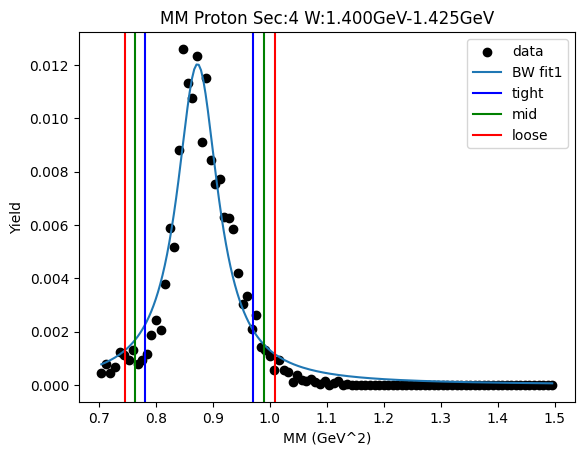

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.79691513 0.77989417 0.76305694]
 [0.97723044 0.99627253 1.01549837]]
Cut Bounds Err [[2.58288992e-06 3.06005847e-06 3.52704787e-06]
 [2.86021284e-06 3.45860501e-06 4.06885763e-06]]


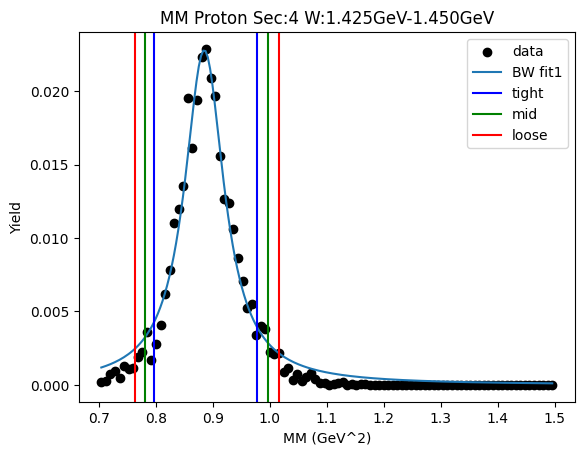

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.80303561 0.78590825 0.76896551]
 [0.98446344 1.00362165 1.02296448]]
Cut Bounds Err [[2.40672726e-06 2.85137859e-06 3.28656208e-06]
 [2.66476719e-06 3.22221096e-06 3.79069363e-06]]


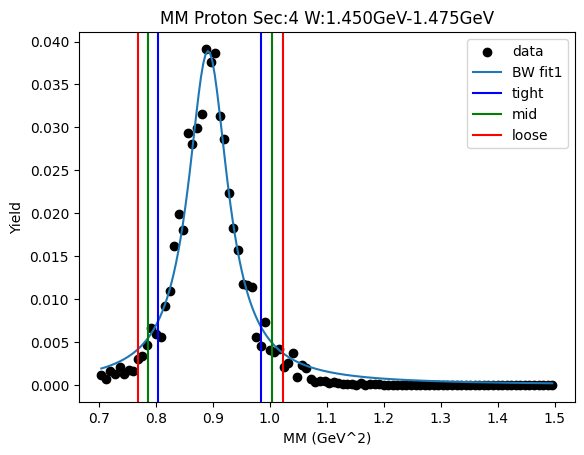

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.8005444  0.78349132 0.76662183]
 [0.98117274 1.00024533 1.01950151]]
Cut Bounds Err [[3.10761840e-06 3.68181913e-06 4.24381009e-06]
 [3.44039026e-06 4.16005069e-06 4.89394728e-06]]


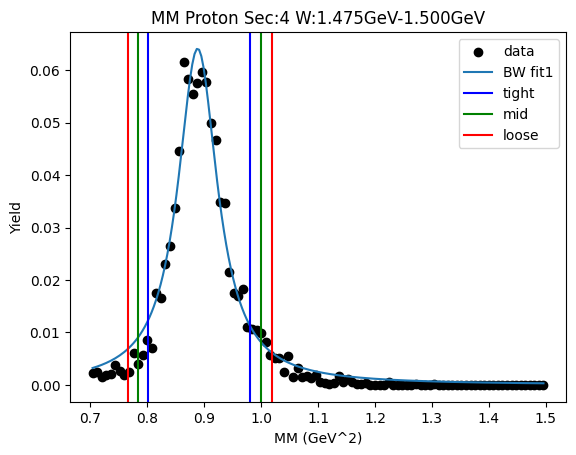

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.81298599 0.79748874 0.78214062]
 [0.97616062 0.9932983  1.01058511]]
Cut Bounds Err [[1.78083940e-06 2.11225410e-06 2.43747626e-06]
 [1.95138907e-06 2.35734815e-06 2.77066756e-06]]


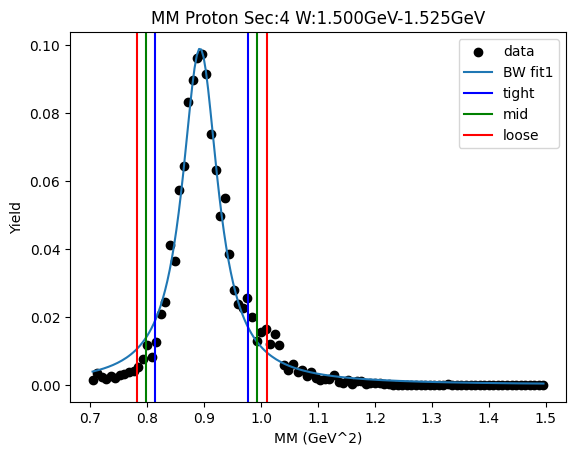

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.80470409 0.78660986 0.76872137]
 [0.99696261 1.01732008 1.0378833 ]]
Cut Bounds Err [[2.63083814e-06 3.11506811e-06 3.58833685e-06]
 [2.92829928e-06 3.54255551e-06 4.16949051e-06]]


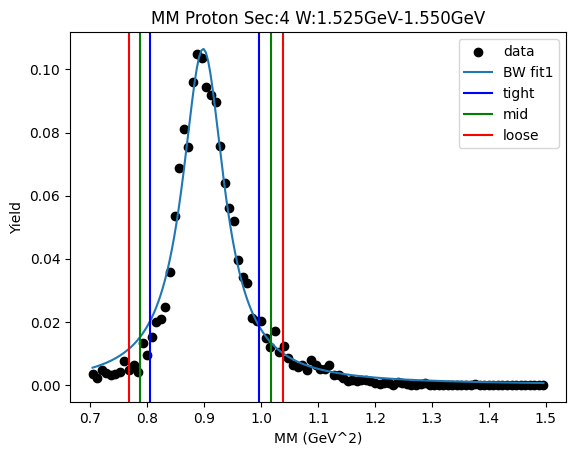

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.8089562  0.79153188 0.77429725]
 [0.99363309 1.01314415 1.0328449 ]]
Cut Bounds Err [[2.46986648e-06 2.92585675e-06 3.37202814e-06]
 [2.73731007e-06 3.31020183e-06 3.89452850e-06]]


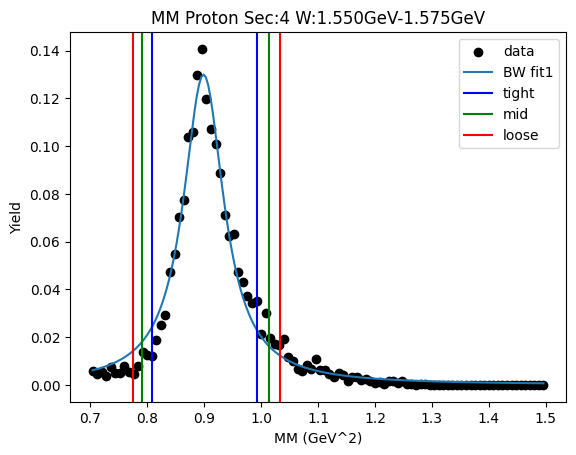

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.8076916  0.79004608 0.77259546]
 [0.99486534 1.01465458 1.0346387 ]]
Cut Bounds Err [[2.56172954e-06 3.03421116e-06 3.49634980e-06]
 [2.84310334e-06 3.43857657e-06 4.04606785e-06]]


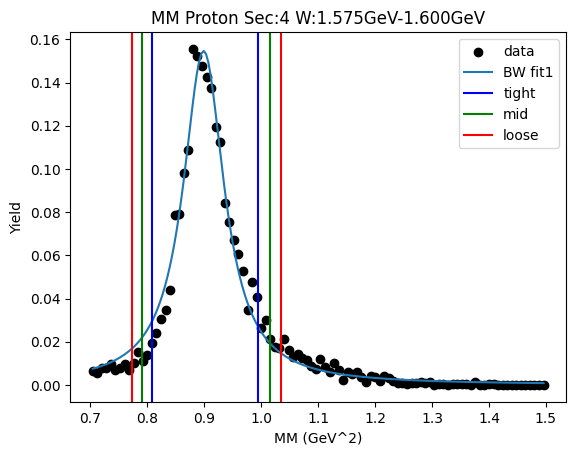

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.80473737 0.78676643 0.76899841]
 [0.99560802 1.0158112  1.03621731]]
Cut Bounds Err [[2.40317119e-06 2.84571860e-06 3.27832789e-06]
 [2.67301759e-06 3.23351993e-06 3.80552946e-06]]


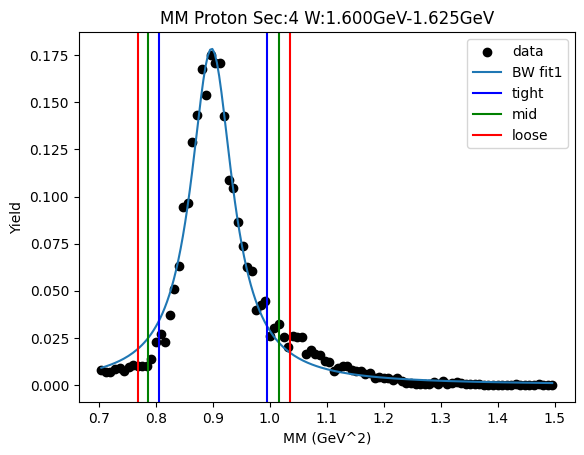

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.81115989 0.79507852 0.77915816]
 [0.98082896 0.99868141 1.01669486]]
Cut Bounds Err [[2.22902833e-06 2.64283684e-06 3.04855237e-06]
 [2.45108851e-06 2.96195751e-06 3.48238002e-06]]


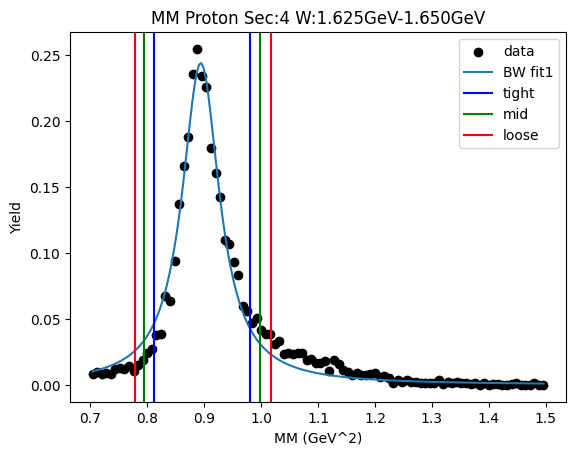

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.81141887 0.79512424 0.77899489]
 [0.98345522 1.00156787 1.0198458 ]]
Cut Bounds Err [[1.30396104e-06 1.54583481e-06 1.78290713e-06]
 [1.43555343e-06 1.73494527e-06 2.03999297e-06]]


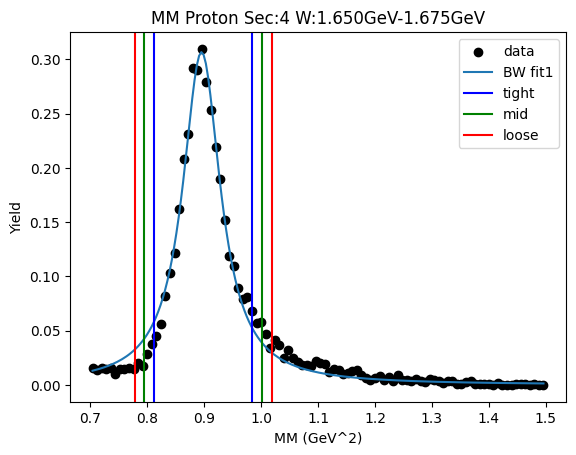

W bin: 11 1.675GeV-1.700GeV
Value Error2.2
	Just skip it for now
Cut Bounds [[0.81282864 0.79707486 0.78147525]
 [0.97884535 0.99629492 1.01389865]]
Cut Bounds Err [[0.08779583 0.10535504 0.12291425]
 [0.08779624 0.10535545 0.12291466]]


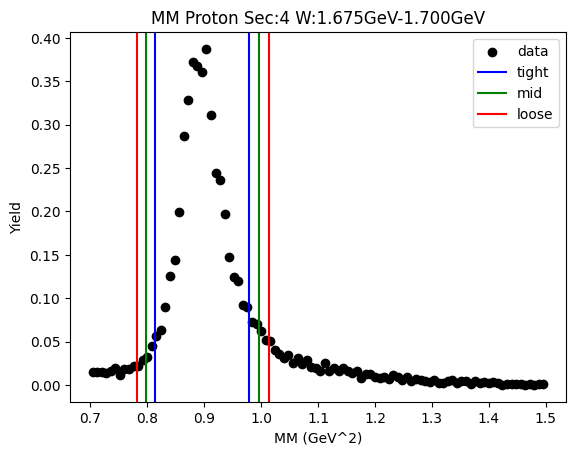

W bin: 12 1.700GeV-1.725GeV
background fit [1.41809214e-02 9.40000001e-01 1.90836984e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.890092442652914 0.8981137706799309
Breit-Wigner Peak [0.02705558 0.94557025 0.03656348]
Gaus2 [0.03876852 0.96154901 0.06501038]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.82205581 0.80800948 0.79408418]
 [0.9691764  0.98455418 1.000053  ]]
Cut Bounds Err [[7.92127541e-06 9.42294411e-06 1.08975762e-05]
 [8.60093917e-06 1.04015533e-05 1.22294845e-05]]


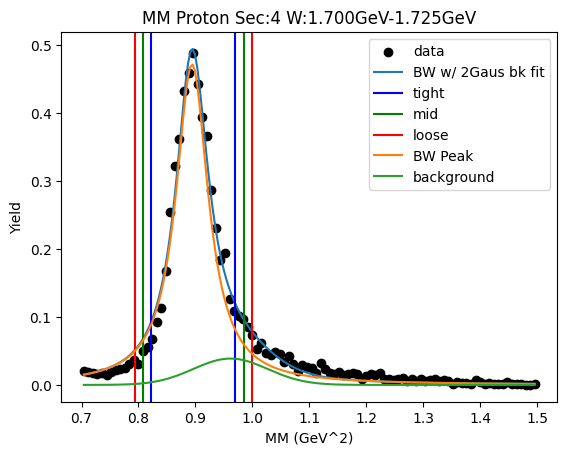

W bin: 13 1.725GeV-1.750GeV
background fit [2.00625714e-02 9.40000002e-01 1.88195484e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8933489297739972 0.9012992937816777
Breit-Wigner Peak [0.02736517 0.94727193 0.03640138]
Gaus2 [0.05401955 0.96898783 0.06861703]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.82545775 0.81144439 0.79755099]
 [0.9721897  0.98752273 1.00297572]]
Cut Bounds Err [[5.68745992e-06 6.76628858e-06 7.82579452e-06]
 [6.17229156e-06 7.46439624e-06 8.77595568e-06]]


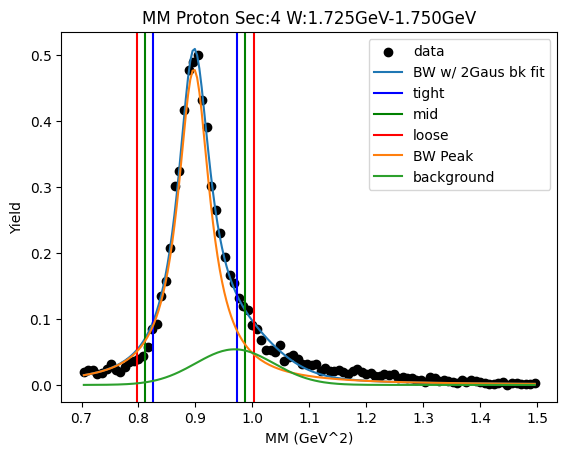

W bin: 14 1.750GeV-1.775GeV
background fit [2.82372671e-02 9.40000001e-01 1.52671448e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8908353255092825 0.8979328017814348
Breit-Wigner Peak [0.02566103 0.94571881 0.0343935 ]
Gaus2 [0.08248746 0.96088615 0.06318204]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.82651732 0.81326527 0.80012032]
 [0.96492829 0.97935843 0.99389568]]
Cut Bounds Err [[5.68198904e-06 6.76284736e-06 7.82550675e-06]
 [6.13934348e-06 7.42137379e-06 8.72178188e-06]]


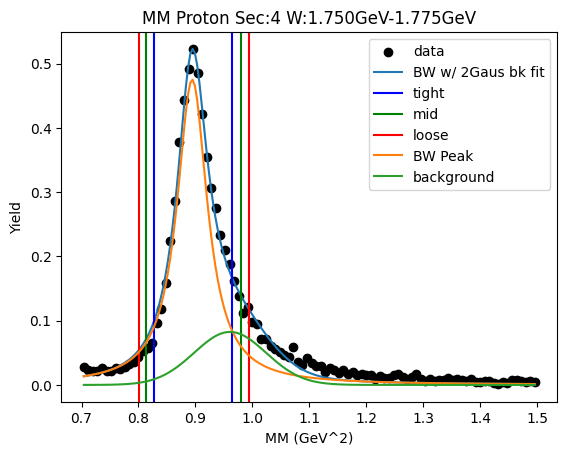

W bin: 15 1.775GeV-1.800GeV
background fit [2.22714383e-02 1.04158019e+00 1.35366585e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8911101943142751 0.9002426476202364
Breit-Wigner Peak [0.0288148  0.94640183 0.03901379]
Gaus2 [0.05026764 0.99869018 0.08830565]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.81884003 0.80388617 0.78907012]
 [0.97595798 0.99242771 1.00903525]]
Cut Bounds Err [[6.37017718e-06 7.57359514e-06 8.75371207e-06]
 [6.95452607e-06 8.41500249e-06 9.89891577e-06]]


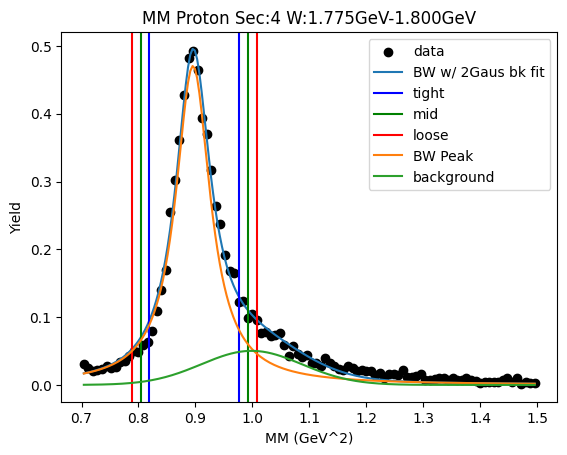

W bin: 16 1.800GeV-1.825GeV
background fit [3.14058501e-02 1.01893375e+00 1.54639479e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8899080320079843 0.897615321951016
Breit-Wigner Peak [0.03138805 0.9453897  0.0358406 ]
Gaus2 [0.05461579 1.01101238 0.10005097]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.82312325 0.80934447 0.79568199]
 [0.96730764 0.98236573 0.99754013]]
Cut Bounds Err [[3.80685423e-06 4.52946975e-06 5.23933867e-06]
 [4.12682565e-06 4.99019209e-06 5.86640302e-06]]


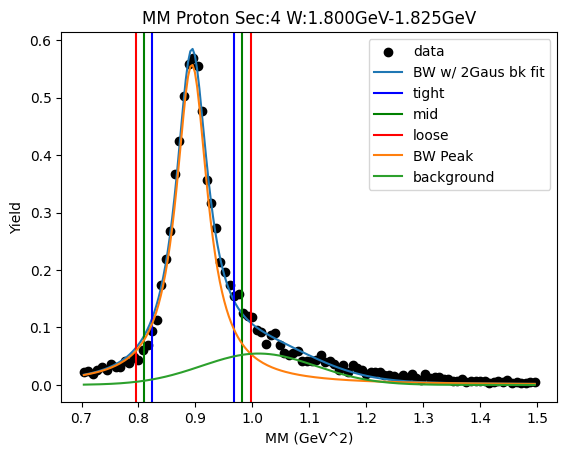

W bin: 17 1.825GeV-1.850GeV
background fit [3.38902693e-02 1.07065916e+00 1.33587031e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8899587765139986 0.8979558167920371
Breit-Wigner Peak [0.03537392 0.94549315 0.03650808]
Gaus2 [0.05800746 1.02594668 0.10509016]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.82202286 0.807998   0.7940938 ]
 [0.96890857 0.98426085 0.9997338 ]]
Cut Bounds Err [[4.52344833e-06 5.38101382e-06 6.22316800e-06]
 [4.91099039e-06 5.93901018e-06 6.98261035e-06]]


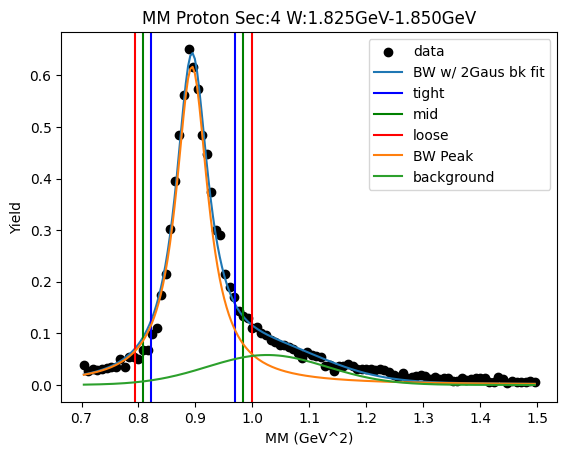

W bin: 18 1.850GeV-1.875GeV
background fit [3.57252351e-02 1.06966041e+00 1.63786047e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8906025634837914 0.8982877981287863
Breit-Wigner Peak [0.03988835 0.94575112 0.03578928]
Gaus2 [0.05412516 1.04586308 0.12439519]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.8238783  0.81011283 0.79646332]
 [0.96791128 0.9829524  0.9981095 ]]
Cut Bounds Err [[3.09610934e-06 3.68361727e-06 4.26081494e-06]
 [3.35584994e-06 4.05758840e-06 4.76978578e-06]]


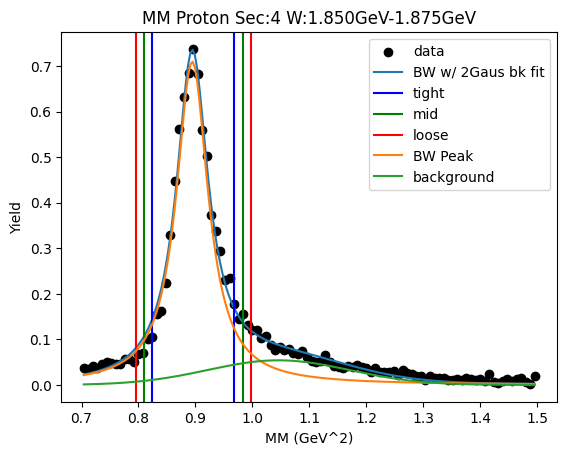

W bin: 19 1.875GeV-1.900GeV
background fit [4.05048000e-02 1.02804137e+00 2.02411940e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8904210128184017 0.8977751962474755
Breit-Wigner Peak [0.04488087 0.94556761 0.03500996]
Gaus2 [0.06096014 1.04546246 0.11999511]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.82505062 0.81157404 0.79820844]
 [0.96591991 0.98061719 0.99542545]]
Cut Bounds Err [[4.09800835e-06 4.87651155e-06 5.64168395e-06]
 [4.43407567e-06 5.36037205e-06 6.30020912e-06]]


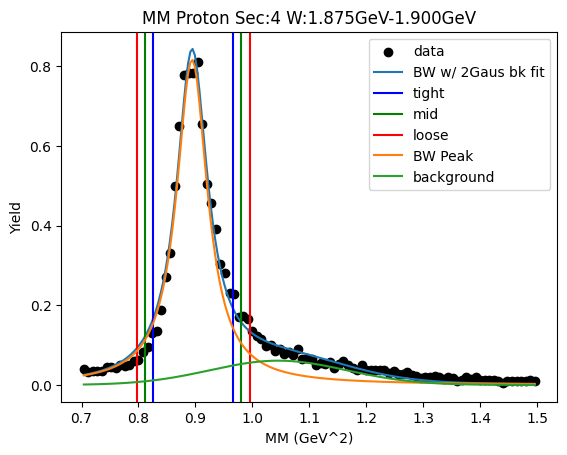

W bin: 20 1.900GeV-1.925GeV
background fit [3.97498812e-02 1.04177364e+00 2.12006094e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8912793791157652 0.899367125694102
Breit-Wigner Peak [0.04882829 0.94621523 0.03671454]
Gaus2 [0.06389828 1.04669124 0.11929658]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.82293418 0.8088225  0.79483285]
 [0.97076338 0.98621753 1.00179373]]
Cut Bounds Err [[3.58457689e-06 4.26383147e-06 4.93082980e-06]
 [3.89324775e-06 4.70825286e-06 5.53568362e-06]]


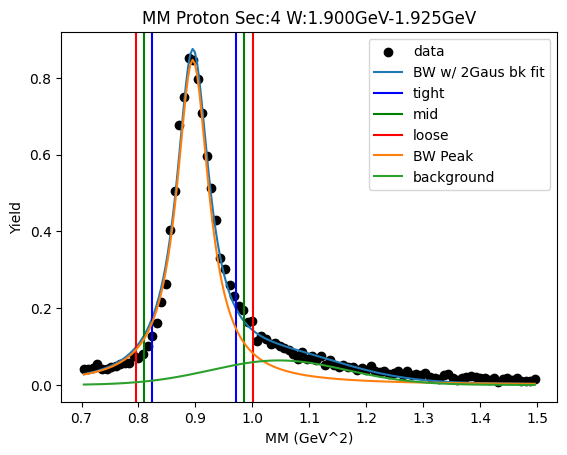

W bin: 21 1.925GeV-1.950GeV
background fit [4.34021414e-02 1.07524546e+00 2.06299590e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.891323950680278 0.8989172129059505
Breit-Wigner Peak [0.05215662 0.94610812 0.03557448]
Gaus2 [0.06410798 1.06362137 0.13925352]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.82494155 0.81124949 0.797672  ]
 [0.96816413 0.98311658 0.99818361]]
Cut Bounds Err [[2.38006119e-06 2.83172574e-06 3.27553608e-06]
 [2.57840436e-06 3.11728480e-06 3.66416844e-06]]


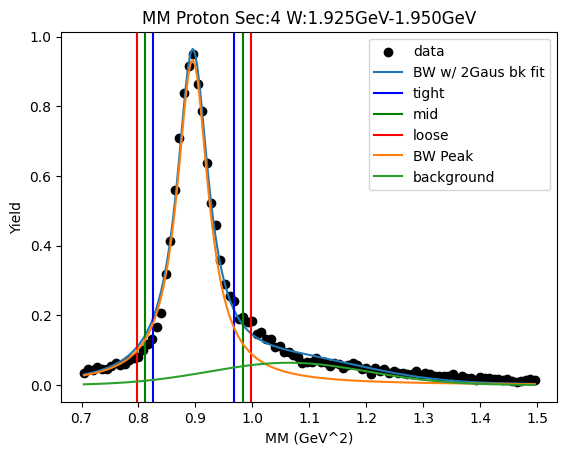

W bin: 22 1.950GeV-1.975GeV
background fit [4.50552118e-02 9.81562148e-01 2.97816303e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8917700590066723 0.8994625221896172
Breit-Wigner Peak [0.05484603 0.94637006 0.03580611]
Gaus2 [0.06907232 1.05167423 0.12652408]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.82496976 0.81118868 0.79752369]
 [0.96916476 0.98422269 0.9993967 ]]
Cut Bounds Err [[3.54301236e-06 4.21528751e-06 4.87577266e-06]
 [3.84018777e-06 4.64315248e-06 5.45808892e-06]]


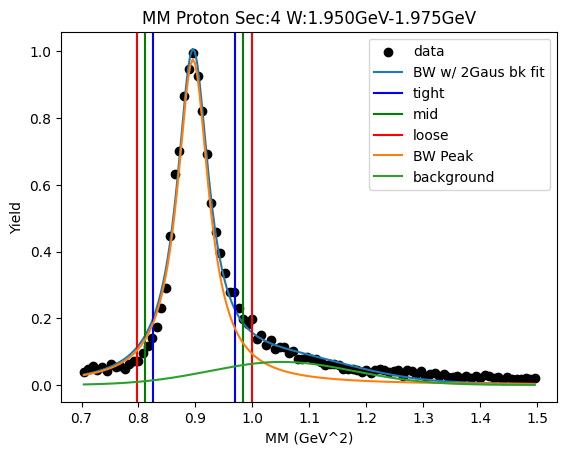

W bin: 23 1.975GeV-2.000GeV
background fit [4.98359503e-02 1.03628131e+00 2.55235780e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8907594856964471 0.8979075689363163
Breit-Wigner Peak [0.05508854 0.94569209 0.0345159 ]
Gaus2 [0.07414597 1.06028062 0.14371996]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.826232   0.81293529 0.79974644]
 [0.96513163 0.97961484 0.99420591]]
Cut Bounds Err [[2.42752583e-06 2.88887379e-06 3.34246692e-06]
 [2.62365138e-06 3.17123377e-06 3.72674031e-06]]


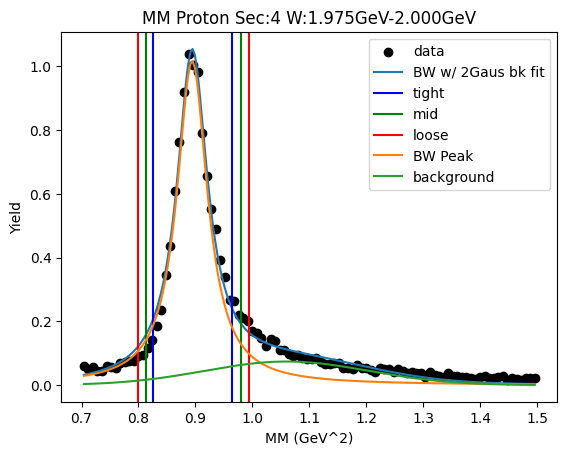

W bin: 24 2.000GeV-2.025GeV
background fit [5.87840773e-02 1.02206095e+00 2.69309620e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8903200865300641 0.8974410645558663
Breit-Wigner Peak [0.05648469 0.94545258 0.03445039]
Gaus2 [0.08117064 1.07521544 0.15056719]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.8259233  0.8126542  0.79949256]
 [0.96452421 0.97897529 0.99353384]]
Cut Bounds Err [[2.78626787e-06 3.31574712e-06 3.83635445e-06]
 [3.01099181e-06 3.63927082e-06 4.27664148e-06]]


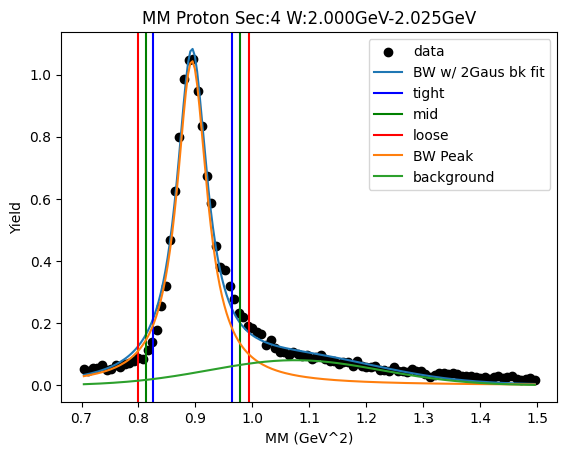

W bin: 25 2.025GeV-2.050GeV
background fit [6.33825277e-02 1.06861351e+00 2.40484823e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8907904198453245 0.8974942603621356
Breit-Wigner Peak [0.05837446 0.945591   0.03342614]
Gaus2 [0.08816874 1.07642399 0.16130476]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.82815693 0.81526332 0.80247088]
 [0.96265674 0.9766631  0.99077062]]
Cut Bounds Err [[1.88076158e-06 2.23862602e-06 2.59070504e-06]
 [2.02774413e-06 2.45021946e-06 2.87865679e-06]]


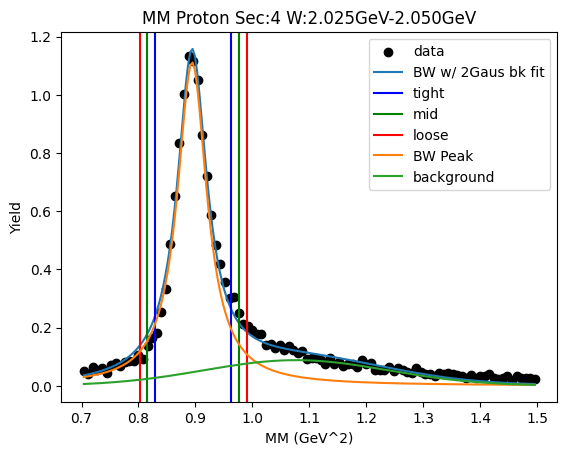

W bin: 26 2.050GeV-2.075GeV
background fit [6.81114639e-02 1.07581391e+00 2.34867529e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8911553469377003 0.8974810378740765
Breit-Wigner Peak [0.05787563 0.94568398 0.03246971]
Gaus2 [0.09665718 1.07127441 0.16320922]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.83017927 0.81763785 0.80519188]
 [0.96084345 0.97443486 0.98812172]]
Cut Bounds Err [[2.22932021e-06 2.65405760e-06 3.07215510e-06]
 [2.39835146e-06 2.89738532e-06 3.40328773e-06]]


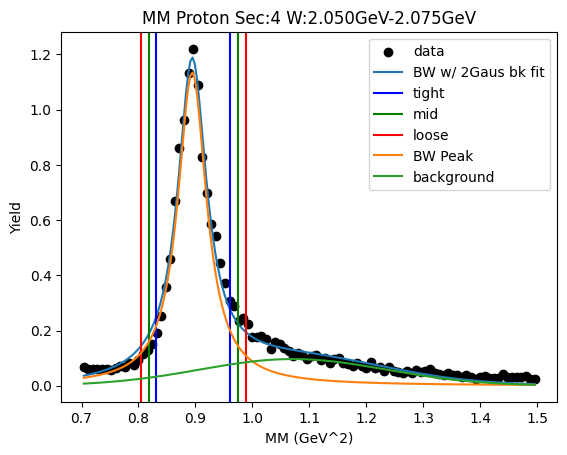

W bin: 27 2.075GeV-2.100GeV
background fit [5.90250092e-02 1.11797848e+00 2.27693345e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8911998834897596 0.8988108889313409
Breit-Wigner Peak [0.06573887 0.94604724 0.03561602]
Gaus2 [0.08190055 1.09723169 0.16346266]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.8247507  0.81104431 0.79745276]
 [0.96813128 0.98310101 0.99818558]]
Cut Bounds Err [[2.34838854e-06 2.79379359e-06 3.23147071e-06]
 [2.54434344e-06 3.07589211e-06 3.61537530e-06]]


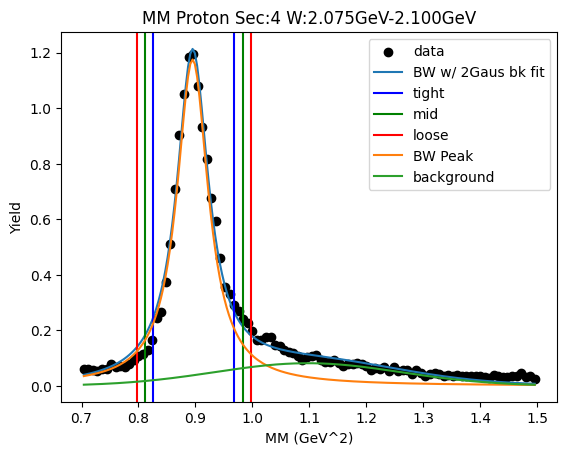

W bin: 28 2.100GeV-2.125GeV
background fit [6.40310830e-02 1.07181125e+00 2.82455310e-01 1.41447530e-03
 1.77530800e+00 3.11919358e-02]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8914728910336535 0.8987860693196478
Breit-Wigner Peak [0.06976343 0.94611283 0.03491222]
Gaus2 [0.08733597 1.1009757  0.16588283]
Gaus3 [1.41447530e-03 1.77530800e+00 3.11919358e-02]
Cut Bounds [[0.8262304  0.81278165 0.79944325]
 [0.96678742 0.98145007 0.99622307]]
Cut Bounds Err [[2.66268973e-06 3.16819771e-06 3.66513517e-06]
 [2.88028506e-06 3.48144417e-06 4.09142386e-06]]


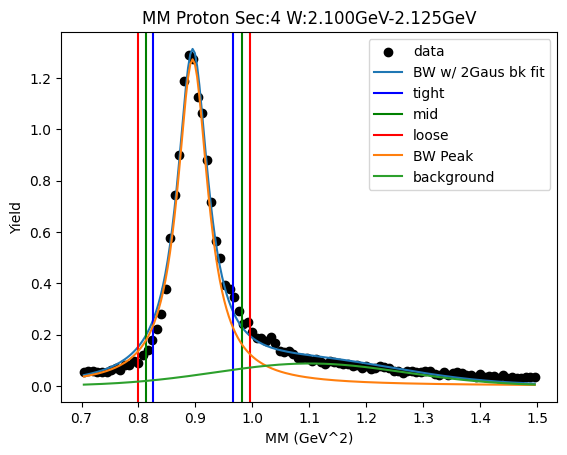

Runtime Error1.2
	Just skip it for now


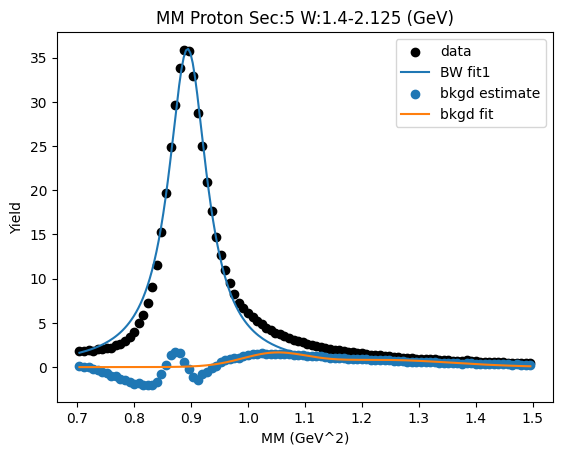

W bin: 0 1.400GeV-1.425GeV
Cut Bounds [[0.75948252 0.73950687 0.71979744]
 [0.97388044 0.99678438 1.01995453]]
Cut Bounds Err [[2.65629362e-06 3.13935187e-06 3.60926775e-06]
 [3.00794582e-06 3.64476474e-06 4.29639655e-06]]


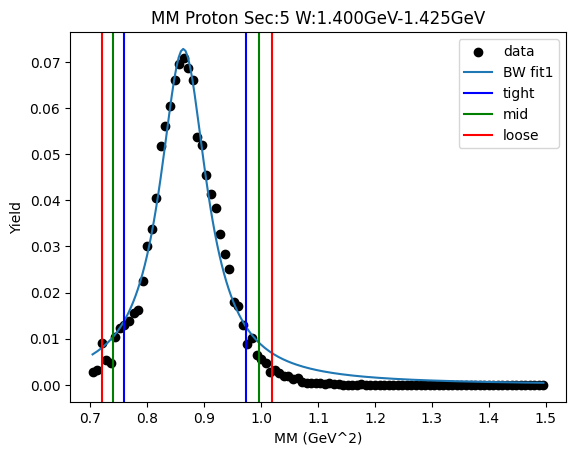

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.77229684 0.75314802 0.73423959]
 [0.97700608 0.99879911 1.02083253]]
Cut Bounds Err [[2.28268530e-06 2.69979120e-06 3.10630791e-06]
 [2.56745326e-06 3.10905984e-06 3.66271268e-06]]


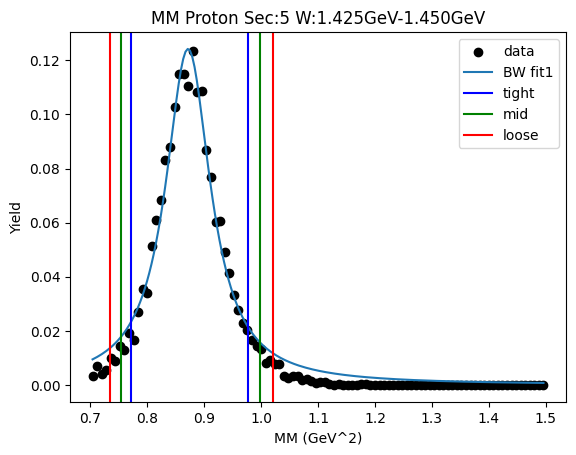

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.77855166 0.75938696 0.7404611 ]
 [0.98333405 1.00512583 1.02715644]]
Cut Bounds Err [[2.27903516e-06 2.69569043e-06 3.10185976e-06]
 [2.56128465e-06 3.10133489e-06 3.65333362e-06]]


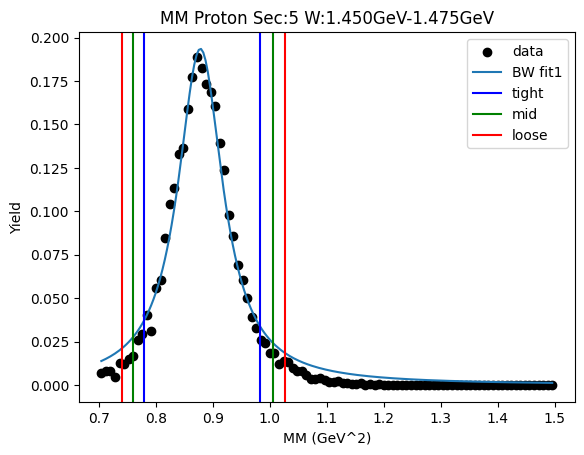

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.78310695 0.76412082 0.74536768]
 [0.98578261 1.00733161 1.02911361]]
Cut Bounds Err [[2.10125569e-06 2.48585932e-06 2.86095476e-06]
 [2.35753929e-06 2.85418266e-06 3.36168774e-06]]


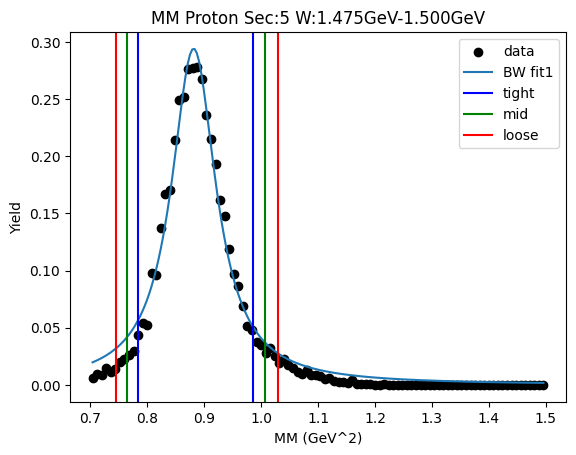

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.79159221 0.77319557 0.75501521]
 [0.98745464 1.00823048 1.02922261]]
Cut Bounds Err [[1.33353651e-06 1.57840506e-06 1.81751181e-06]
 [1.48940474e-06 1.80241046e-06 2.12204238e-06]]


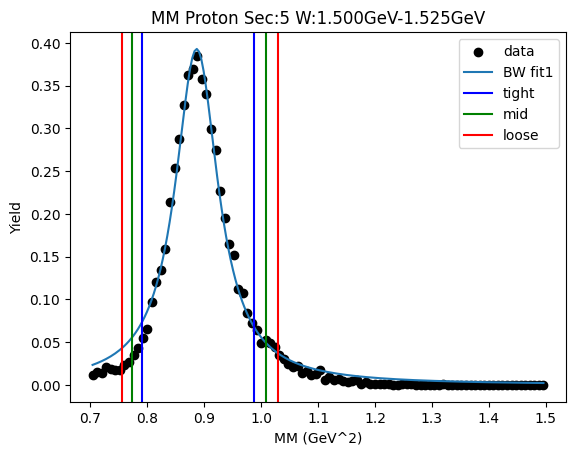

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.79603092 0.7772909  0.7587741 ]
 [0.99570838 1.01690385 1.03832254]]
Cut Bounds Err [[1.74410691e-06 2.06404061e-06 2.37633411e-06]
 [1.95062693e-06 2.36083912e-06 2.77982461e-06]]


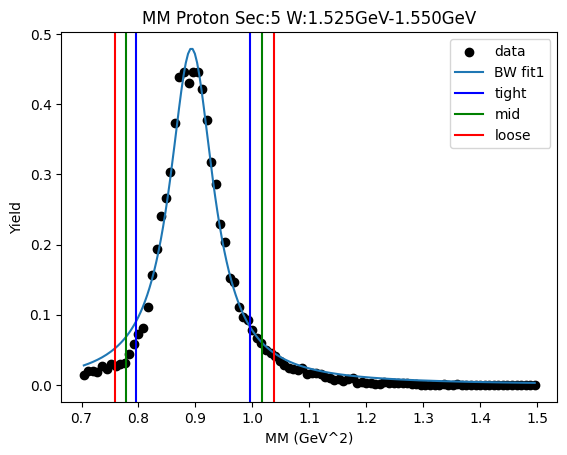

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.78904954 0.76866451 0.74854625]
 [1.00757283 1.03089245 1.05447885]]
Cut Bounds Err [[2.09051775e-06 2.47114591e-06 2.84164704e-06]
 [2.36232664e-06 2.86178272e-06 3.37271583e-06]]


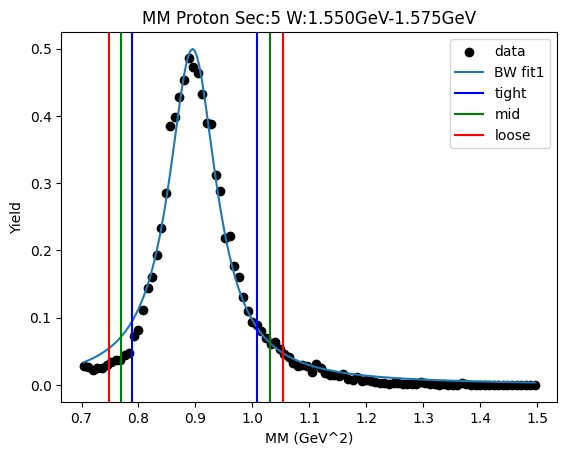

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.79087179 0.77120503 0.75178589]
 [1.00115829 1.02354883 1.04618699]]
Cut Bounds Err [[1.79129994e-06 2.11848180e-06 2.43733645e-06]
 [2.01542500e-06 2.44058588e-06 2.87523307e-06]]


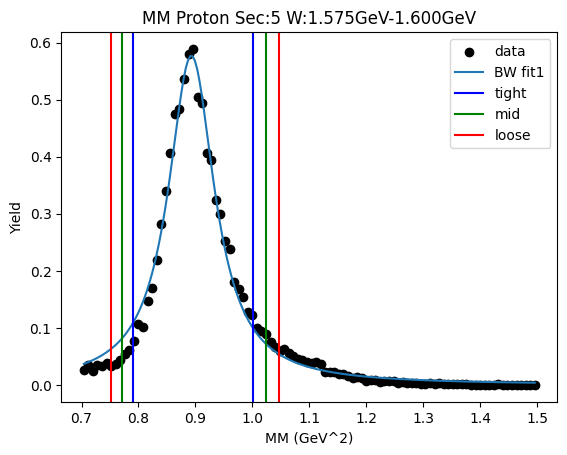

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.79147651 0.77252751 0.75380811]
 [0.99359386 1.01506833 1.03677239]]
Cut Bounds Err [[1.69654596e-06 2.00735985e-06 2.31060380e-06]
 [1.90086407e-06 2.30099616e-06 2.70979722e-06]]


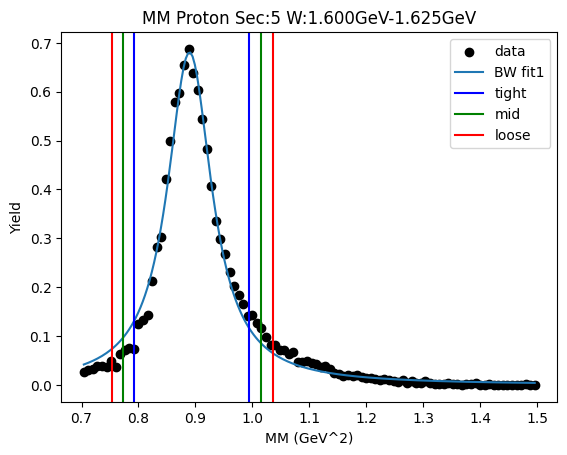

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.79451669 0.77594652 0.75759595]
 [0.992296   1.01328169 1.03448698]]
Cut Bounds Err [[1.41695034e-06 1.67701745e-06 1.93092527e-06]
 [1.58352067e-06 1.91640273e-06 2.25636398e-06]]


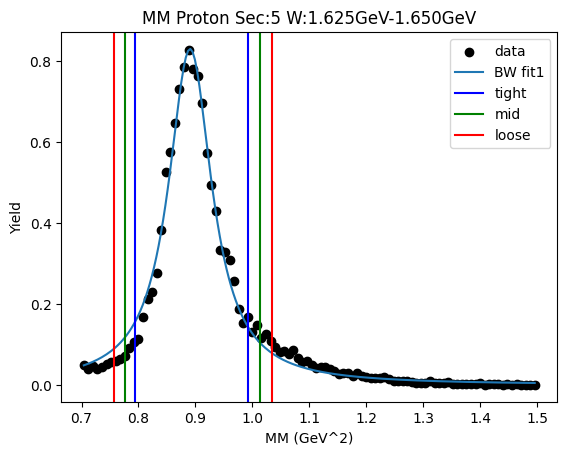

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.79868759 0.78105115 0.76361162]
 [0.98588151 1.00568387 1.02568312]]
Cut Bounds Err [[1.10821922e-06 1.31247231e-06 1.51219702e-06]
 [1.23125943e-06 1.48929644e-06 1.75258350e-06]]


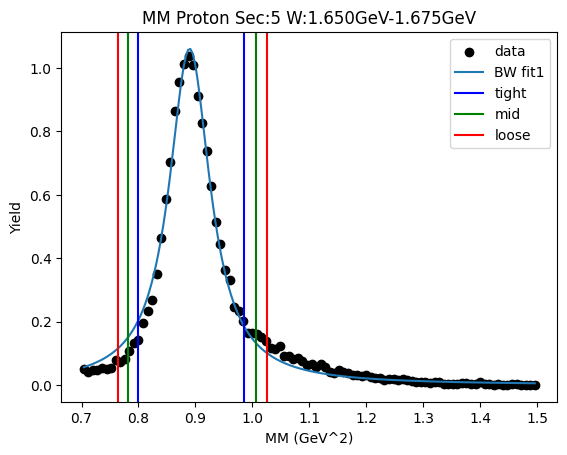

W bin: 11 1.675GeV-1.700GeV
background fit [0.03314013 0.94000061 0.12366381 0.01114327 1.13234917 0.08014432]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8823420496289188 0.8908119132848157
Breit-Wigner Peak [0.07797241 0.94158217 0.03757185]
Gaus2 [0.160213   0.94       0.02880588]
Gaus3 [0.0540151  1.04298736 0.09493122]
Cut Bounds [[0.81290441 0.79855332 0.78433004]
 [0.96344477 0.97920175 0.99508654]]
Cut Bounds Err [[1.75634020e-06 2.04714864e-06 2.33736976e-06]
 [1.91206351e-06 2.26690598e-06 2.63274273e-06]]


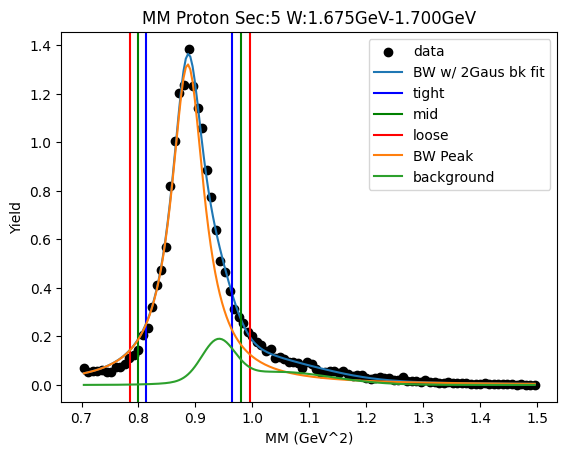

W bin: 12 1.700GeV-1.725GeV
background fit [0.06035664 0.96291019 0.00206655 0.03413128 1.08133366 0.09339838]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.885483155263008 0.8942106539297983
Breit-Wigner Peak [0.09016199 0.94331697 0.038139  ]
Gaus2 [0.16307214 0.94       0.02513453]
Gaus3 [0.0582702  1.0551886  0.09592552]
Cut Bounds [[0.81494595 0.80036085 0.78590744]
 [0.96804026 0.98407402 1.00023948]]
Cut Bounds Err [[1.69966536e-06 1.93828903e-06 2.18094692e-06]
 [1.85244674e-06 2.14926271e-06 2.46043214e-06]]


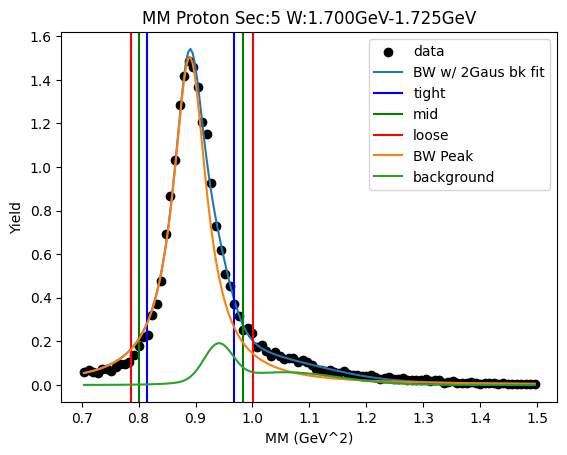

W bin: 13 1.725GeV-1.750GeV
background fit [0.05690464 0.95346501 0.00267458 0.03298456 1.02131523 0.15438883]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8864650537822438 0.8952887219931005
Breit-Wigner Peak [0.08489019 0.94386275 0.03834855]
Gaus2 [0.23272981 0.94       0.02991567]
Gaus3 [0.06863178 1.04871815 0.10002307]
Cut Bounds [[0.81552895 0.80085881 0.78632181]
 [0.9695535  0.98568827 1.00195618]]
Cut Bounds Err [[1.91390394e-06 2.24159432e-06 2.56711636e-06]
 [2.08682646e-06 2.48684566e-06 2.89780900e-06]]


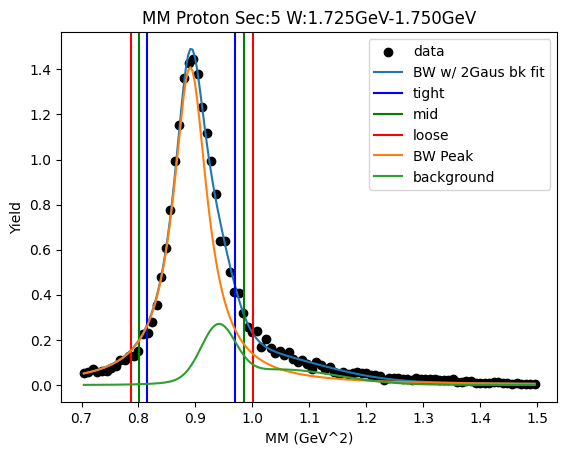

W bin: 14 1.750GeV-1.775GeV
background fit [0.04266408 0.9501841  0.0013486  0.05149817 0.94       0.18258354]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8857948802361502 0.89509935628699
Breit-Wigner Peak [0.07599895 0.94363506 0.03937951]
Gaus2 [0.25964011 0.94       0.04651172]
Gaus3 [0.0607232  1.08170971 0.11298479]
Cut Bounds [[0.81313856 0.79809805 0.78319795]
 [0.97126574 0.98785068 1.00457601]]
Cut Bounds Err [[1.55164134e-06 1.83970284e-06 2.12272200e-06]
 [1.69581354e-06 2.04675190e-06 2.40407909e-06]]


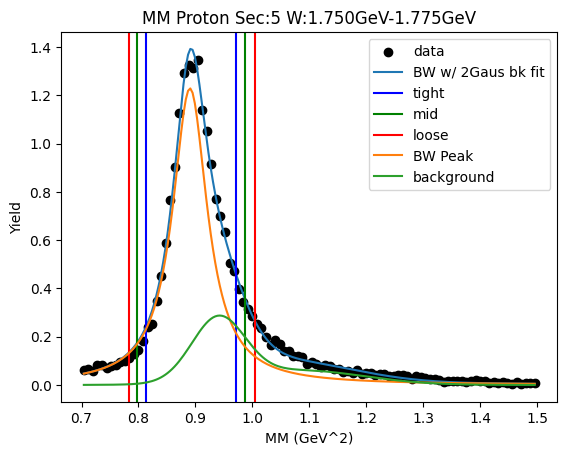

W bin: 15 1.775GeV-1.800GeV
background fit [0.06772791 1.02818735 0.04681788 0.0275296  1.1726305  0.12909152]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8883669469391142 0.8974160860429841
Breit-Wigner Peak [0.08081828 0.94492937 0.03883542]
Gaus2 [0.15261778 0.95847138 0.06522594]
Gaus3 [0.04791069 1.12791081 0.12725333]
Cut Bounds [[0.81652024 0.80165563 0.78692757]
 [0.97267653 0.98904318 1.00554639]]
Cut Bounds Err [[3.21248618e-06 3.81915256e-06 4.41415396e-06]
 [3.50624298e-06 4.24209813e-06 4.98977715e-06]]


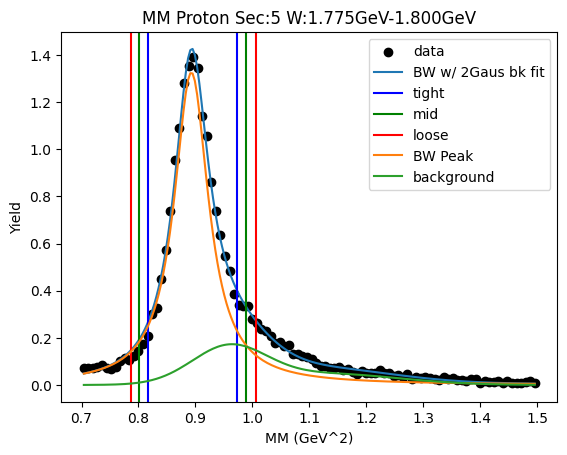

W bin: 16 1.800GeV-1.825GeV
background fit [0.07194917 1.03779803 0.0604689  0.02994088 1.18122949 0.14142023]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8846738927695205 0.8928739088640113
Breit-Wigner Peak [0.07985184 0.94274806 0.03696849]
Gaus2 [0.15458015 0.94       0.05023269]
Gaus3 [0.09392578 1.0664498  0.11587975]
Cut Bounds [[0.81616747 0.8020174  0.78799106]
 [0.96447374 0.97998492 0.99561983]]
Cut Bounds Err [[3.25102969e-06 3.86626719e-06 4.47032912e-06]
 [3.53408100e-06 4.27375544e-06 5.02487919e-06]]


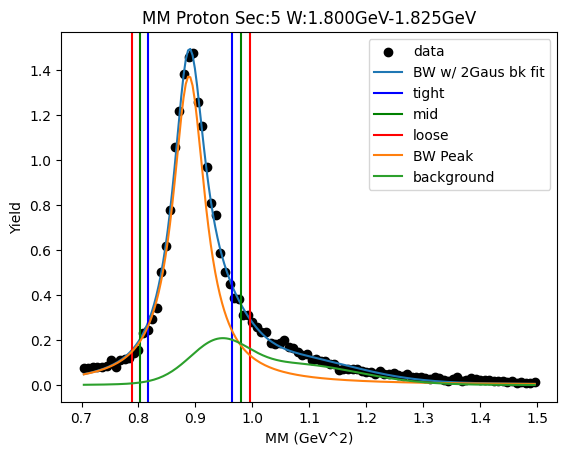

W bin: 17 1.825GeV-1.850GeV
background fit [0.03137693 1.23079859 0.13859045 0.06841855 1.06987723 0.06109096]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8878434325149333 0.8977019008800197
Breit-Wigner Peak [0.09829499 0.94486648 0.0405349 ]
Gaus2 [0.03253707 1.23197626 0.14783573]
Gaus3 [0.09091085 1.02354612 0.09098445]
Cut Bounds [[0.81314269 0.79766298 0.78233203]
 [0.9761217  0.99323779 1.01050265]]
Cut Bounds Err [[1.85599469e-06 2.20531739e-06 2.54762463e-06]
 [2.03350541e-06 2.46086621e-06 2.89540027e-06]]


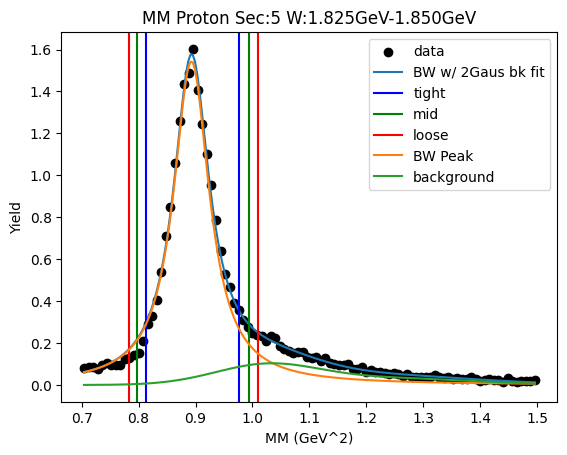

W bin: 18 1.850GeV-1.875GeV
background fit [0.02981128 1.21631578 0.17645203 0.05445964 1.06155343 0.09796837]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8847907743930705 0.8928410794056818
Breit-Wigner Peak [0.09452058 0.94277035 0.03662946]
Gaus2 [0.09039128 1.10572632 0.13176115]
Gaus3 [0.18282357 0.94       0.04366916]
Cut Bounds [[0.81685956 0.80283272 0.78892736]
 [0.96380923 0.97917232 0.99465689]]
Cut Bounds Err [[1.11195251e-06 1.31968608e-06 1.52404054e-06]
 [1.20783631e-06 1.45742987e-06 1.71125471e-06]]


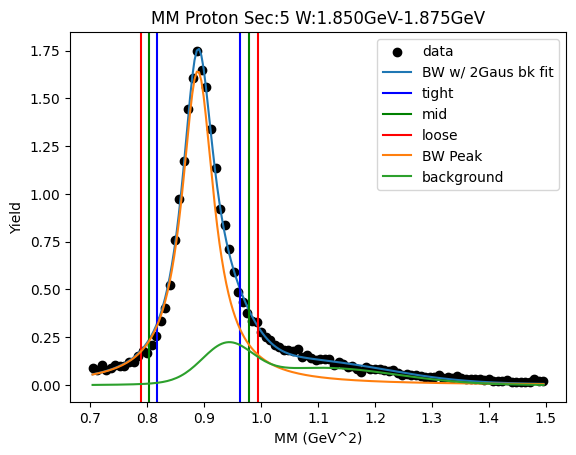

W bin: 19 1.875GeV-1.900GeV
background fit [0.06641241 1.13124787 0.16110836 0.03241644 1.01096054 0.02542018]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8870182390215258 0.8946372316068312
Breit-Wigner Peak [0.10052523 0.94383671 0.0356347 ]
Gaus2 [0.0862712  1.12466196 0.14119174]
Gaus3 [0.16779703 0.94       0.0501685 ]
Cut Bounds [[0.82070455 0.80702482 0.79346005]
 [0.96382515 0.97876954 0.9938289 ]]
Cut Bounds Err [[1.82238213e-06 2.16733711e-06 2.50636858e-06]
 [1.97490021e-06 2.38683966e-06 2.80503454e-06]]


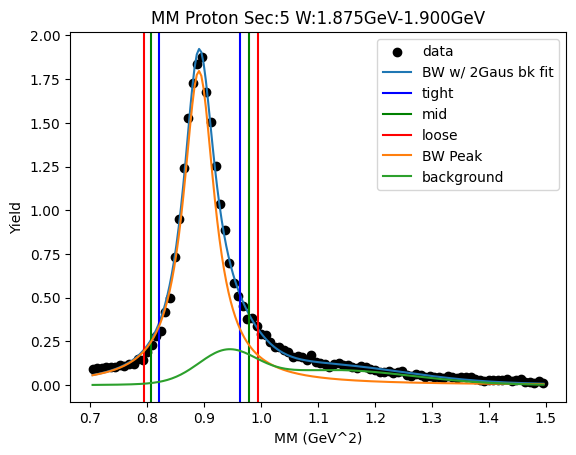

W bin: 20 1.900GeV-1.925GeV
background fit [0.02035243 1.41665326 0.05951667 0.08016604 1.06548605 0.17804169]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.885883498765003 0.89332598438928
Breit-Wigner Peak [0.09888789 0.9431886  0.03521952]
Gaus2 [0.09445471 1.1197743  0.15925641]
Gaus3 [0.2254501  0.94       0.04755365]
Cut Bounds [[0.82033059 0.80681268 0.79340707]
 [0.96168653 0.9764398  0.99130538]]
Cut Bounds Err [[2.35455220e-06 2.80111058e-06 3.24001850e-06]
 [2.54935688e-06 3.08153167e-06 3.62162258e-06]]


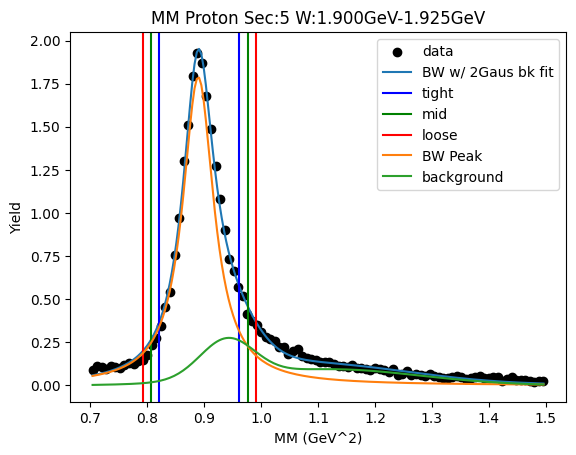

W bin: 21 1.925GeV-1.950GeV
background fit [0.06029943 1.16959598 0.22480477 0.04550281 1.04017173 0.06306838]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8870951419410803 0.8941875688806092
Breit-Wigner Peak [0.10223244 0.94373797 0.03438126]
Gaus2 [0.09769374 1.13057227 0.16701045]
Gaus3 [0.20171291 0.94       0.05099866]
Cut Bounds [[0.82294318 0.80972462 0.79661308]
 [0.96101511 0.97541093 0.98991377]]
Cut Bounds Err [[4.40219820e-06 5.23955885e-06 6.06278988e-06]
 [4.75718207e-06 5.75068870e-06 6.75845590e-06]]


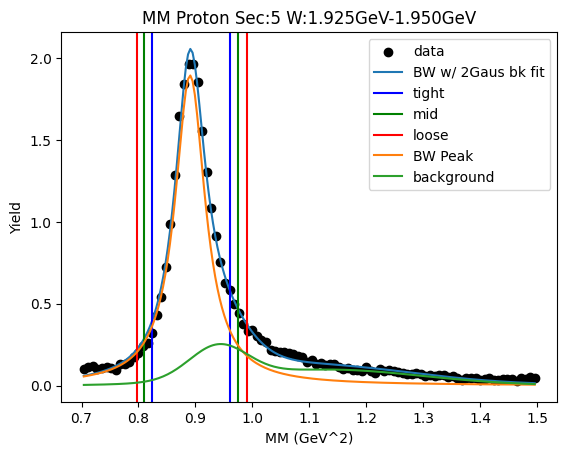

W bin: 22 1.950GeV-1.975GeV
background fit [0.05195421 1.2188854  0.20062271 0.05915373 1.05325363 0.07517217]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8878410896077377 0.895070173865994
Breit-Wigner Peak [0.10345383 0.94416928 0.03471091]
Gaus2 [0.10127861 1.11911326 0.1651432 ]
Gaus3 [0.18845885 0.94       0.04759822]
Cut Bounds [[0.82308946 0.80974348 0.79650659]
 [0.96254894 0.97709485 0.99174985]]
Cut Bounds Err [[4.70993400e-06 5.60489726e-06 6.48467151e-06]
 [5.09334049e-06 6.15690266e-06 7.23593017e-06]]


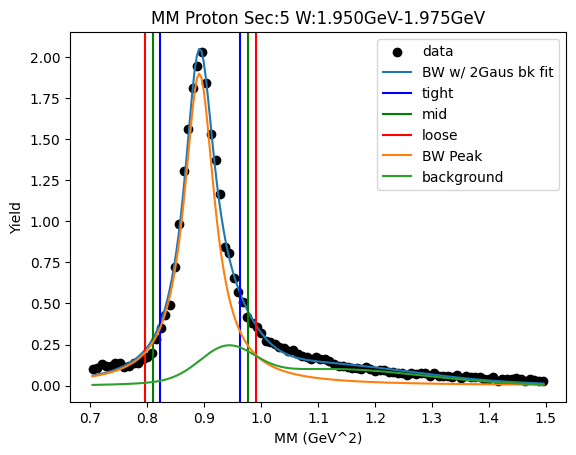

W bin: 23 1.975GeV-2.000GeV
background fit [0.06928368 1.15214835 0.22230692 0.04770795 1.03682607 0.04387352]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8882124238171469 0.8955063084955148
Breit-Wigner Peak [0.10246467 0.94438306 0.03486614]
Gaus2 [0.08818064 1.16558877 0.17125337]
Gaus3 [0.16769425 0.95772692 0.061391  ]
Cut Bounds [[0.82317773 0.8097716  0.79647552]
 [0.96329258 0.97790941 0.9926363 ]]
Cut Bounds Err [[3.03875686e-06 3.61641295e-06 4.18417136e-06]
 [3.28721608e-06 3.97416650e-06 4.67109095e-06]]


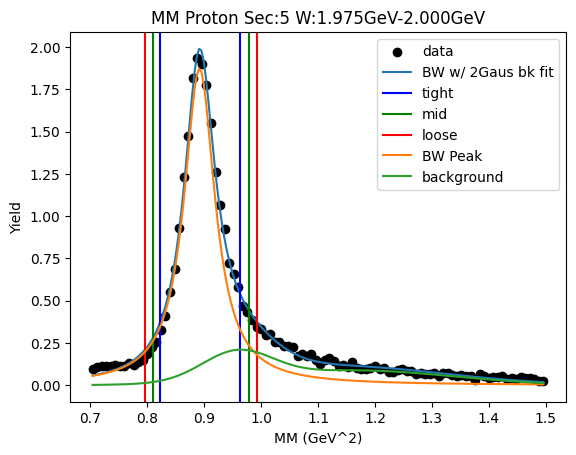

W bin: 24 2.000GeV-2.025GeV
background fit [0.05790304 1.25999722 0.18849018 0.07641438 1.05169515 0.07854518]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8875537532035833 0.8945106037462629
Breit-Wigner Peak [0.09689467 0.94394501 0.03405107]
Gaus2 [0.1096611  1.13189622 0.17157221]
Gaus3 [0.20272425 0.94       0.05097842]
Cut Bounds [[0.82395645 0.81085624 0.797861  ]
 [0.96073234 0.9749873  0.98934725]]
Cut Bounds Err [[9.15661014e-06 1.08994833e-05 1.26132319e-05]
 [9.88743860e-06 1.19518039e-05 1.40454978e-05]]


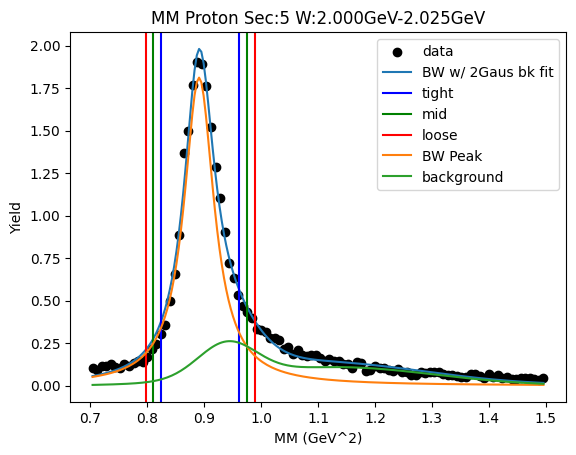

W bin: 25 2.025GeV-2.050GeV
background fit [0.06214237 1.20466681 0.23942079 0.06781511 1.03883227 0.08324647]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8863464504914652 0.892466928773627
Breit-Wigner Peak [0.09173164 0.94308361 0.03193869]
Gaus2 [0.11643435 1.12065336 0.17854777]
Gaus3 [0.2290947  0.94       0.05189504]
Cut Bounds [[0.82647423 0.81416481 0.80194774]
 [0.95464807 0.96797341 0.98139112]]
Cut Bounds Err [[6.69046730e-06 7.96832490e-06 9.22621046e-06]
 [7.19057206e-06 8.68845559e-06 1.02063718e-05]]


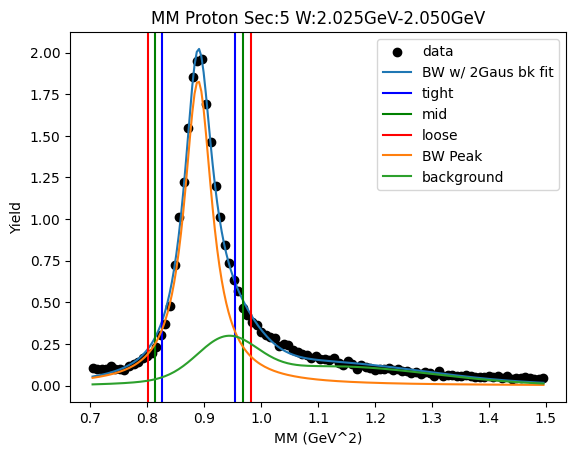

W bin: 26 2.050GeV-2.075GeV
background fit [0.08154931 1.18955229 0.18295569 0.06792484 1.03341477 0.03798444]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8886467648735843 0.8956974199692029
Breit-Wigner Peak [0.10367477 0.94454862 0.03427987]
Gaus2 [0.09315218 1.19326518 0.16341694]
Gaus3 [0.15374678 0.97093044 0.06632662]
Cut Bounds [[0.82461051 0.81141738 0.79833063]
 [0.96239349 0.97675695 0.9912268 ]]
Cut Bounds Err [[2.03585235e-06 2.42303254e-06 2.80372542e-06]
 [2.19936941e-06 2.65846135e-06 3.12414082e-06]]


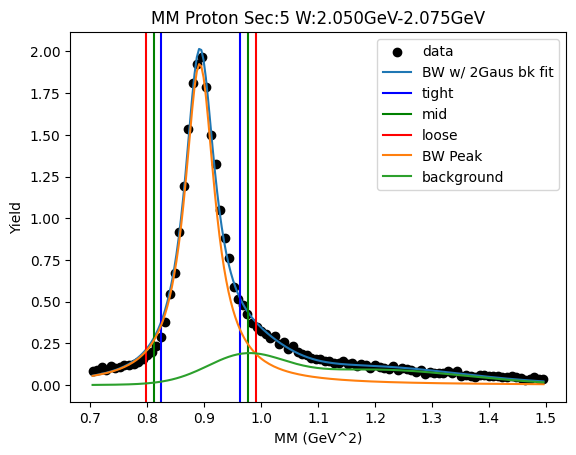

W bin: 27 2.075GeV-2.100GeV
background fit [0.07243654 1.23828146 0.20780762 0.06861458 1.03972564 0.06051674]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8890339713002179 0.8961873848584901
Breit-Wigner Peak [0.10119727 0.94478076 0.03452876]
Gaus2 [0.08832771 1.21219682 0.18778435]
Gaus3 [0.1485544  0.97732777 0.06691214]
Cut Bounds [[0.82455122 0.81126316 0.79808304]
 [0.96336872 0.97784416 0.99242754]]
Cut Bounds Err [[2.61260681e-06 3.10917879e-06 3.59738066e-06]
 [2.82397928e-06 3.41349792e-06 4.01154583e-06]]


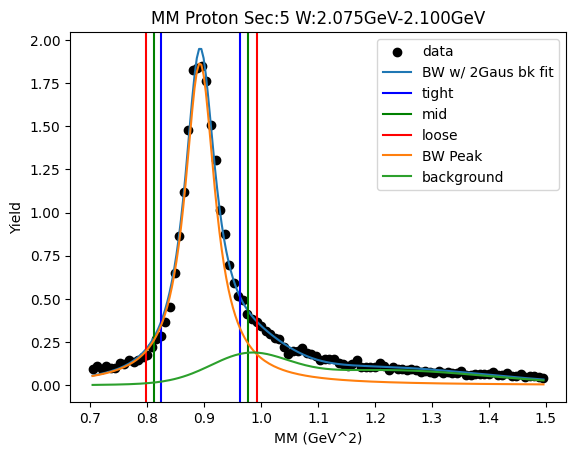

W bin: 28 2.100GeV-2.125GeV
background fit [0.0695048  1.24670078 0.20043518 0.0735359  1.06336923 0.07111215]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8891756651155169 0.8963621528879677
Breit-Wigner Peak [0.10238121 0.94486449 0.0346085 ]
Gaus2 [0.08399368 1.23112521 0.17323304]
Gaus3 [0.12690479 0.99720875 0.08198319]
Cut Bounds [[0.82454925 0.81123065 0.79802049]
 [0.96369963 0.9782111  0.99283102]]
Cut Bounds Err [[1.88734312e-06 2.24618406e-06 2.59894108e-06]
 [2.04039104e-06 2.46654736e-06 2.89885892e-06]]


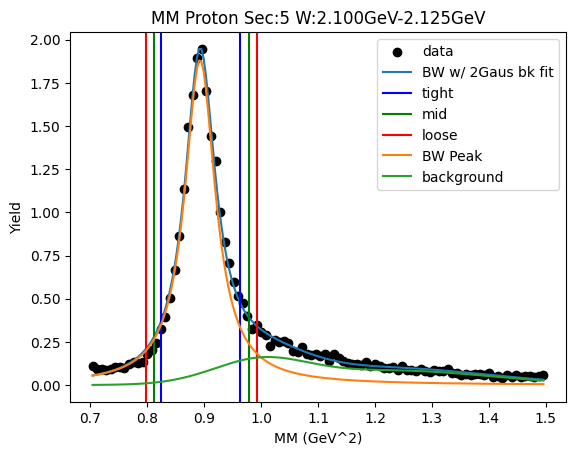

Runtime Error1.2
	Just skip it for now


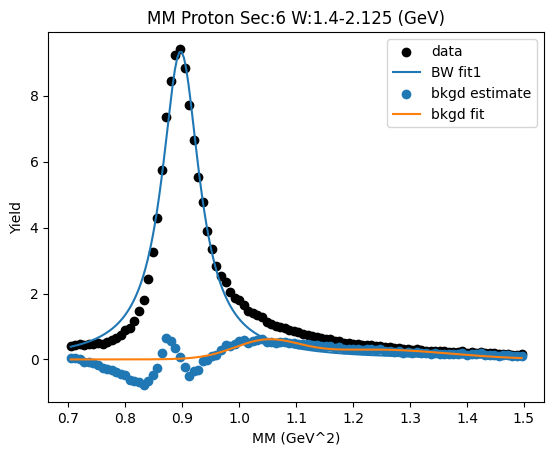

W bin: 0 1.400GeV-1.425GeV
Cut Bounds [[0.77015601 0.74926374 0.72865876]
 [0.99487943 1.01893184 1.04327154]]
Cut Bounds Err [[1.57530383e-05 1.86096003e-05 2.13856575e-05]
 [1.79044176e-05 2.17016250e-05 2.55893463e-05]]


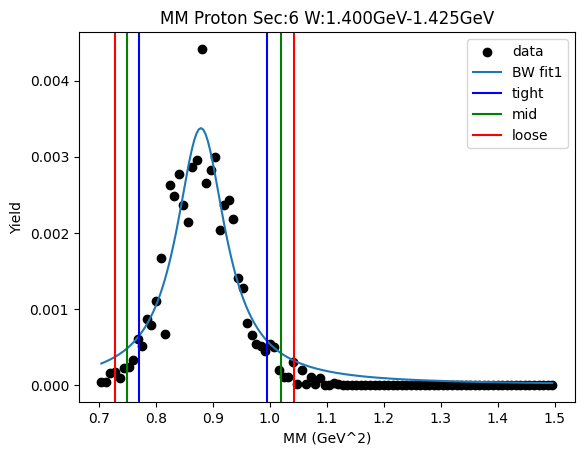

W bin: 1 1.425GeV-1.450GeV
Cut Bounds [[0.79325656 0.77581676 0.75857079]
 [0.97831608 0.99788818 1.01765412]]
Cut Bounds Err [[8.06944893e-06 9.55722870e-06 1.10121844e-05]
 [8.96141596e-06 1.08391029e-05 1.27548546e-05]]


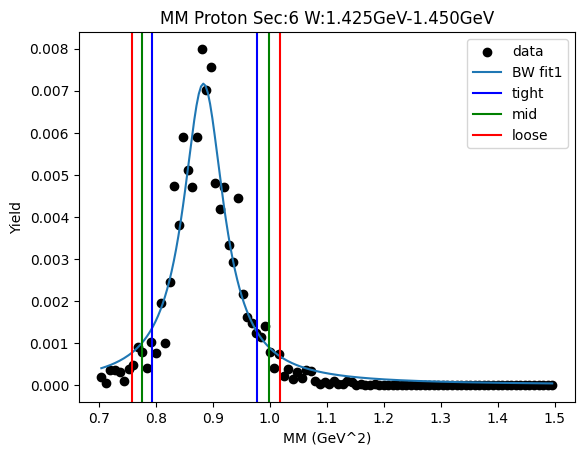

W bin: 2 1.450GeV-1.475GeV
Cut Bounds [[0.79303904 0.77484482 0.75686174]
 [0.98659384 1.00711058 1.02783846]]
Cut Bounds Err [[4.54703255e-06 5.38277519e-06 6.19914542e-06]
 [5.07165823e-06 6.13673619e-06 7.22413712e-06]]


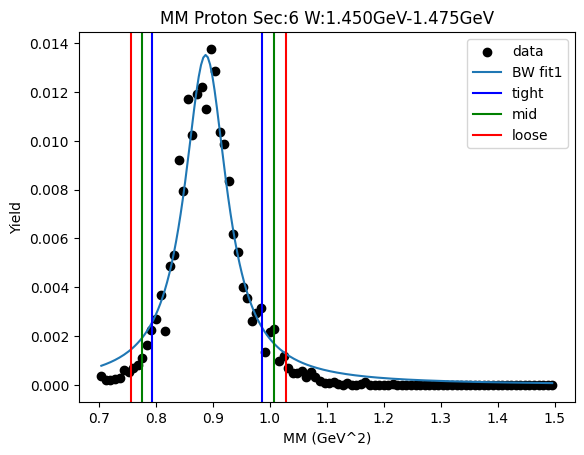

W bin: 3 1.475GeV-1.500GeV
Cut Bounds [[0.80179852 0.78479242 0.7679686 ]
 [0.9818854  1.00089667 1.02009022]]
Cut Bounds Err [[2.79276279e-06 3.30893683e-06 3.81419032e-06]
 [3.09052189e-06 3.73685028e-06 4.39592142e-06]]


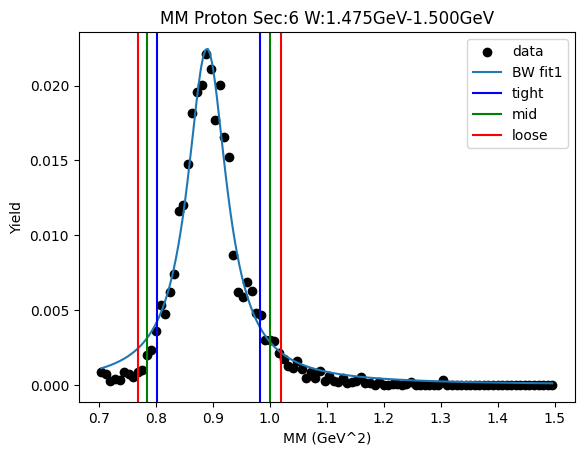

W bin: 4 1.500GeV-1.525GeV
Cut Bounds [[0.80654522 0.78887935 0.7714091 ]
 [0.9939628  1.01378045 1.03379372]]
Cut Bounds Err [[5.07723153e-06 6.01350329e-06 6.92921740e-06]
 [5.63634637e-06 6.81701445e-06 8.02155845e-06]]


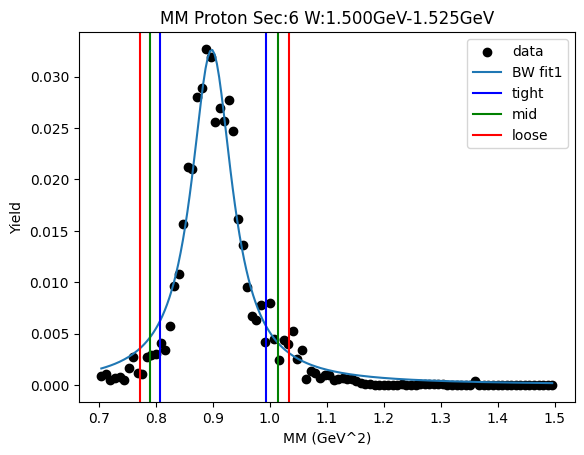

W bin: 5 1.525GeV-1.550GeV
Cut Bounds [[0.80370517 0.78529869 0.76710544]
 [0.99949712 1.02024904 1.04121417]]
Cut Bounds Err [[4.76465556e-06 5.64045147e-06 6.49599564e-06]
 [5.31341703e-06 6.42909031e-06 7.56812383e-06]]


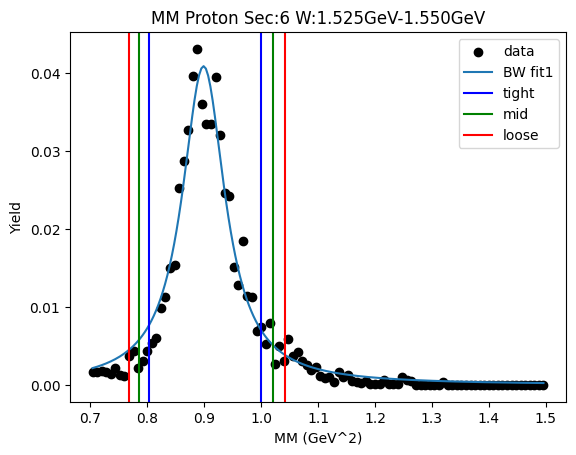

W bin: 6 1.550GeV-1.575GeV
Cut Bounds [[0.80736125 0.78916282 0.77117185]
 [1.00075502 1.02123535 1.04192313]]
Cut Bounds Err [[3.26795922e-06 3.86934061e-06 4.45707136e-06]
 [3.63836753e-06 4.40166080e-06 5.18074055e-06]]


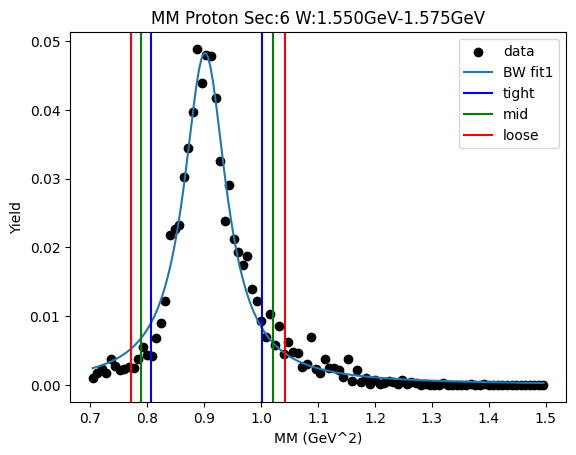

W bin: 7 1.575GeV-1.600GeV
Cut Bounds [[0.79809553 0.77850055 0.75914911]
 [1.00744058 1.0297146  1.05223217]]
Cut Bounds Err [[4.90737742e-06 5.80459043e-06 6.67930930e-06]
 [5.51355536e-06 6.67575755e-06 7.86364318e-06]]


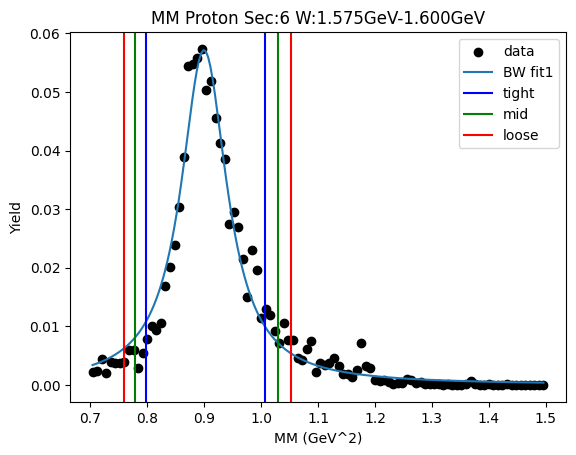

W bin: 8 1.600GeV-1.625GeV
Cut Bounds [[0.80914162 0.79181989 0.77468558]
 [0.992667   1.01205034 1.0316211 ]]
Cut Bounds Err [[2.18525518e-06 2.58887204e-06 2.98385941e-06]
 [2.42042528e-06 2.92683634e-06 3.44330687e-06]]


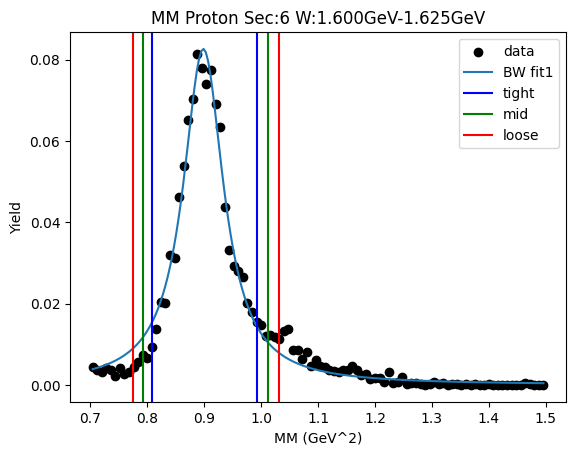

W bin: 9 1.625GeV-1.650GeV
Cut Bounds [[0.80757901 0.79058098 0.77376375]
 [0.98750308 1.00648986 1.02565744]]
Cut Bounds Err [[1.89934205e-06 2.25056202e-06 2.59441839e-06]
 [2.10029308e-06 2.53934966e-06 2.98701218e-06]]


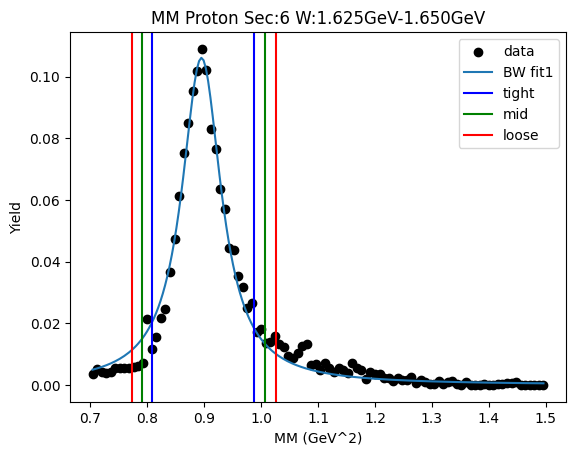

W bin: 10 1.650GeV-1.675GeV
Cut Bounds [[0.80641241 0.78943718 0.77264252]
 [0.98609619 1.00505772 1.02419982]]
Cut Bounds Err [[2.47845977e-06 2.93676776e-06 3.38546548e-06]
 [2.74070893e-06 3.31364759e-06 3.89781691e-06]]


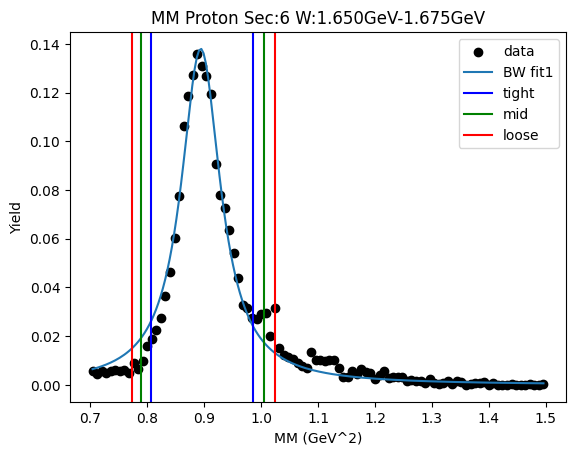

W bin: 11 1.675GeV-1.700GeV
Value Error2.2
	Just skip it for now
Cut Bounds [[0.80933878 0.79212812 0.77510241]
 [0.99161854 1.01086383 1.03029408]]
Cut Bounds Err [[0.09616742 0.115401   0.13463457]
 [0.09616832 0.11540189 0.13463547]]


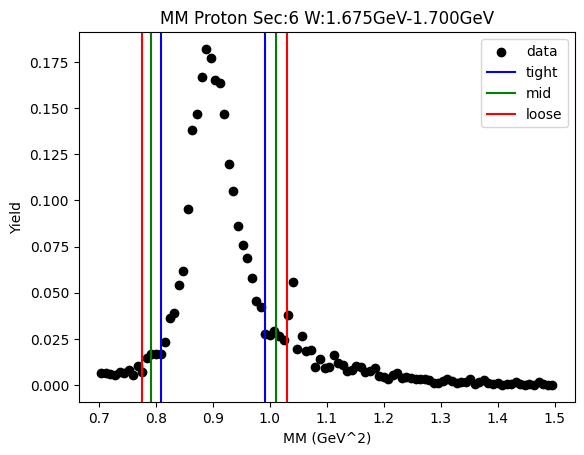

W bin: 12 1.700GeV-1.725GeV
background fit [0.00944388 1.00426248 0.00766452 0.0073964  0.9967682  0.16242297]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8885706545616529 0.8953288127008895
Breit-Wigner Peak [0.01201285 0.9444309  0.03356128]
Gaus2 [0.03653557 0.94       0.04365567]
Gaus3 [0.00970245 1.08440435 0.1006656 ]
Cut Bounds [[0.82578551 0.8128586  0.80003367]
 [0.96066344 0.97471211 0.98886277]]
Cut Bounds Err [[2.28517900e-06 2.71170259e-06 3.13232383e-06]
 [2.46474632e-06 2.96942756e-06 3.48241507e-06]]


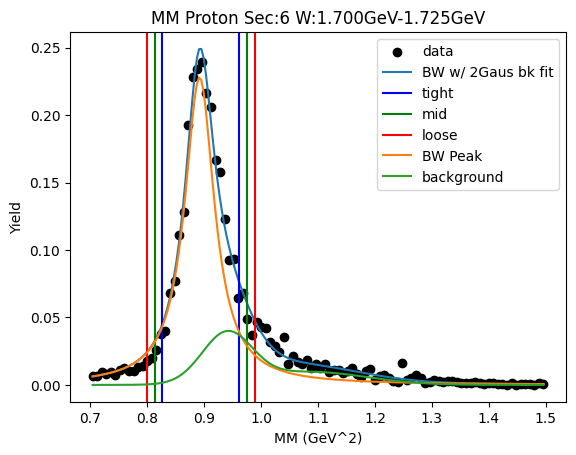

W bin: 13 1.725GeV-1.750GeV
background fit [0.01142318 1.02735895 0.07632913 0.00413504 1.23860452 0.02127058]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8911410949677621 0.8991350463698957
Breit-Wigner Peak [0.01268801 0.94611737 0.03650103]
Gaus2 [0.03867185 0.94       0.04846029]
Gaus3 [0.01215352 1.06764682 0.08822663]
Cut Bounds [[0.82316876 0.80913678 0.79522543]
 [0.97012305 0.98548193 1.00096144]]
Cut Bounds Err [[2.83204782e-06 3.35609318e-06 3.87235068e-06]
 [3.07446501e-06 3.70379868e-06 4.34448422e-06]]


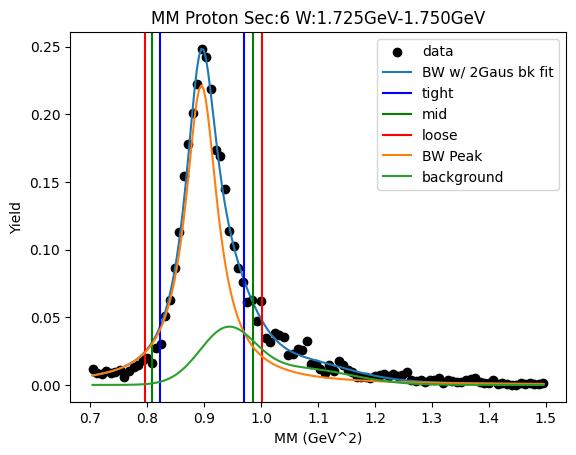

W bin: 14 1.750GeV-1.775GeV
background fit [0.01046489 1.00726395 0.01992923 0.00719249 1.0884411  0.12070465]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8910989070117196 0.8994242366846762
Breit-Wigner Peak [0.01266597 0.94618263 0.0372499 ]
Gaus2 [0.04783004 0.94       0.04951438]
Gaus3 [0.01282676 1.08632015 0.10502361]
Cut Bounds [[0.82184211 0.8075351  0.79335372]
 [0.97182172 0.98751063 1.00332517]]
Cut Bounds Err [[2.82083967e-06 3.34689315e-06 3.86431727e-06]
 [3.06745010e-06 3.70111034e-06 4.34570455e-06]]


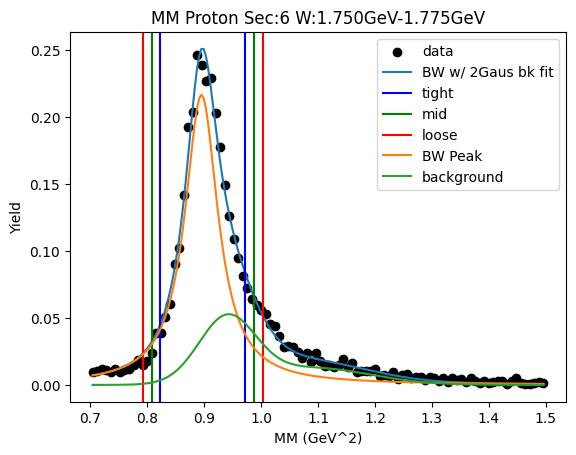

W bin: 15 1.775GeV-1.800GeV
background fit [0.01366829 1.03723107 0.06189801 0.00590703 1.17214175 0.12845432]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8883213045031632 0.8963485495652247
Breit-Wigner Peak [0.01304226 0.94463481 0.03657696]
Gaus2 [0.04324934 0.94       0.05052472]
Gaus3 [0.01937787 1.07411964 0.10724495]
Cut Bounds [[0.82033442 0.80629771 0.79238213]
 [0.96736367 0.9827328  0.99822307]]
Cut Bounds Err [[5.96834466e-06 7.09433860e-06 8.20071297e-06]
 [6.48116850e-06 7.83216676e-06 9.20445496e-06]]


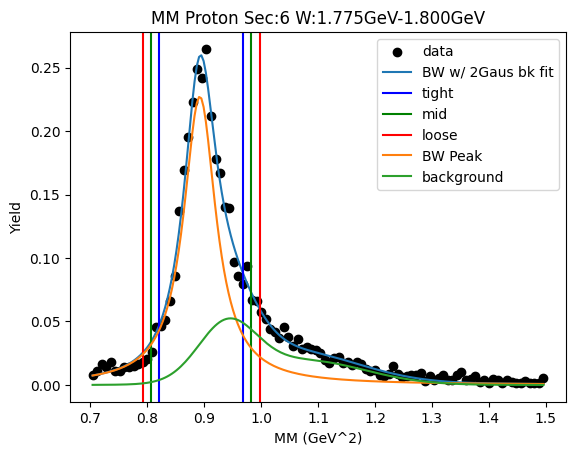

W bin: 16 1.800GeV-1.825GeV
background fit [0.02689487 1.03658514 0.04140395 0.00841891 1.16085262 0.108068  ]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.890277991241206 0.897901942890265
Breit-Wigner Peak [0.01705076 0.94556331 0.0356463 ]
Gaus2 [0.03798793 0.99808693 0.07505641]
Gaus3 [0.00773533 1.1880168  0.12877785]
Cut Bounds [[0.82381348 0.81010331 0.79650819]
 [0.96724255 0.9822182  0.99730889]]
Cut Bounds Err [[2.74132154e-06 3.26111455e-06 3.77188791e-06]
 [2.97038832e-06 3.59087128e-06 4.22064185e-06]]


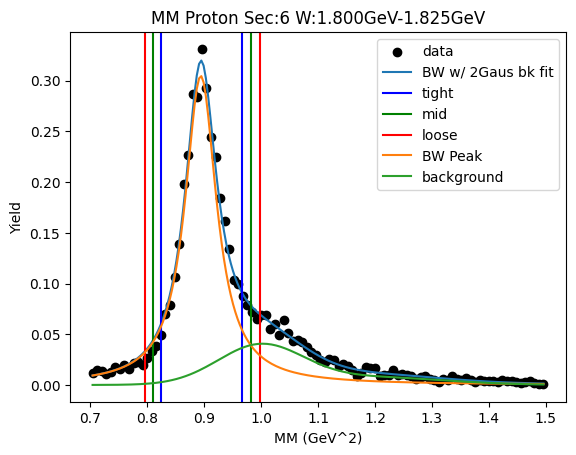

W bin: 17 1.825GeV-1.850GeV
background fit [0.01746733 1.05241754 0.0918121  0.0053215  1.23118754 0.19042558]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8884295847773215 0.8957805751353233
Breit-Wigner Peak [0.0179374  0.94451314 0.03500236]
Gaus2 [0.04767843 0.94       0.04658309]
Gaus3 [0.02479927 1.0838184  0.11534531]
Cut Bounds [[0.82315082 0.80969274 0.79634559]
 [0.96383246 0.97851072 0.99329989]]
Cut Bounds Err [[2.13746035e-06 2.54127860e-06 2.93845803e-06]
 [2.31291214e-06 2.79366901e-06 3.28177572e-06]]


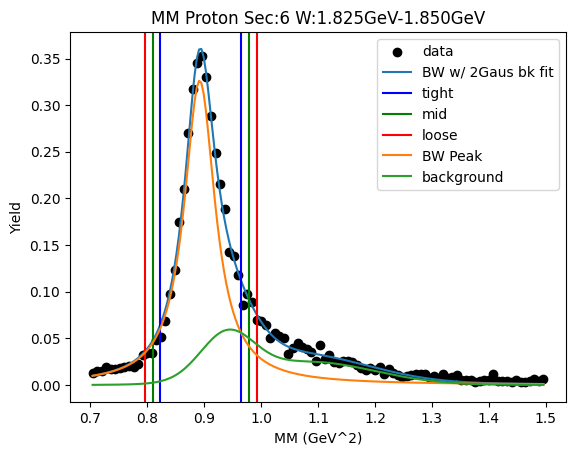

W bin: 18 1.850GeV-1.875GeV
background fit [0.01537388 1.03527002 0.06652176 0.01189413 1.18613897 0.17352083]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8884616976105881 0.895647715092643
Breit-Wigner Peak [0.01950753 0.94448648 0.03460736]
Gaus2 [0.05522903 0.94000328 0.05470277]
Gaus3 [0.02393149 1.10963006 0.1434853 ]
Cut Bounds [[0.82386507 0.81055245 0.79734827]
 [0.96295523 0.97746064 0.99207448]]
Cut Bounds Err [[8.17342844e-06 9.72786237e-06 1.12558738e-05]
 [8.83647934e-06 1.06825884e-05 1.25553067e-05]]


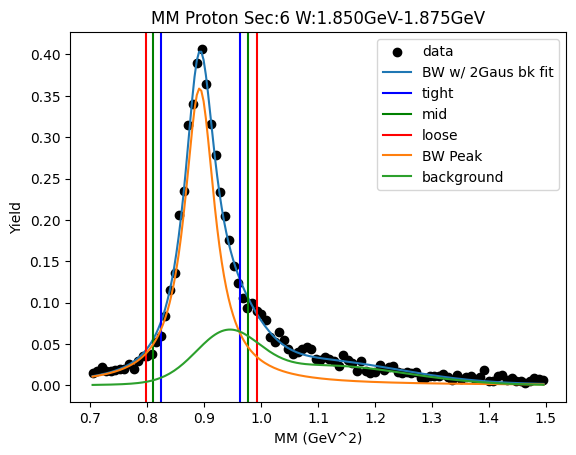

W bin: 19 1.875GeV-1.900GeV
background fit [0.01308328 1.01708929 0.02708154 0.01976696 1.07650525 0.19594035]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8873754945948266 0.8938310822467889
Breit-Wigner Peak [0.02186004 0.9437178  0.03280139]
Gaus2 [0.06074459 0.94314609 0.05284895]
Gaus3 [0.02650993 1.10875629 0.14302447]
Cut Bounds [[0.82595871 0.81332203 0.80078277]
 [0.95768321 0.97139143 0.98519707]]
Cut Bounds Err [[5.10074899e-06 6.07341185e-06 7.03047662e-06]
 [5.49244504e-06 6.63740927e-06 7.79810293e-06]]


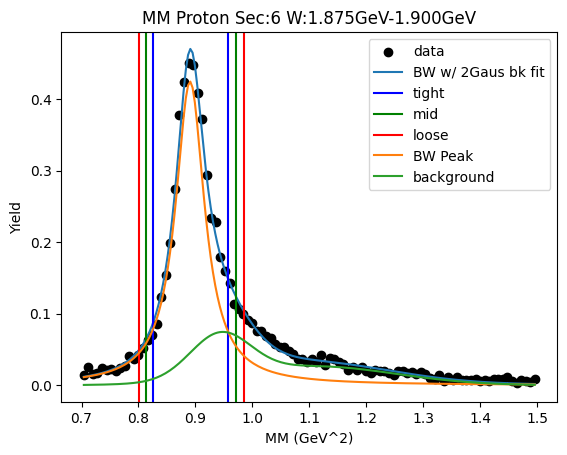

W bin: 20 1.900GeV-1.925GeV
background fit [0.01747613 1.01121094 0.02290181 0.02209627 1.1320799  0.17317534]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8908387309742694 0.8979795365734791
Breit-Wigner Peak [0.02791136 0.94573206 0.03449832]
Gaus2 [0.04172006 0.97416587 0.06474352]
Gaus3 [0.02258657 1.17737648 0.14381449]
Cut Bounds [[0.82633867 0.81304783 0.79986475]
 [0.96517343 0.97964955 0.99423342]]
Cut Bounds Err [[2.30913852e-06 2.74781794e-06 3.17915136e-06]
 [2.49559225e-06 3.01623571e-06 3.54443572e-06]]


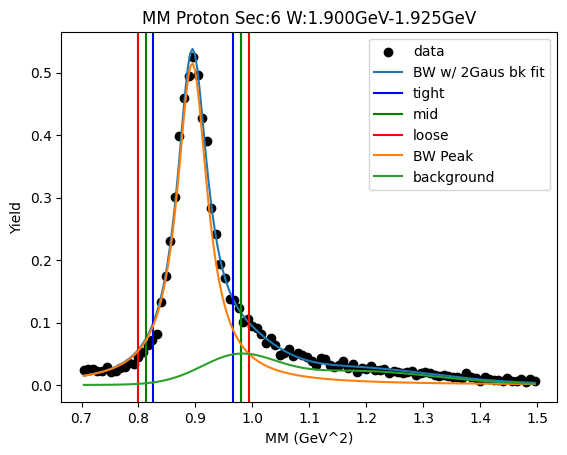

W bin: 21 1.925GeV-1.950GeV
background fit [0.02360198 1.00348247 0.02023247 0.02347471 1.12844422 0.18075956]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8891165760838431 0.8953433632343544
Breit-Wigner Peak [0.0270247  0.94457926 0.03221487]
Gaus2 [0.08525616 0.94       0.04945789]
Gaus3 [0.03235965 1.12032625 0.15218203]
Cut Bounds [[0.82866087 0.81622893 0.80389095]
 [0.95814809 0.9716136  0.98517307]]
Cut Bounds Err [[7.41494620e-06 8.83004161e-06 1.02229335e-05]
 [7.97325969e-06 9.63393144e-06 1.13170499e-05]]


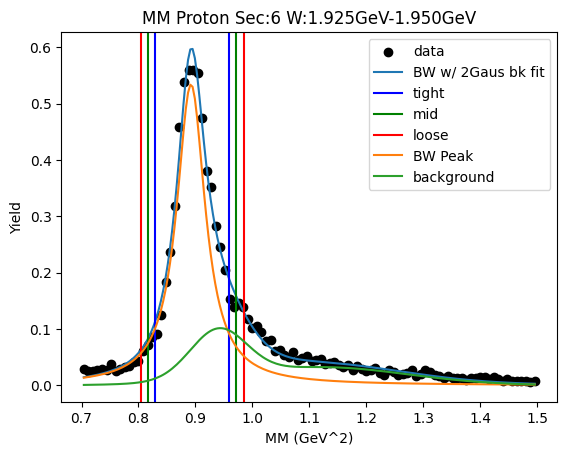

W bin: 22 1.950GeV-1.975GeV
background fit [0.0335102  1.06148824 0.06873065 0.01910084 1.30922652 0.16375222]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8920928184830875 0.9001050989059521
Breit-Wigner Peak [0.03436682 0.94662504 0.03654285]
Gaus2 [0.04846636 1.00934844 0.08382846]
Gaus3 [0.02162229 1.28129675 0.17148033]
Cut Bounds [[0.82400945 0.80995426 0.79601997]
 [0.97121106 0.98659619 1.00210223]]
Cut Bounds Err [[2.25098714e-06 2.67751414e-06 3.09640700e-06]
 [2.44378913e-06 2.95509362e-06 3.47417806e-06]]


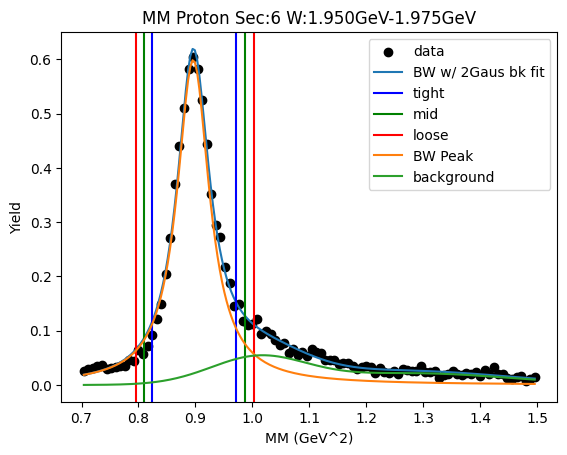

W bin: 23 1.975GeV-2.000GeV
background fit [0.03000387 1.04430782 0.06492321 0.02013962 1.21517079 0.18340033]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8880783132577252 0.8946925558130829
Breit-Wigner Peak [0.03069236 0.94413211 0.03320201]
Gaus2 [0.08355979 0.94       0.0515497 ]
Gaus3 [0.04248829 1.10435801 0.15398714]
Cut Bounds [[0.8259371  0.81314685 0.80045641]
 [0.95932896 0.97321709 0.98720502]]
Cut Bounds Err [[9.08273519e-06 1.08140960e-05 1.25172838e-05]
 [9.78874339e-06 1.18307041e-05 1.39009644e-05]]


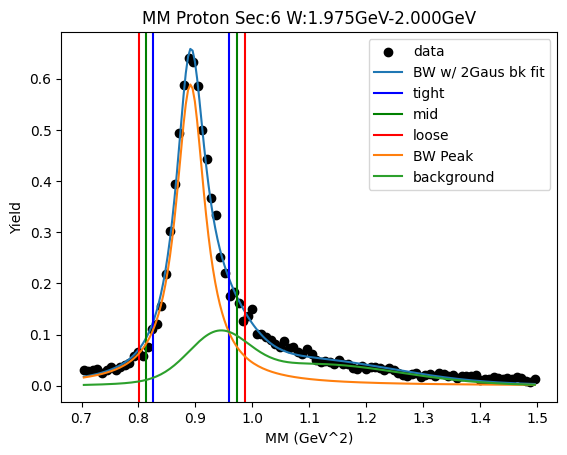

W bin: 24 2.000GeV-2.025GeV
background fit [0.03318382 1.05075994 0.11923076 0.01636515 1.27976674 0.20273704]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8892345689763738 0.894761450489944
Breit-Wigner Peak [0.0304605  0.94445646 0.0303504 ]
Gaus2 [0.09279398 0.94       0.0436625 ]
Gaus3 [0.04885854 1.0968227  0.17306932]
Cut Bounds [[0.83205192 0.8203129  0.80865728]
 [0.95402908 0.9666855  0.97942531]]
Cut Bounds Err [[3.75391518e-06 4.47227683e-06 5.18008446e-06]
 [4.01966675e-06 4.85491364e-06 5.70085837e-06]]


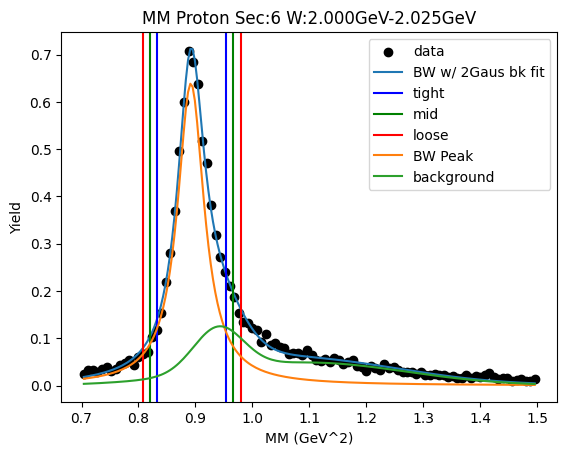

W bin: 25 2.025GeV-2.050GeV
background fit [0.02444649 1.04750456 0.06362497 0.02880599 1.19641001 0.20604956]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8882780943645557 0.8948252798279698
Breit-Wigner Peak [0.0355004  0.94422015 0.03303328]
Gaus2 [0.08863466 0.94       0.04902886]
Gaus3 [0.04824975 1.12659484 0.16986293]
Cut Bounds [[0.82642347 0.81369421 0.80106375]
 [0.9591498  0.97296581 0.98688061]]
Cut Bounds Err [[8.68593322e-06 1.03417256e-05 1.19707735e-05]
 [9.35746876e-06 1.13086610e-05 1.32868179e-05]]


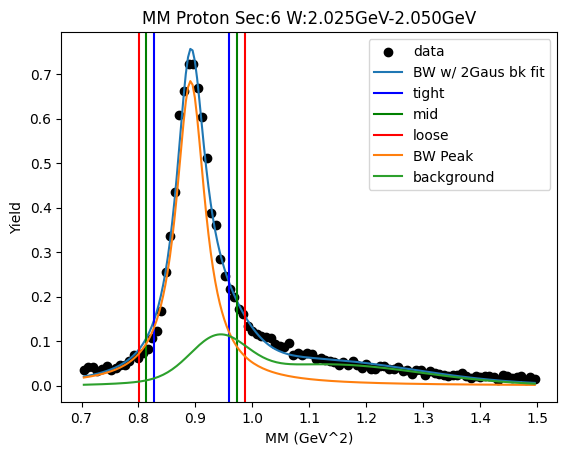

W bin: 26 2.050GeV-2.075GeV
background fit [0.04445758 1.06175583 0.08894263 0.02566506 1.28120951 0.184075  ]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8898008656637741 0.8965200241911517
Breit-Wigner Peak [0.03974381 0.94507166 0.03346431]
Gaus2 [0.07287632 0.96261252 0.06143466]
Gaus3 [0.05081978 1.15009396 0.16622053]
Cut Bounds [[0.82713811 0.81423782 0.80143891]
 [0.96171755 0.97573314 0.98985012]]
Cut Bounds Err [[5.78822431e-06 6.89098069e-06 7.97568498e-06]
 [6.24137255e-06 7.54346580e-06 8.86375002e-06]]


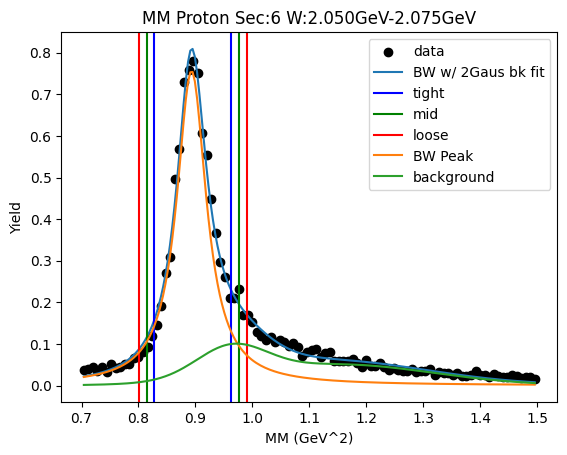

W bin: 27 2.075GeV-2.100GeV
background fit [0.03948876 1.06582289 0.06828415 0.02924743 1.2680198  0.21104894]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8903196097050805 0.8977906739463868
Breit-Wigner Peak [0.04352076 0.94554489 0.03528707]
Gaus2 [0.06671262 1.00222495 0.08408552]
Gaus3 [0.03518966 1.25032805 0.179589  ]
Cut Bounds [[0.82447391 0.81089587 0.79743057]
 [0.9664548  0.98127294 0.99620382]]
Cut Bounds Err [[3.10801041e-06 3.69830846e-06 4.27839470e-06]
 [3.36499777e-06 4.06832368e-06 4.78198829e-06]]


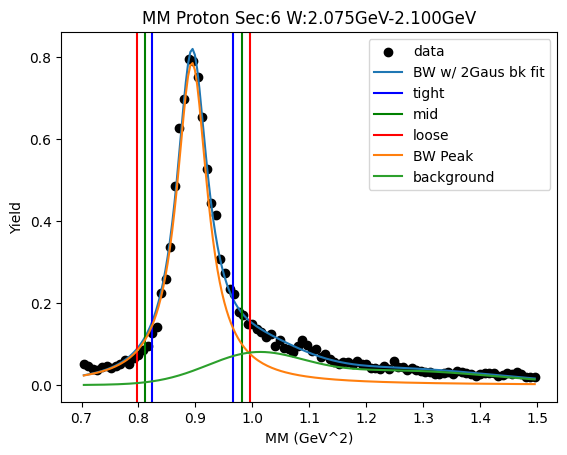

W bin: 28 2.100GeV-2.125GeV
background fit [0.03273993 1.05481536 0.05340266 0.03632746 1.2192727  0.18395397]
[[0.0, 0.0, 0.0, 0.0, 0.94, 0.0, 0.0, 0.94, 0.0], [inf, inf, inf, inf, inf, inf, inf, inf, inf]]
0.8895768636291661 0.8969014893824532
Breit-Wigner Peak [0.04768776 0.94511331 0.03493953]
Gaus2 [0.06012939 0.99248623 0.07591526]
Gaus3 [0.04116428 1.21851054 0.16488406]
Cut Bounds [[0.82436158 0.81091764 0.79758423]
 [0.96487995 0.97953969 0.99430995]]
Cut Bounds Err [[2.87608892e-06 3.42233891e-06 3.95927253e-06]
 [3.11157361e-06 3.76136656e-06 4.42066913e-06]]


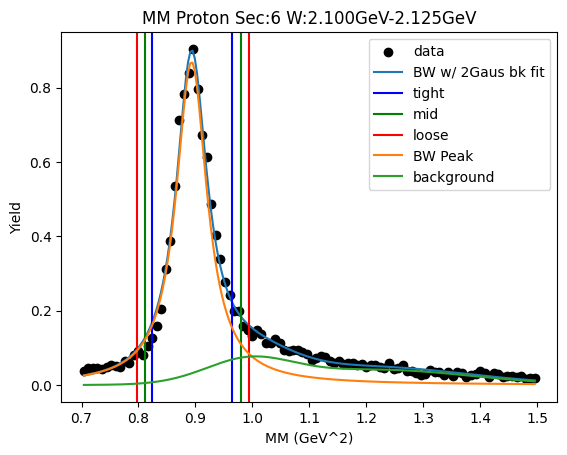

In [9]:
bkgd=True
Wlow_bin = -1
Wbin_bkgd = 11

tight = 2.5
mid = 3
loose = 3.5

a_ini=5000
m_ini=0.9
g_ini=0.1
bw_ini = [a_ini,m_ini,g_ini]

gaus2_ini = [0.04,  0.97053, 0.06287]
gaus3_ini = [706, 1.45548, 0.2417]





bw_ini_w = [1.01801152, 0.94626145, 0.039624]
gaus2_ini_w = [3.07211428, 1.01332019, 0.06742853]
gaus3_ini_w = [2.78458923, 1.26687645, 0.10165907]

bw_bounds = [[0.0,0.0,0.0],[np.inf,np.inf,np.inf]]
full_bounds = [[0.0,0.0,0.0,0.0,0.94,0.0,0.0,0.94,0.0],[np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf,np.inf]]

bkgd_bounds = [[0.0,0.94,0.0,0.0,0.94,0.0],[np.inf,np.inf,np.inf,np.inf,np.inf,np.inf]]

bw_pars = np.zeros((6,_W_bins_+1,3))
gaus2_pars = np.zeros((6,_W_bins_+1,3))
gaus3_pars = np.zeros((6,_W_bins_+1,3))

bkgd_guess_pars = np.zeros((6,_W_bins_+1,6))


ini_pars= np.zeros(9)
for i in range(3):
    ini_pars[i] = bw_ini[i]
    ini_pars[i+3] = gaus2_ini[i]
    ini_pars[i+6] = gaus3_ini[i]

    #sec W low, high, tight, mid, loose
cut_bounds = np.zeros((6,_W_bins_+1,2,3))
cut_bounds_err = np.zeros((6,_W_bins_+1,2,3))

bw_ini_w1 = np.zeros(3)
    
for sec in range(6):
    x_r=Center_Xbins(hist_name[sec][1])
    y_r=Values_1d(hist_name[sec][1])
    plt.scatter(x_r,y_r,color='k',label='data')
    plt.title("MM {} Sec:{} W:{}-{} (GeV)".format(Particle,sec+1,_W_min_,_W_max_))
    plt.xlabel("MM (GeV^2)")
    plt.ylabel("Yield")
   
    try:
        bw_ini[0] = np.max(y_r)
        bw_ini[1] = x_r[np.argmax(y_r)]
        pars_r1, pars_cov_r1 = op.curve_fit(BW_e2,x_r,y_r,p0=bw_ini,maxfev=5000,bounds=bw_bounds)
        tmp_x1 = np.linspace(x_r[0],x_r[len(x_r)-1],200)
        plt.plot(tmp_x1,BW_e2(tmp_x1,*pars_r1),label="BW fit1")
        tmp_y_r = [y_r[i]-BW_e2(x_r[i],*pars_r1) for i in range(len(y_r))]
        plt.scatter(x_r,tmp_y_r,label="bkgd estimate")
        try:
            bkgd_guess_pars[sec][_W_bins_][0] = tmp_y_r[50]
            bkgd_guess_pars[sec][_W_bins_][1] = x_r[50]
            bkgd_guess_pars[sec][_W_bins_][2] = 0.05
            bkgd_guess_pars[sec][_W_bins_][3] = tmp_y_r[90]
            bkgd_guess_pars[sec][_W_bins_][4] = x_r[90]
            bkgd_guess_pars[sec][_W_bins_][5] = 0.3
            
            bkgd_full_pars, bkgd_full_pars_cov = op.curve_fit(Gaus2,x_r,tmp_y_r,p0=bkgd_guess_pars[sec][_W_bins_],maxfev=5000,bounds=bkgd_bounds)
            
            plt.plot(tmp_x1,Gaus2(tmp_x1,*bkgd_full_pars),label="bkgd fit")
            try:
                r1_ini_pars = np.zeros(9)

                for i in range(3):
                    r1_ini_pars[i] = pars_r1[i]
                    r1_ini_pars[i+3] = gaus2_ini[i]
                    r1_ini_pars[i+6] = gaus3_ini[i]
                #r1_ini[0] = np.max(y_r)
                #r1_ini[1] - x_r[np.argmax(y_r)]
                pars_r2, pars_cov_r2 = op.curve_fit(BW_e2_Gaus2,x_r,y_r,p0=r1_ini_pars,maxfev=5000)
                plt.plot(tmp_x1,BW_e2_Gaus2(tmp_x1,*pars_r2),label="BW w/ 2Gaus bk fit")
                r1_bkgd_pars = np.zeros(6)
                for i in range(3):
                    bw_pars[sec][_W_bins_][i] = pars_r2[i]
                    r1_bkgd_pars[i] = pars_r2[i+3]
                    r1_bkgd_pars[i+3] = pars_r2[i+6]
                    gaus2_pars[sec][_W_bins_][i] = pars_r2[i+3]
                    gaus3_pars[sec][_W_bins_][i] = pars_r2[i+6]
                for i in range(3):
                    for j in range(2):
                        cut_bounds[sec][_W_bins_][j][i] = (pars_r2[1]+sign2[j]*cut_sig[i]*pars_r2[2]/2.35)*(pars_r2[1]+sign2[j]*cut_sig[i]*pars_r2[2]/2.35)
                        cut_bounds_err[sec][_W_bins_][j][i] = np.sqrt((2*(pars_r2[1]+sign2[j]*cut_sig[i]*pars_r2[2]/2.35))**2 + ((2*sign2[j]*cut_sig[i]/2.35)*(pars_r2[1]+sign2[j]*cut_sig[i]*pars_r2[2]/2.35))**2)
                        if j==0:
                            plt.axvline(x=cut_bounds[sec][_W_bins_][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                        else:
                            plt.axvline(x=cut_bounds[sec][_W_bins_][j][i],color=color_order[i])

    #                 cut_bounds[sec][_W_bins_][0][0] = (pars_r2[1]-tight*pars_r2[2]/2.35)*(pars_r2[1]-tight*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][0][1] = (pars_r2[1]-mid*pars_r2[2]/2.35)*(pars_r2[1]-mid*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][0][2] = (pars_r2[1]-loose*pars_r2[2]/2.35)*(pars_r2[1]-loose*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][1][0] = (pars_r2[1]+tight*pars_r2[2]/2.35)*(pars_r2[1]+tight*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][1][1] = (pars_r2[1]+mid*pars_r2[2]/2.35)*(pars_r2[1]+mid*pars_r2[2]/2.35)
    #                 cut_bounds[sec][_W_bins_][1][2] = (pars_r2[1]+loose*pars_r2[2]/2.35)*(pars_r2[1]+loose*pars_r2[2]/2.35)
                plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][_W_bins_]),label="BW Peak")
                plt.plot(tmp_x1,Gaus2(tmp_x1,*r1_bkgd_pars),label="background")

    #             plt.axvline(x=cut_bounds[sec][_W_bins_][0][0],label="tight -{}\u03C3".format(tight))
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][1][0],label="tight +{}\u03C3".format(tight))
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][0][1],label="mid -{}\u03C3".format(mid),color='g')
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][1][1],label="mid +{}\u03C3".format(mid),color='g')
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][0][2],label="loose -{}\u03C3".format(loose),color='r')
    #             plt.axvline(x=cut_bounds[sec][_W_bins_][1][2],label="loose +{}\u03C3".format(loose),color='r')
                print(pars_r2[1]*pars_r2[1]-3*pars_r2[2]*pars_r2[2],pars_r2[1]*pars_r2[1]+3*pars_r2[2]*pars_r2[2])
                print("Breit-Wigner Peak",bw_pars[sec][_W_bins_])
                print("Gaus2",gaus2_pars[sec][_W_bins_])
                print("Gaus3",gaus3_pars[sec][_W_bins_])
            except RuntimeError:
                print("Runtime Error1.2\n\tJust skip it for now")
            except ValueError:
                print("Value Error1.2\n\tJust skip it for now")
        except RuntimeError:
            print("Runtime Error1.1\n\tJust skip it for now")
        except ValueError:
            print("Value Error1.1\n\tJust skip it for now")
    except RuntimeError:
        print("Runtime Error1.0\n\tJust skip it for now")
    except ValueError:
        print("Value Error1.0\n\tJust skip it for now")
    plt.legend()
    plt.show()
    for Wbin in range(_W_bins_):
        if Wbin > Wlow_bin:
            print("W bin:",Wbin,W_Bin_PlotName[Wbin])
            x_w=Center_Xbins(hist_name[sec][0][Wbin])
            y_w=Values_1d(hist_name[sec][0][Wbin])
            plt.scatter(x_w,y_w,color='k',label='data')
            plt.title("MM {} Sec:{} W:{}".format(Particle,sec+1,W_Bin_PlotName[Wbin]))
            plt.xlabel("MM (GeV^2)")
            plt.ylabel("Yield")
            try:
                for j in range(3):
                    if Wbin > 0 and bw_pars[sec][Wbin-1][j]!=0:
                        for i in range(3):
                            bw_ini_w1[i] = bw_pars[sec][Wbin-1][i]
                    else:
                        for i in range(3):
                            bw_ini_w1[i] = bw_ini_w[i]
                bw_ini_w1[0] = np.max(y_w)
                bw_ini_w1[1] = x_r[np.argmax(y_w)]
                pars_w1, pars_cov_w1 = op.curve_fit(BW_e2,x_w,y_w,p0=bw_ini_w1,maxfev=5000,bounds=bw_bounds)
                #tmp_x_w1 = np.linspace(x_w[0],x_w[len(x_w)-1],200)
                #plt.plot(tmp_x1,BW_e2(tmp_x1,*pars_w1),label="BW fit1")
                #print("initial bw fit: ",pars_w1)
                if Wbin >= Wbin_bkgd:
                    tmp_y_w = [y_w[i]-BW_e2(x_w[i],*pars_w1) for i in range(len(y_w))]
                    bkgd_fit_x = Bounds_on_Y(x_w,0.95,1.5)
                    bkgd_fit_y = Bounds_on_X_From_Y(tmp_y_w,x_w,0.95,1.5)
                    #plt.scatter(bkgd_fit_x,bkgd_fit_y,label="bkgd estimate")
                    if gaus2_pars[sec][Wbin-1][0] ==0:
                        bkgd_guess_pars[sec][Wbin][0] = np.max(bkgd_fit_y)
                        bkgd_guess_pars[sec][Wbin][1] = 1.0
                        bkgd_guess_pars[sec][Wbin][2] = 0.06
                        bkgd_guess_pars[sec][Wbin][3] = tmp_y_w[80]
                        bkgd_guess_pars[sec][Wbin][4] = 1.4
                        bkgd_guess_pars[sec][Wbin][5] = 0.2
                    else:
                        bkgd_guess_pars[sec][Wbin][0] = gaus2_pars[sec][Wbin-1][0]
                        bkgd_guess_pars[sec][Wbin][1] = gaus2_pars[sec][Wbin-1][1]
                        bkgd_guess_pars[sec][Wbin][2] = gaus2_pars[sec][Wbin-1][2]
                        bkgd_guess_pars[sec][Wbin][3] = gaus3_pars[sec][Wbin-1][0]
                        bkgd_guess_pars[sec][Wbin][4] = gaus3_pars[sec][Wbin-1][1]
                        bkgd_guess_pars[sec][Wbin][5] = gaus3_pars[sec][Wbin-1][2]
                    
                    
                    
                    #plt.plot(tmp_x1,Gaus2(tmp_x1,*bkgd_guess_pars[sec][Wbin]),label="bkgd guess")
                    try:
                        
                        
                        
                        
                        
                        
                        
                        bkgd_pars_w, bkgd_pars_cov_w = op.curve_fit(Gaus2,bkgd_fit_x,bkgd_fit_y,p0=bkgd_guess_pars[sec][Wbin],bounds=bkgd_bounds)
                        #plt.plot(tmp_x1,Gaus2(tmp_x1,*bkgd_pars_w),label="bkgd fit1")
                        print("background fit",bkgd_pars_w)
                        try:
                            w1_ini_pars = np.zeros(9)

                            for i in range(3):
                                w1_ini_pars[i] = pars_w1[i]
                                if Wbin > 0:
                                    if gaus2_pars[sec][Wbin-1][i] != 0.0:
                                        w1_ini_pars[i+3] = gaus2_pars[sec][Wbin-1][i]
                                        w1_ini_pars[i+6] = gaus3_pars[sec][Wbin-1][i]
                                    else:
                                        w1_ini_pars[i+3] = gaus2_ini_w[i]
                                        w1_ini_pars[i+6] = gaus3_ini_w[i]
                                else:
                                    w1_ini_pars[i+3] = gaus2_ini_w[i]
                                    w1_ini_pars[i+6] = gaus3_ini_w[i]
                           # print("w1_ini_pars:",w1_ini_pars)
                            #w1_ini_pars[0] = np.max(y_w)
                            #w1_ini_pars[1] = x_r[np.argmax(y_w)]
                            for i in range(6):
                                w1_ini_pars[i+3] = bkgd_pars_w[i]
#                             w1_ini_pars[4] = x_w[50]
#                             w1_ini_pars[6] = y_w[90]
#                             w1_ini_pars[7] = x_w[90]
                            #print("post W1_ini_pars",w1_ini_pars)
#                             print(x_w)
#                             print(y_w)
                            #plt.plot(tmp_x1,BW_e2_Gaus2(tmp_x1,*w1_ini_pars),label="Guess on the 2 gaus bkgd")
                            #plt.scatter(x_w,y_w,color='c',label='data again')
                            print(full_bounds)
                            pars_w2, pars_cov_w2 = op.curve_fit(BW_e2_Gaus2,x_w,y_w,p0=w1_ini_pars,maxfev=50000,bounds=full_bounds)
                            plt.plot(tmp_x1,BW_e2_Gaus2(tmp_x1,*pars_w2),label="BW w/ 2Gaus bk fit")
                            
                            w1_bkgd_pars = np.zeros(6)
                            for i in range(3):
                                bw_pars[sec][Wbin][i] = pars_w2[i]
                                w1_bkgd_pars[i] = pars_w2[i+3]
                                w1_bkgd_pars[i+3] = pars_w2[i+6]
                                gaus2_pars[sec][Wbin][i] = pars_w2[i+3]
                                gaus3_pars[sec][Wbin][i] = pars_w2[i+6]
                            for i in range(3):
                                for j in range(2):
                                    cut_bounds[sec][Wbin][j][i] = (pars_w2[1]+sign2[j]*cut_sig[i]*pars_w2[2]/2.35)*(pars_w2[1]+sign2[j]*cut_sig[i]*pars_w2[2]/2.35)
                                    cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w2[1][1]*2*(pars_w2[1]+sign2[j]*cut_sig[i]*pars_w2[2]/2.35))**2 + (pars_cov_w2[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w2[1]+sign2[j]*cut_sig[i]*pars_w2[2]/2.35))**2)
                                    if j==0:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                    else:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
    #                             cut_bounds[sec][Wbin][0][0] = (pars_w2[1]-tight*pars_w2[2]/2.35)*(pars_w2[1]-tight*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][0][1] = (pars_w2[1]-mid*pars_w2[2]/2.35)*(pars_w2[1]-mid*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][0][2] = (pars_w2[1]-loose*pars_w2[2]/2.35)*(pars_r2[1]-loose*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][1][0] = (pars_w2[1]+tight*pars_w2[2]/2.35)*(pars_r2[1]+tight*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][1][1] = (pars_w2[1]+mid*pars_w2[2]/2.35)*(pars_r2[1]+mid*pars_w2[2]/2.35)
    #                             cut_bounds[sec][Wbin][1][2] = (pars_w2[1]+loose*pars_w2[2]/2.35)*(pars_r2[1]+loose*pars_w2[2]/2.35)
                            plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][Wbin]),label="BW Peak")
                            plt.plot(tmp_x1,Gaus2(tmp_x1,*w1_bkgd_pars),label="background")

                            print(pars_w2[1]*pars_w2[1]-3*pars_w2[2]*pars_w2[2],pars_w2[1]*pars_w2[1]+3*pars_w2[2]*pars_w2[2])
                            print("Breit-Wigner Peak",bw_pars[sec][Wbin])
                            print("Gaus2",gaus2_pars[sec][Wbin])
                            print("Gaus3",gaus3_pars[sec][Wbin])
                        except RuntimeError:
                            print("Runtime Error2.1\n\tJust skip it for now")
                            for i in range(3):
                                bw_pars[sec][Wbin][i] = pars_w1[i]
                            for i in range(3):
                                for j in range(2):
                                    cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                                    cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w1[1][1]*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)
                                    if j==0:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                    else:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
                        except ValueError:
                            print("Value Error2.1\n\tJust skip it for now")
                            for i in range(3):
                                bw_pars[sec][Wbin][i] = pars_w1[i]
                            for i in range(3):
                                for j in range(2):
                                    cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                                    cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w1[1][1]*2*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)
                                    if j==0:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                    else:
                                        plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
                    except RuntimeError:
                        print("Runtime Error2.2\n\tJust skip it for now")
                        for i in range(3):
                            bw_pars[sec][Wbin][i] = pars_w1[i]
                        for i in range(3):
                            for j in range(2):
                                cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                                cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w1[1][1]*2*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)
                                if j==0:
                                    plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                else:
                                    plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
                    except ValueError:
                        print("Value Error2.2\n\tJust skip it for now")
                        for i in range(3):
                            bw_pars[sec][Wbin][i] = pars_w1[i]
                        for i in range(3):
                            for j in range(2):
                                cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                                cut_bounds_err[sec][Wbin][j][i] = np.sqrt((2*(pars_cov_w1[1][1]*pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)
                                if j==0:
                                    plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                                else:
                                    plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
                else:
                    plt.plot(tmp_x1,BW_e2(tmp_x1,*pars_w1),label="BW fit1")
                    for i in range(3):
                        bw_pars[sec][Wbin][i] = pars_w1[i]
                    for i in range(3):
                        for j in range(2):
                            cut_bounds[sec][Wbin][j][i] = (pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35)
                            cut_bounds_err[sec][Wbin][j][i] = np.sqrt((pars_cov_w1[1][1]*2*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2 + (pars_cov_w1[2][2]*(2*sign2[j]*cut_sig[i]/2.35)*(pars_w1[1]+sign2[j]*cut_sig[i]*pars_w1[2]/2.35))**2)

                            if j==0:
                                plt.axvline(x=cut_bounds[sec][Wbin][j][i],label="{}".format(cut_names[i]),color=color_order[i])
                            else:
                                plt.axvline(x=cut_bounds[sec][Wbin][j][i],color=color_order[i])
#                         cut_bounds[sec][Wbin][0][0] = (pars_w1[1]-tight*pars_w1[2]/2.35)*(pars_w1[1]-tight*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][0][1] = (pars_w1[1]-mid*pars_w1[2]/2.35)*(pars_w1[1]-mid*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][0][2] = (pars_w1[1]-loose*pars_w1[2]/2.35)*(pars_w1[1]-loose*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][1][0] = (pars_w1[1]+tight*pars_w1[2]/2.35)*(pars_w1[1]+tight*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][1][1] = (pars_w1[1]+mid*pars_w1[2]/2.35)*(pars_w1[1]+mid*pars_w1[2]/2.35)
#                         cut_bounds[sec][Wbin][1][2] = (pars_w1[1]+loose*pars_w1[2]/2.35)*(pars_w1[1]+loose*pars_w1[2]/2.35)
#                 plt.axvline(x=cut_bounds[sec][Wbin][0][0],label="tight -{}\u03C3".format(tight))
#                 plt.axvline(x=cut_bounds[sec][Wbin][1][0],label="tight +{}\u03C3".format(tight))
#                 plt.axvline(x=cut_bounds[sec][Wbin][0][1],label="mid -{}\u03C3".format(mid),color='g')
#                 plt.axvline(x=cut_bounds[sec][Wbin][1][1],label="mid +{}\u03C3".format(mid),color='g')
#                 plt.axvline(x=cut_bounds[sec][Wbin][0][2],label="loose -{}\u03C3".format(loose),color='r')
#                 plt.axvline(x=cut_bounds[sec][Wbin][1][2],label="loose +{}\u03C3".format(loose),color='r')
            except RuntimeError:
                print("Runtime Error2.0\n\tJust skip it for now")
                
            except ValueError:
                print("Value Error2.0\n\tJust skip it for now")
            print("Cut Bounds",cut_bounds[sec][Wbin])
            print("Cut Bounds Err",cut_bounds_err[sec][Wbin])
            plt.legend()
            plt.show()
            
            

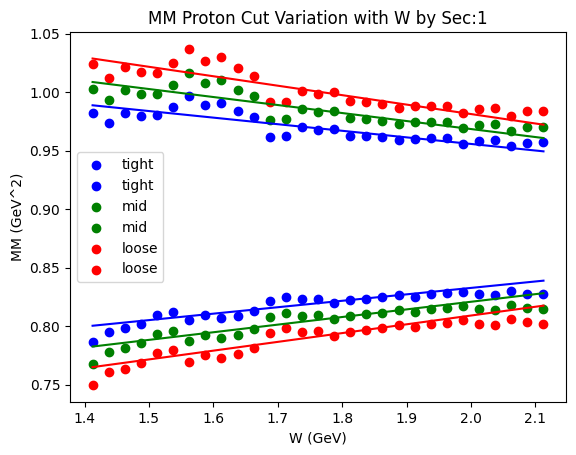

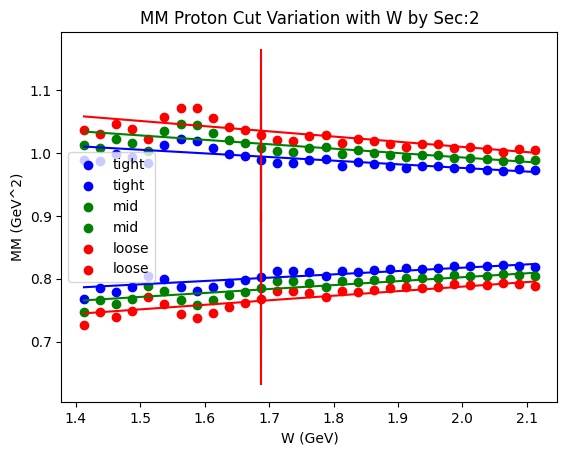

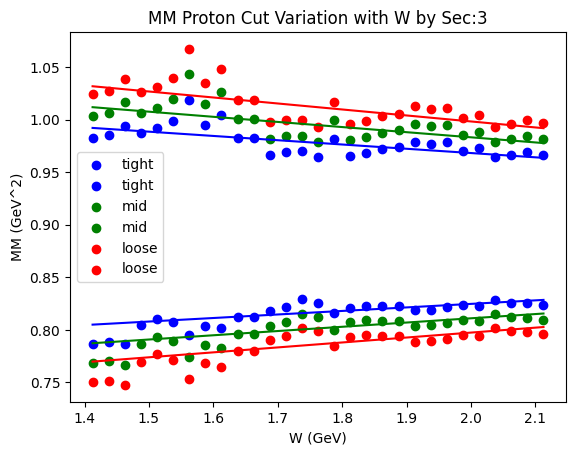

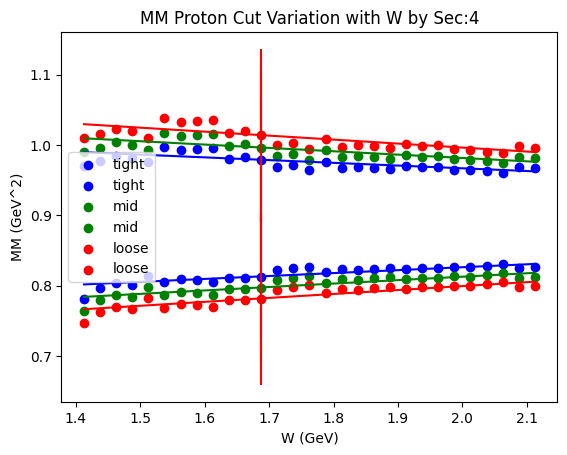

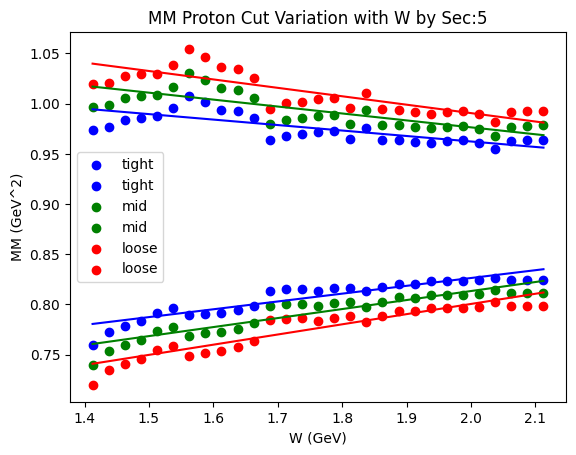

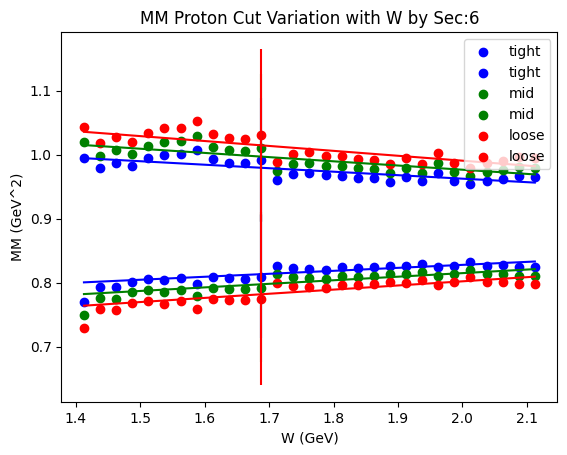

In [10]:
W_bins = [W_center(i) for i in range(_W_bins_)]

def Linear(x_,a_,b_):
    return a_ + b_*x_

lin_fit = np.zeros((6,2,3,2))

for sec in range(6):
#     y_tight_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
#     y_tight_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][0] for Wbin in range(_W_bins_)])
#     y_mid_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
#     y_mid_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][1] for Wbin in range(_W_bins_)])
#     y_loose_w1 = Remove_Zeros_Y([cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)])
#     y_loose_w2 = Remove_Zeros_Y([cut_bounds[sec][Wbin][1][2] for Wbin in range(_W_bins_)])
#     #x_tight = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
#     x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
    for i in range(3):
        for j in range(2):
            x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][j][i] for Wbin in range(_W_bins_)])
            y = Remove_Zeros_Y([cut_bounds[sec][Wbin][j][i] for Wbin in range(_W_bins_)])
            if j ==0:
                plt.scatter(x,y,color=color_order[i],label=cut_names[i])
                plt.errorbar(x,y,color=color_order[i],yerr=[cut_bounds_err[sec][Wbin][j][i] for Wbin in range(_W_bins_)],ls='')
            else:
                plt.scatter(x,y,color=color_order[i],label=cut_names[i])
                plt.errorbar(x,y,color=color_order[i],yerr=[cut_bounds_err[sec][Wbin][j][i] for Wbin in range(_W_bins_)],ls='')
            try:
                pars, pars_cov = op.curve_fit(Linear,x,y,sigma=[cut_bounds_err[sec][Wbin][j][i] for Wbin in range(_W_bins_)],maxfev=5000)
                cont_x = np.linspace(np.min(x),np.max(x),200)
                plt.plot(cont_x,Linear(cont_x,*pars),color=color_order[i])
                lin_fit[sec][j][i][0] = pars[1]
                lin_fit[sec][j][i][1] = pars[0]
            except RuntimeError:
                print("runtime error")
            except ValueError:
                print("Value error")
#     plt.scatter(x,y_tight_w1,color='b',label="tight +-{}\u03C3".format(tight))
#     plt.scatter(x,y_tight_w2,color='b',)
#     plt.scatter(x,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
#     plt.scatter(x,y_mid_w2,color='g')
#     plt.scatter(x,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
#     plt.scatter(x,y_loose_w2,color='r')
#     plt.errorbar(x,y_tight_w1,color='b',yerr=cut_bounds[sec][_W_bins_][0][0])
#     plt.scatter(x,y_tight_w2,color='b',)
#     plt.scatter(x,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
#     plt.scatter(x,y_mid_w2,color='g')
#     plt.scatter(x,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
#     plt.scatter(x,y_loose_w2,color='r')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][0],_W_min_,_W_max_,color='b',label="W range tight +-{}\u03C3".format(tight))
#     plt.hlines(cut_bounds[sec][_W_bins_][1][0],_W_min_,_W_max_,color='b')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][1],_W_min_,_W_max_,color='g',label="W range mid +-{}\u03C3".format(mid))
#     plt.hlines(cut_bounds[sec][_W_bins_][1][1],_W_min_,_W_max_,color='g')
#     plt.hlines(cut_bounds[sec][_W_bins_][0][2],_W_min_,_W_max_,color='r',label="W range loose +-{}\u03C3".format(loose))
#     plt.hlines(cut_bounds[sec][_W_bins_][1][2],_W_min_,_W_max_,color='r')
    plt.legend()
    plt.title("MM {} Cut Variation with W by Sec:{}".format(Particle,sec+1))
    plt.xlabel("W (GeV)")
    plt.ylabel("MM (GeV^2)")
    plt.show()
    
    
    
    

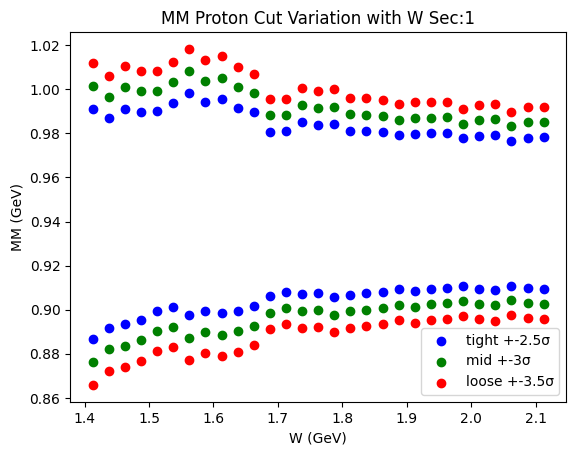

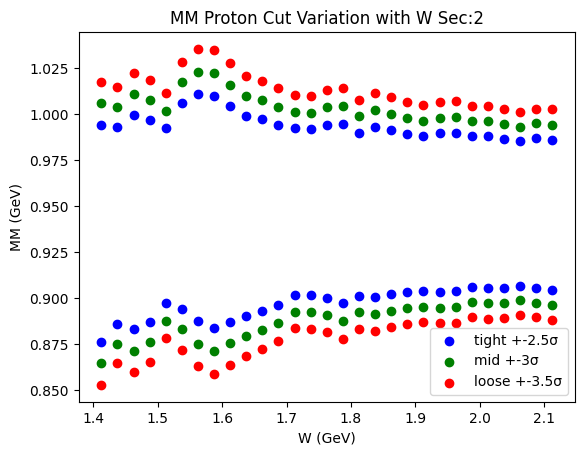

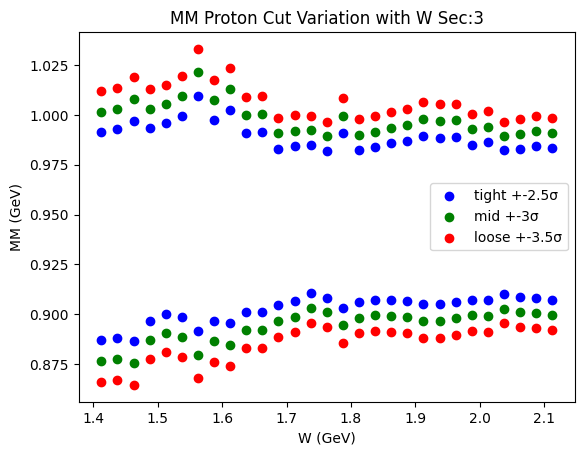

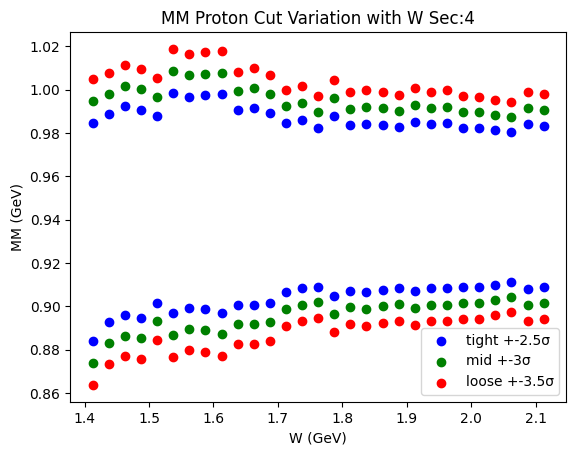

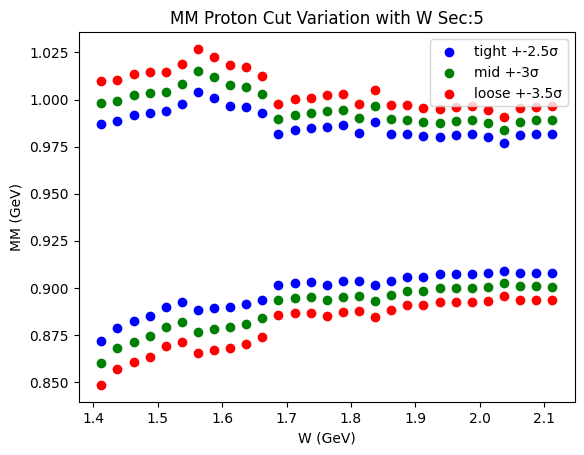

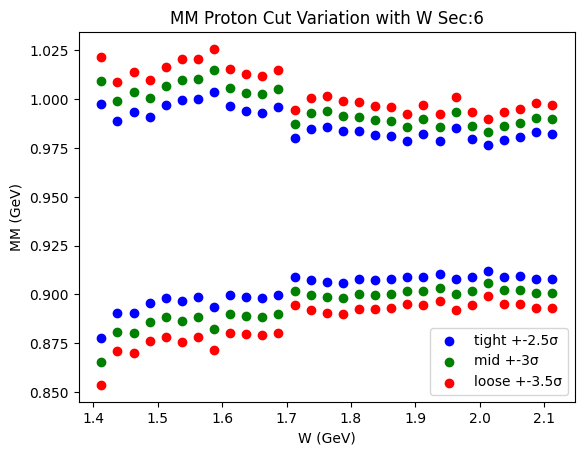

In [12]:
for sec in range(6):
    y_tight_w1 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][0])*math.sqrt(sign(cut_bounds[sec][Wbin][0][0])*cut_bounds[sec][Wbin][0][0]) for Wbin in range(_W_bins_)])
    y_tight_w2 = Remove_Zeros_Y([math.sqrt(cut_bounds[sec][Wbin][1][0]) for Wbin in range(_W_bins_)])
    y_mid_w1 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][1])*math.sqrt(sign(cut_bounds[sec][Wbin][0][1])*cut_bounds[sec][Wbin][0][1]) for Wbin in range(_W_bins_)])
    y_mid_w2 = Remove_Zeros_Y([math.sqrt(cut_bounds[sec][Wbin][1][1]) for Wbin in range(_W_bins_)])
    y_loose_w1 = Remove_Zeros_Y([math.sqrt(sign(cut_bounds[sec][Wbin][0][2])*cut_bounds[sec][Wbin][0][2]) for Wbin in range(_W_bins_)])
    y_loose_w2 = Remove_Zeros_Y([sign(cut_bounds[sec][Wbin][0][2])*math.sqrt(cut_bounds[sec][Wbin][1][2]) for Wbin in range(_W_bins_)])
    #x_tight = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][0] for Wbin in range(_W_bins_)])
    x = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][1] for Wbin in range(_W_bins_)])
    #x_loose = Remove_Zeros_X(W_bins,[cut_bounds[sec][Wbin][0][2] for Wbin in range(_W_bins_)])
    plt.scatter(x,y_tight_w1,color='b',label="tight +-{}\u03C3".format(tight))
    plt.scatter(x,y_tight_w2,color='b',)
    plt.scatter(x,y_mid_w1,color='g',label="mid +-{}\u03C3".format(mid))
    plt.scatter(x,y_mid_w2,color='g')
    plt.scatter(x,y_loose_w1,color='r',label="loose +-{}\u03C3".format(loose))
    plt.scatter(x,y_loose_w2,color='r')
#     plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][0][0]),_W_min_,_W_max_,color='b',label="W range tight +-{}\u03C3".format(tight))
#     plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][1][0]),_W_min_,_W_max_,color='b')
#     plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][0][1]),_W_min_,_W_max_,color='g',label="W range mid +-{}\u03C3".format(mid))
#     plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][1][1]),_W_min_,_W_max_,color='g')
#     plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][0][2]),_W_min_,_W_max_,color='r',label="W range loose +-{}\u03C3".format(loose))
#     plt.hlines(math.sqrt(cut_bounds[sec][_W_bins_][1][2]),_W_min_,_W_max_,color='r')
    plt.legend()
    plt.title("MM {} Cut Variation with W Sec:{}".format(Particle,sec+1))
    plt.xlabel("W (GeV)")
    plt.ylabel("MM (GeV)")
    plt.show()

/var/folders/9h/zwsh0vf94zxdp3tw1qp_dcjw0000gn/T/ipykernel_76422/3464511370.py:5: RuntimeWarning: invalid value encountered in double_scalars
  return np.sqrt(2)*2*m_*g_*bw_gamma(m_,g_)*sign(m_)/(np.pi*np.sqrt(m_*m_+bw_gamma(m_,g_)))


<function matplotlib.pyplot.show(close=None, block=None)>

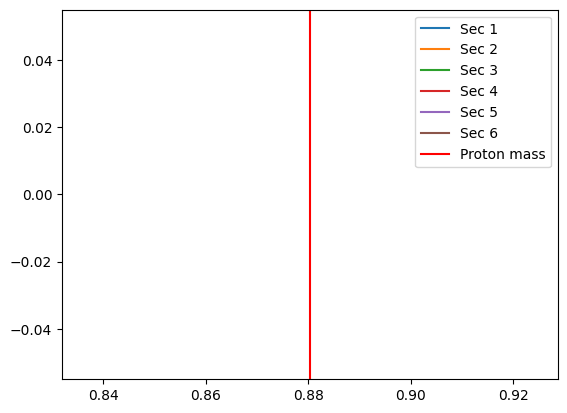

In [13]:
Wbin = _W_bins_
m_par = 0.938272088
for sec in range(6):
    plt.plot(tmp_x1,BW_e2(tmp_x1,*bw_pars[sec][Wbin]),label="Sec {}".format(sec+1))
plt.axvline(x=m_par*m_par,label="{} mass".format(Particle),color='r')
plt.legend()
plt.show

In [15]:
print("MM^2 "+Particle+" Cut Bounds [sec][low/high][tight/mid/loose][slope,intercept]")
for sec in range(6):
    for side in range(2):
        for t in range(3):
            for p in range(2):
                if p ==0:
                    if t == 0:
                        if side ==0:
                            if sec==0:
                                print("{\t{\t{\t{",lin_fit[sec][side][t][p],end=",")
                            else:
                                print("\t{\t{\t{",lin_fit[sec][side][t][p],end=",")
                        else:
                            print("\t\t{\t{",lin_fit[sec][side][t][p],end=",")
                    else:
                        print("{",lin_fit[sec][side][t][p],end=",")
                elif p==1:
                    if t == 2:
                        if side == 1:
                            if sec == 5:
                                print(lin_fit[sec][side][t][p],"}}}}")
                            else:
                                print(lin_fit[sec][side][t][p],"}}},")
                        else: 
                            print(lin_fit[sec][side][t][p],"}},")
                    else:
                        print(lin_fit[sec][side][t][p],end="},")
                else: 
                     print(lin_fit[sec][side][t][p],end=",")


MM^2 Proton Cut Bounds [sec][low/high][tight/mid/loose][slope,intercept]
{	{	{	{ 0.05505238004565683,0.7225366328915213},{ 0.06515842543064582,0.6904797475897259},{ 0.07506785206374858,0.6588937273505628 }},
		{	{ -0.05624455637210263,1.0682060053891018},{ -0.06842252980026937,1.1052986173066357},{ -0.08079270291348142,1.1428570764836326 }}},
	{	{	{ 0.052751995267531784,0.7120356411722629},{ 0.06263122589531671,0.6771944289008786},{ 0.07229785517429965,0.6429194876913626 }},
		{	{ -0.05776383653765842,1.0915917861799949},{ -0.06998550003847398,1.132662307124745},{ -0.08241957071830752,1.174298173634105 }}},
	{	{	{ 0.03360082985958923,0.7574714705495609},{ 0.040369942473958906,0.7302193838584824},{ 0.04701895619529039,0.7033221301038246 }},
		{	{ -0.04068440933051735,1.0495563405895088},{ -0.04877974773207946,1.0807193746919934},{ -0.05699396829464629,1.1122368506129012 }}},
	{	{	{ 0.04163188233664301,0.7428211555010931},{ 0.048912803658508267,0.714782690736894},{ 0.0560511275552968,0.6

In [23]:
# print("MM^2 "+Particle+" Cut Bounds [sec][low/high][tight/mid/loose]")
# for sec in range(6):
#     for side in range(2):
#         for t in range(3):
#             if t == 0:
#                 if side ==0:
#                     if sec==0:
#                         print("{\t{\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#                     else:
#                         print("\t{\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#                 else:
#                     print("\t\t{",cut_bounds[sec][_W_bins_][side][t],end=",")
#             elif t == 2:
#                 if side == 1:
#                     if sec == 5:
#                         print(cut_bounds[sec][_W_bins_][side][t],"}}}")
#                     else:
#                         print(cut_bounds[sec][_W_bins_][side][t],"}},")
#                 else: 
#                     print(cut_bounds[sec][_W_bins_][side][t],"},")
#             else: 
#                 print(cut_bounds[sec][_W_bins_][side][t],end=",")



In [24]:
# print("MM^2 "+Particle+" Linear Cut Bounds [sec][low/high][tight/mid/loose]")
# for sec in range(6):
#     for side in range(2):
#         for t in range(3):
#             if t == 0:
#                 if side ==0:
#                     if sec==0:
#                         print("{\t{\t{","\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}",end=",")
#                     else:
#                         print("\t{\t{","\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}",end=",")
#                 else:
#                     print("\t{","\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}",end=",")
#             elif t == 2:
#                 if side == 1:
#                     if sec == 5:
#                         print("\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}","}}}")
#                     else:
#                         print("\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}","}},")
#                 else: 
#                     print("\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}","},")
#             else: 
#                 print("\t{",0,",",cut_bounds[sec][_W_bins_][side][t],"}",end=",")